<a href="https://colab.research.google.com/github/mirzattar/langfilter-research/blob/main/Penelitian_CS_LPB_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
!pip freeze

absl-py==1.4.0
absolufy-imports==0.3.1
accelerate==1.10.0
aiofiles==24.1.0
aiohappyeyeballs==2.6.1
aiohttp==3.12.15
aiosignal==1.4.0
alabaster==1.0.0
albucore==0.0.24
albumentations==2.0.8
ale-py==0.11.2
altair==5.5.0
annotated-types==0.7.0
antlr4-python3-runtime==4.9.3
anyio==4.10.0
anywidget==0.9.18
argon2-cffi==25.1.0
argon2-cffi-bindings==25.1.0
array_record==0.7.2
arviz==0.22.0
astropy==7.1.0
astropy-iers-data==0.2025.8.18.0.40.14
astunparse==1.6.3
atpublic==5.1
attrs==25.3.0
audioread==3.0.1
Authlib==1.6.1
autograd==1.8.0
babel==2.17.0
backcall==0.2.0
beartype==0.21.0
beautifulsoup4==4.13.4
betterproto==2.0.0b6
bigframes==2.15.0
bigquery-magics==0.10.2
bleach==6.2.0
blinker==1.9.0
blis==1.3.0
blobfile==3.0.0
blosc2==3.7.1
bokeh==3.7.3
Bottleneck==1.4.2
bqplot==0.12.45
branca==0.8.1
Brotli==1.1.0
build==1.3.0
CacheControl==0.14.3
cachetools==5.5.2
catalogue==2.0.10
certifi==2025.8.3
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.4.3
chex==0.1.90
clarabel==0.11.1
click==8.2.1
cl

## Download dataset
1. Alignment
 * https://www.kaggle.com/datasets/reihanenamdari/youtube-toxicity-data
2. Form data
 * https://drive.google.com/file/d/1G9Se6XFrJ8K0RRBnhZX6yidCj-jw7tcY/view

In [1]:
!mkdir data
!wget -O data/form_extraction.csv 'https://drive.google.com/uc?export=download&id=1G9Se6XFrJ8K0RRBnhZX6yidCj-jw7tcY'

--2025-08-24 08:04:10--  https://drive.google.com/uc?export=download&id=1G9Se6XFrJ8K0RRBnhZX6yidCj-jw7tcY
Resolving drive.google.com (drive.google.com)... 142.251.188.100, 142.251.188.102, 142.251.188.138, ...
Connecting to drive.google.com (drive.google.com)|142.251.188.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1G9Se6XFrJ8K0RRBnhZX6yidCj-jw7tcY&export=download [following]
--2025-08-24 08:04:10--  https://drive.usercontent.google.com/download?id=1G9Se6XFrJ8K0RRBnhZX6yidCj-jw7tcY&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.142.132, 2607:f8b0:400e:c1b::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.142.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2644 (2.6K) [application/octet-stream]
Saving to: ‘data/form_extraction.csv’

data/form_extractio 100%[===================>]   2.58

In [2]:
import kagglehub
ytToxicPath = kagglehub.dataset_download("reihanenamdari/youtube-toxicity-data")
print(ytToxicPath)

/kaggle/input/youtube-toxicity-data


## Install dep
latest master has patches for CUDA accel issues

In [3]:
!pip install -U 'git+https://github.com/huggingface/transformers.git' torch

  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-xowpa_l7
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-xowpa_l7
  Resolved https://github.com/huggingface/transformers.git to commit 4f9b4e62bc52a52b19a6a4a1a6bfc61a3f5b65b1
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for transformers: filename=transformers-4.56.0.dev0-py3-none-any.whl size=12589494 sha256=05ba39030c29b4e10a09c746c2544283b319454ee0b281e10ef612db7489683c
  Stored in directory: /tmp/pip-ephem-wheel-cache-neaj6cax/wheels/54/cb/3f/83103de5575c534436d6a4686686dead458238dfaf1147e98d
Successfully built transformers
  Attempting uninstall: transformers
    Found existing installation: transformers 4.55.2
    Uninstalling transformers-4.55.2:
      Successfully uninstalled transformers-4.55.2


## Inference
Model page: https://huggingface.co/unitary/toxic-bert

### Setup
run once

In [ ]:
from transformers import AutoTokenizer
import torch
import pandas

device = "cuda" if torch.cuda.is_available() else "cpu"

model = torch.hub.load('unitaryai/detoxify','multilingual_toxic_xlm_r')
model.to(device)
model.eval()

tokenizer = AutoTokenizer.from_pretrained("unitary/multilingual-toxic-xlm-roberta")

LABELS = [
    "toxicity",
    "severe_toxicity",
    "obscene",
    "threat",
    "insult",
    "identity_attack",
    "sexual_explicit",
    "male",
    "female",
    "homosexual_gay_or_lesbian",
    "christian",
    "jewish",
    "muslim",
    "black",
    "white",
    "psychiatric_or_mental_illness",
]

def runModel(context, query):
  inputs = tokenizer(
      context, query,
      return_tensors = "pt",
      truncation = True,
      padding = 'max_length'
    ).to(device)

  with torch.no_grad():
    logits = model(**inputs).logits

  probabilities = torch.sigmoid(logits).cpu().numpy()[0]

  pandas.options.display.width = 160
  return pandas.DataFrame(data=[probabilities], columns=LABELS)

# print(runModel("bonjour buddies", "va te faire foutre, ta mère !"))
# print("---")
# print(runModel("bonjour buddies", "greetings!"))

/usr/local/lib/python3.12/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(


Downloading: "https://github.com/unitaryai/detoxify/zipball/master" to /root/.cache/torch/hub/master.zip
Downloading: "https://github.com/unitaryai/detoxify/releases/download/v0.4-alpha/multilingual_debiased-0b549669.ckpt" to /root/.cache/torch/hub/checkpoints/multilingual_debiased-0b549669.ckpt


100%|██████████| 1.04G/1.04G [00:35<00:00, 31.4MB/s]
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/615 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.10M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/211 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/635 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

### Example 0
manual input

In [ ]:
# @title Input
context_input = "" # @param {"type":"string"}
query_input = "" # @param {"type":"string"}
display(runModel(context_input, query_input))

### Example 1
simple context and query

In [ ]:
def compareInputs(context1, context2, query1, query2):
  print(f"--- {context1}, {query1}")
  display(runModel(context1, query1))

  print(f"--- {context1}, {query2}")
  display(runModel(context1, query2))

  print(f"--- {context2}, {query1}")
  display(runModel(context2, query1))

  print(f"--- {context2}, {query2}")
  display(runModel(context2, query2))

compareInputs(
  "which country is the stupidest?", "which country is the most populous?",
  "india", "china"
)

compareInputs(
  "you know what's heavy", "you know what's heavy",
  "a whale?", "your mom?"
)


--- which country is the stupidest?, india


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.959712,0.000493,0.022837,0.03461,0.794045,0.001357,0.000643,0.001133,0.001064,0.000547,0.000072,0.000354,0.000174,0.011276,0.003305,0.000126


--- which country is the stupidest?, china


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.970978,0.000283,0.010318,0.040051,0.890909,0.001137,0.000463,0.002346,0.00137,0.000366,0.000084,0.000203,0.000176,0.013052,0.002976,0.000134


--- which country is the most populous?, india


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000654,0.000372,0.003843,0.000801,0.002616,0.000201,0.000147,0.00028,0.001095,0.000062,0.00019,0.000216,0.000116,0.000159,0.00032,0.000129


--- which country is the most populous?, china


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000786,0.000204,0.002625,0.000476,0.001705,0.000131,0.000107,0.000376,0.000807,0.00005,0.000108,0.000104,0.000079,0.000178,0.000231,0.000071


--- you know what's heavy, a whale?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001264,0.000022,0.000292,0.00008,0.000522,0.000048,0.000036,0.000552,0.000143,0.000023,0.000075,0.000026,0.000041,0.000064,0.000074,0.000026


--- you know what's heavy, your mom?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.029034,0.000065,0.002529,0.000449,0.009844,0.000215,0.00046,0.000532,0.058153,0.000029,0.000019,0.000021,0.000045,0.000115,0.000163,0.000022


--- you know what's heavy, a whale?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001264,0.000022,0.000292,0.00008,0.000522,0.000048,0.000036,0.000552,0.000143,0.000023,0.000075,0.000026,0.000041,0.000064,0.000074,0.000026


--- you know what's heavy, your mom?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.029034,0.000065,0.002529,0.000449,0.009844,0.000215,0.00046,0.000532,0.058153,0.000029,0.000019,0.000021,0.000045,0.000115,0.000163,0.000022


### Example 2
youtube toxic comments raw queries

In [ ]:
# @title Teks judul default
iterationCount = None # @param {"type":"raw","placeholder":"10"}
import csv
# /kaggle/input/youtube-toxicity-data/youtoxic_english_1000.csv
with open(ytToxicPath + "/youtoxic_english_1000.csv", newline='') as csvFile:
  reader = csv.DictReader(csvFile)
  for row in reader:
    if iterationCount:
      print(row["Text"])
      display(runModel("", row["Text"]))
      iterationCount -= 1

      if iterationCount <= 0:
        break

    else:
      print(row["Text"])
      display(runModel("", row["Text"]))

If only people would just take a step back and not make this case about them, because it wasn't about anyone except the two people in that situation.  To lump yourself into this mess and take matters into your own hands makes these kinds of protests selfish and without rational thought and investigation.  The guy in this video is heavily emotional and hyped up and wants to be heard, and when he gets heard he just presses more and more.  He was never out to have a reasonable discussion.  Kudos to the Smerconish for keeping level the whole time and letting Masri make himself out to be a fool.  How dare he and those that tore that city down in protest make this about themselves and to dishonor the entire incident with their own hate.  By the way, since when did police brutality become an epidemic?  I wish everyone would just stop pretending like they were there and they knew EXACTLY what was going on, because there's no measurable amount of people that honestly witnessed this incident, so

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.3704,0.000113,0.00246,0.000127,0.305396,0.000187,0.00021,0.067508,0.000196,0.000071,0.000095,0.000087,0.000071,0.000393,0.000286,0.00272


Law enforcement is not trained to shoot to apprehend.  They are trained to shoot to kill.  And I thank Wilson for killing that punk bitch.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994595,0.084128,0.95119,0.020171,0.958457,0.537639,0.106648,0.013187,0.024382,0.002797,0.008734,0.008039,0.021897,0.008366,0.004096,0.021765



Dont you reckon them 'black lives matter' banners being held by white cunts is  kinda patronizing and ironically racist. could they have not come up with somethin better.. or is it just what white folks do to give them selves pride. 'ooo look at me im being nice for the black people' why does it always have to be about race actually the whole world is pussyfootin around for fear of being racist. its fuckin daft man.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.989107,0.11512,0.856044,0.868161,0.950889,0.027736,0.198296,0.824576,0.006916,0.028586,0.014911,0.004585,0.013134,0.996107,0.994825,0.010297


There are a very large number of people who do not like police officers. They are called Criminals and its the reason we have police officers. The fact that Criminals do not like police officers is a testament to the good work that police officers do in protecting the public. When our children or our family are in danger, we do not hessitate to call for help, and we call the Police. Its about time people stopped complaining and started to give the Police some respect for the hard work and dedication that often requires them to put their lives on the line, to serve the public.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00198,0.000015,0.000143,0.000091,0.00102,0.000023,0.000021,0.00025,0.000094,0.000028,0.000089,0.000022,0.000043,0.000065,0.000115,0.000145


The Arab dude is absolutely right, he should have not been shot 6 extra time. Shoot him once if hes attacking you and that would stop his attack. Shoot him twice if he's still attacking you, but six times? That is shoot to kill in my opinion. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.904871,0.005155,0.005832,0.0986,0.015573,0.861878,0.004154,0.006576,0.0013,0.00284,0.006267,0.009307,0.025618,0.006557,0.00538,0.00566


here people his facebook is https://www.facebook.com/bassem.masri.520 he has ties with isis and other terrorist groups he is a muslim extremist 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.679453,0.00069,0.003998,0.634613,0.202543,0.002145,0.000929,0.000477,0.00106,0.000812,0.002011,0.001585,0.996694,0.001574,0.00168,0.000525


Check out this you tube post. "Black man goes on an epic rant against Ferguson rioters."

Although his message is delivered with childish, cartoon-ish emotions.... He is one of the very few African American's who gets it.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.256163,0.00109,0.002445,0.168301,0.048101,0.004786,0.001221,0.968462,0.000976,0.000854,0.001299,0.002461,0.002878,0.988975,0.012878,0.001125


I would LOVE to see this pussy go to Staten Island and spit on a cop. I would LOVE to see it happen. Mike Brown was a strong arm thug and people are burning Ferguson down. Eric Garnier did nothing wrong and was choked to death. No protest on mafia controlled Staten Island. No burning cars. Nothing. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.967396,0.019273,0.665707,0.005045,0.425279,0.098833,0.780729,0.004063,0.003014,0.00369,0.001327,0.001887,0.002584,0.011121,0.001791,0.004337


I agree with the protestor.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000559,0.000022,0.000136,0.000132,0.000232,0.000043,0.000022,0.000246,0.000267,0.000032,0.000135,0.000044,0.000112,0.00007,0.000114,0.000043


mike browns father was made to say that boooshit


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.942606,0.010682,0.847599,0.004334,0.24587,0.002762,0.009518,0.03628,0.008604,0.000841,0.000714,0.002655,0.000495,0.008204,0.021028,0.000992


the guy on the right is so on point. don't judge on his speaking abilities but judge him on his messege! you racist fucks can suck my dick. and like always the media focusing on the thing that don't matter. CNN is shit.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.996544,0.177712,0.984734,0.044919,0.96411,0.018773,0.840302,0.383869,0.021062,0.068988,0.018875,0.013405,0.019802,0.037242,0.024738,0.034929


moral of the story, don't reach for a cops gun because you're probably gunna get shot, white or black


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.795074,0.006151,0.00842,0.727085,0.044303,0.078654,0.006372,0.002659,0.000876,0.002284,0.002786,0.002559,0.003195,0.99736,0.970821,0.002892


Masri is about as close as you can get to ISIS in America.  


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.008513,0.000046,0.00026,0.001867,0.000678,0.000522,0.000081,0.000235,0.000071,0.000027,0.00005,0.000072,0.00082,0.000064,0.000137,0.000082


We all know with the chimpers there is no compassion in their mud pumping hearts. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.14939,0.000019,0.000415,0.000414,0.133226,0.000088,0.000079,0.00081,0.00013,0.000051,0.000961,0.000021,0.000054,0.000028,0.000064,0.000028


"I can believe whatever I wanna believe, I don't care what any of them have to say."
Bassem Masri, you are an idiot.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995618,0.000531,0.01107,0.00139,0.990987,0.001059,0.000906,0.007327,0.007127,0.00083,0.00144,0.000974,0.000714,0.001845,0.001146,0.001207


Bassem Masri is a terrorist part of isis


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.825411,0.000609,0.01689,0.002766,0.591044,0.002821,0.000806,0.000307,0.00039,0.000082,0.000192,0.000291,0.000315,0.000268,0.000234,0.006909


I would'nt waist my time trying to reason with this Police spitting Thug.  Trying to defend Criminal Brown is a losing matter.  The Grand Jury has made they're decision.   Live with it.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.163134,0.000053,0.001571,0.000175,0.125388,0.000257,0.000327,0.000686,0.00039,0.000044,0.000051,0.000022,0.000048,0.000207,0.000164,0.000197


I wish mr masri was dead,,


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.866629,0.002759,0.005595,0.010023,0.025593,0.778192,0.002272,0.006879,0.001631,0.001009,0.003029,0.001517,0.010177,0.004985,0.002968,0.002896


Thus, with a collapse of the USA, only two possibilities can be considered, whereby, with the one, it boils down to a dictatorship with evil reprisals, while the other possibility may be a new reconstruction, if people who are fundamentally conscious of their responsibilities attain government and really do everything to bring about an effective and valuable new start. But whether this will actually occur, is currently extremely questionable, because presently, in a totalitarian manner, everything is directed towards interests which are economic, military, political and cultural – as well as towards that which is strict fundamentalist religious-sectarian – and based on enormous lies and devious, misanthropic, criminal and felonious machinations in every imaginable regard. This also means that the population of the USA is spied upon by the secret services and even severely within the neighbourhoods, and so forth, and, in every possible manner being restricted in its freedom, and this is

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004947,0.000011,0.000091,0.000225,0.001985,0.000016,0.000013,0.000405,0.000053,0.000069,0.000144,0.000096,0.000112,0.00009,0.000323,0.000017


You actually CAN shout "fire" in a crowded theater. Christopher Hitchens demonstrated this in his talk about "free speech." Look it up. The interviewee is correct. Cops serve the public, not the other way around. And it is consistent with serving that public that the police department represent that public's race and ethnicity in its ranks. Hire a bunch of big, tough, black guys to the police department and you will have fewer blacks being shot to death by a puny white guy who felt humiliated when he got bitch slapped by a teenager. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.928984,0.019277,0.360219,0.757378,0.625508,0.018595,0.030956,0.114149,0.001656,0.005167,0.002795,0.001548,0.000921,0.997352,0.98849,0.00158


I think ,he kill him


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.912562,0.005413,0.007228,0.007828,0.0171,0.851399,0.009528,0.013642,0.004649,0.003417,0.003333,0.005559,0.017121,0.007557,0.006409,0.005783


LEGALIZE MARIJUANA! Then problems will stop


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.041988,0.000411,0.003396,0.00348,0.001844,0.006008,0.000555,0.000151,0.000066,0.000104,0.000136,0.000424,0.001075,0.000099,0.000144,0.000247


1 word: Provocateur........


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.335441,0.000053,0.001228,0.000174,0.282771,0.000391,0.000215,0.015863,0.000298,0.000046,0.000045,0.000024,0.000036,0.000068,0.000265,0.000288


Lol. This is what happens when the greedy rich slime keep the masses uneducated & ignorant. Now deal with the stupid that you created. Trying to reason with the irrational is an exercise in futility. Get the popcorn ready bc it's about to boil over. If you fall for the talk you will fall just walking. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990734,0.000256,0.002508,0.001294,0.987588,0.001091,0.000557,0.004123,0.002594,0.000816,0.000979,0.000724,0.000936,0.000937,0.000887,0.002112


The legal system is inherently racist, same as this CNN reporter


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.380494,0.000032,0.000486,0.002159,0.176492,0.000149,0.000081,0.000142,0.000174,0.00007,0.000106,0.00006,0.00005,0.000349,0.000489,0.000055


He looks ready to cut heads off he must be a isis sympathizer and I'm going to say maybe 5% care about the issue at hand and other 95% just want to go loot stores and fuck shit up...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.940299,0.012417,0.872105,0.002633,0.262537,0.038394,0.045475,0.004629,0.00779,0.001251,0.00124,0.001627,0.001069,0.00259,0.002227,0.001884


lol, "shoot to apprehend". He is an idiot.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994888,0.000488,0.006766,0.0015,0.990377,0.002247,0.000789,0.006875,0.005423,0.000747,0.000791,0.000769,0.000798,0.00219,0.001131,0.002663


This case has overshadowed the cops that murdered a kid with a fake sword in Saratoga Springs, Utah. I am just as much outraged by the Mike brown case. The murder that happened in Utah was just about the same deal. Cops are provided with non lethal weapons. The shooting in Utah unwarranted because he ran, don't know why he ran but if you lunged at the police with the fake sword you should have taken that opportunity for immediate action right then. He ran and was shot 6 times in the back. We know a large group of cops are corrupt and these murderers are nothing new. Though I have ran from the police many times when I was in my teens, cops just pursue and find him hiding some where. Not just put 6 bullets in the back ending a life. They said in some paper, Saratoga Springs has about 5% of black population.. I have been through there and I would say they were off by about 5%. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.042036,0.000163,0.000504,0.011504,0.004526,0.00112,0.000181,0.003733,0.000145,0.00004,0.000218,0.00012,0.000771,0.889507,0.003369,0.000317


This man is a zionist jew look at ypu can see the jewnesss in his face  cnn only employ zionist sympathisers and neo-con racists and wolf blitzer is the emplpyeee 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.625436,0.004583,0.006997,0.246287,0.263907,0.007696,0.001846,0.890402,0.002027,0.002747,0.001843,0.992453,0.008193,0.005698,0.025049,0.002272


"There is blood on the street but you are worried about words" .... we are ALL getting very tired with the way mainstream media is treating us like idiots who will follow their condescending, irrelevant, distracting, disparaging narrative... Step up CNN


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.987537,0.000235,0.004326,0.000828,0.984022,0.000483,0.000545,0.002579,0.001968,0.000505,0.000802,0.000429,0.000593,0.001123,0.000787,0.001492


stop being criminals and you wont get shot, that simple


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.69734,0.001293,0.008502,0.006743,0.033575,0.478825,0.00221,0.004901,0.000414,0.000149,0.000262,0.000347,0.000641,0.002347,0.001387,0.001196


I LIKE TURTLES!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.034837,0.000068,0.001928,0.000638,0.01157,0.000406,0.000207,0.000258,0.000396,0.000072,0.000043,0.000032,0.000042,0.000268,0.000131,0.000053


Massri needs an education.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004178,0.000042,0.000386,0.000179,0.002313,0.000189,0.000052,0.000336,0.000046,0.000024,0.000034,0.000033,0.000056,0.000079,0.000183,0.000318


CNN mother fuckers....fuck you peace of shit!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.996764,0.438433,0.993356,0.027818,0.950931,0.032939,0.631383,0.093447,0.246868,0.03563,0.026856,0.11791,0.022123,0.094313,0.05562,0.136327


Hers my statement, I think ali sheep butt fucker masri should take an ak and go fight in syria..


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.970674,0.027038,0.87411,0.020571,0.470462,0.045879,0.454271,0.003985,0.004598,0.003279,0.000745,0.002895,0.002448,0.006148,0.004218,0.002118


Hahahahaha.  This guy is Ed Bassmaster's character ALWAYS TESTE. Ed Bassmaster has a semi-retarded character who is cross-eyed just like this guy


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.05374,0.000037,0.000623,0.000352,0.024422,0.000099,0.000096,0.013171,0.000056,0.000048,0.000035,0.000016,0.000025,0.000223,0.000546,0.000081


How do these childish cops sleep at night ?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.210691,0.000034,0.001761,0.000394,0.162568,0.000117,0.000168,0.001386,0.000429,0.000078,0.000067,0.000013,0.000037,0.000086,0.000131,0.000046


A completely idiot having his minutrs of fame


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.968593,0.000269,0.018043,0.000666,0.916568,0.00046,0.00065,0.001344,0.000506,0.000507,0.000325,0.000221,0.000091,0.001326,0.000409,0.000362


I hope to god you guys is still not falling for the same ol banana in the tailpipe bullshit news that they're giving you


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.919203,0.006397,0.864054,0.00347,0.235533,0.006223,0.00757,0.007378,0.001382,0.000984,0.002353,0.001074,0.000944,0.002632,0.001961,0.001064


CNN is such Bullcrap!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.503348,0.000549,0.125705,0.000851,0.236561,0.00048,0.001441,0.000694,0.000821,0.000474,0.000163,0.000085,0.000211,0.00042,0.000448,0.000168


Alright. This entire case is crap. All of these people who are saying that white people are being racist, and calling them bad names is just as "racist", as you would like to call it, as us. There have been extensive investigations that prove that this boy's death was out of self defense. However, I am not defending the whole KKK thing. But, I am defending the helpless citizens of Ferguson. This boy died. I don't care if he was white or black. What I do care about is how the people in Ferguson are treating their town. If they really cared about this incident, they would hold memorials to express their feelings.This is not helping themselves get justice. What really matters is that this boy is dead. Something HAS been done about it. The Grand Jury has decided. Can it just be over?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.877845,0.019768,0.385771,0.184935,0.61726,0.006948,0.008909,0.0257,0.00212,0.00367,0.00152,0.004717,0.000689,0.992256,0.998948,0.002959


This guy doesn't know what happened he didn't have his hands up


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003659,0.000049,0.000435,0.000188,0.001195,0.000171,0.000118,0.084337,0.000075,0.000028,0.000088,0.000036,0.00007,0.00021,0.000187,0.000056


Ayy CNN are lookin like pussies 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.967356,0.022525,0.846248,0.004494,0.510915,0.004518,0.810359,0.007949,0.021792,0.003816,0.004266,0.003101,0.002494,0.00657,0.004028,0.004858


Smirconnish is the most even-handed guy in the world.  This guy Masri is an idiot.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.991124,0.001241,0.056285,0.002101,0.965777,0.001479,0.001194,0.268324,0.003982,0.000318,0.000223,0.0008,0.000614,0.003004,0.001166,0.001584


Masri is a total idiot "I don't have to know the evidence, I can just come to my own conclusions instead"
Here is a clue, dont attack a cop and try to take his gun and then rush him after he finally gets out of his car and you wont get shot duhhh.
So what would Masri do, take Brown out for a icecream as he is beating him into the ground and not defend himself?
BTW, Browns momma and gramma violently assaulted some people who were selling T-shirts in memory of Brown and put two people in the hospital, stole their money and trashed their shop and will probably be charged for it, so we all know what sort of mentality Brown was raised in and he was a thug wanna be, who caused his own death.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.984924,0.00049,0.006263,0.000704,0.976081,0.005539,0.001173,0.003894,0.006567,0.000455,0.003078,0.000644,0.000974,0.000544,0.00016,0.0044


He had to take a break because Bassem was making too much sense for him to debate further. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000712,0.000032,0.000254,0.000126,0.000361,0.000041,0.000024,0.00068,0.000057,0.00005,0.000082,0.000077,0.000086,0.000108,0.000203,0.000045


Let's reverse the rolls! Black racist cops in rich white communities.(but you can't prove there racist) When a white man gets pissed off at this intolerable condition. We unload several clips of high caliber ammo at point blank range for his audacity at questioning authority. All Americans need to be on full alert of this elitist agenda to set presidents of questioning authority. The elitist upper-class is the problem. Prison culture CIA drug Cartels. Exporting jobs and importing cheap labor, While the elitist get bailed out and support this corrupt system. We can turn this around when we c get past the race issue the Govt. incites to divide the working class, but you can hardly call it a working class because the Govt put everyone out of work. We are more of a homeless class. Let us not for get Western history and the role big money plays in this clusterfuck designed to destroy a Nation that is Destroyed at this point. We can get it back, ask me how.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.605174,0.002807,0.007348,0.403398,0.278649,0.004336,0.002118,0.72084,0.000531,0.000946,0.001339,0.0007,0.000973,0.99561,0.989712,0.001576


This moron is talking about being peaceful?  Their burning the nation's flag idiot.  Even though that's what you are suppose to do when it's old so they have no knowledge.  They are babies making noise. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.996571,0.000698,0.011012,0.002621,0.994293,0.0012,0.001233,0.005208,0.003803,0.001782,0.001537,0.001411,0.001727,0.003108,0.001136,0.003501


 This is a CIA agent provocateur operative to kick-start the riots of the New American Civil War. He's not African American but his rehearsed "Ebonics" is transparent.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.057078,0.000114,0.000858,0.027608,0.008673,0.000392,0.000156,0.001762,0.000136,0.000035,0.00007,0.00021,0.000269,0.325076,0.000699,0.000076


Can someone shoot this black idiot too? That would make me giggle inside :)


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.998252,0.082888,0.380205,0.834744,0.973427,0.745382,0.052048,0.004181,0.031204,0.008842,0.041649,0.060003,0.037998,0.991243,0.185635,0.014129


You people are sick! This man is speaking the truth and y'all are just mad. Trying to justify why a young boy who did nothing was shot and killed smh. Y'all are the devil and a disease to this earth! I'll be glad when the sun burns all your asses into extinction and we can have our planet back! Half animal half devil cave beasts!!! 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990586,0.0081,0.119098,0.004748,0.977256,0.108864,0.017726,0.901767,0.001021,0.000932,0.004134,0.003842,0.002631,0.003658,0.002002,0.023419


The world is changing im mad at the police too but id be dam if isis gonna come in here thats when its time to kill these faucks


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.975965,0.006516,0.119168,0.012674,0.535763,0.780848,0.014374,0.002576,0.001703,0.001201,0.003006,0.001732,0.003914,0.002838,0.001721,0.00339


CNN is propaganda for the most part, and people let them hear it in Ferguson too.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001148,0.000016,0.000134,0.000107,0.000455,0.000029,0.000017,0.00031,0.00006,0.000032,0.000073,0.000037,0.000067,0.000072,0.000151,0.000038


What a waste of time talking to that idiot. "You know what Im sayin." "I'll believe what I want to believe."- Yup- hell with facts or evidence. Loser.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997944,0.001657,0.023968,0.002491,0.996774,0.002672,0.002206,0.01328,0.0051,0.002847,0.003297,0.003703,0.001999,0.003701,0.004189,0.009035


News fucktards...........puppet players,,,,,all they are paid liars 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.981936,0.00367,0.695809,0.004998,0.946903,0.001249,0.005598,0.002873,0.006661,0.001192,0.0009,0.000839,0.000539,0.003885,0.003067,0.000867


Bassem has the right to express himself....we have freedom of expression.....We all have that right....Its an amendment of the Constitution.....I dont think CNN is that competent after all.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000623,0.000016,0.000109,0.000085,0.00028,0.000022,0.000017,0.000376,0.000115,0.000041,0.000168,0.000038,0.000073,0.000063,0.000151,0.000038


does this guy riot before or after work? Orrrr, let me guess he fucks off all day doing nothing.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.772729,0.00343,0.412671,0.000689,0.050561,0.003293,0.126268,0.106193,0.001549,0.000792,0.000609,0.000659,0.000354,0.000712,0.000847,0.000827


Mr. Masri is 100% right couldn't say it any better myself.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000717,0.000023,0.000161,0.000116,0.000281,0.000046,0.000021,0.000637,0.000058,0.00003,0.000129,0.000048,0.000168,0.000052,0.000131,0.000041


Can anyone tell me why it is racist if a white man shoots a black man? Is it not racist when black man shoots a white man? Why do these cases turn instantly into racist ones it makes no sense.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.417779,0.003072,0.004748,0.426103,0.025666,0.005634,0.003361,0.958986,0.001204,0.001282,0.004083,0.001891,0.004044,0.994657,0.991244,0.001532


Racial profiling and police intimidation? He robbed a store and got killed as a result. Fucking excuses man. Black people shouldn't have to get arrested when they commit a strong arm robbery. When black people get violent they shouldn't have to fear getting put down like an animal. He actually said we shouldn't have to worry about warrants. lol. Fucking piece of human garbage.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.996998,0.133347,0.943806,0.788897,0.992646,0.09171,0.087874,0.657436,0.01582,0.01835,0.018023,0.015183,0.018058,0.99136,0.343677,0.017479


Wrong Mother Fucker. No shoot to apprehend


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.985231,0.061358,0.922525,0.007415,0.35168,0.08661,0.228561,0.019748,0.092501,0.001388,0.002294,0.005065,0.003274,0.00691,0.003181,0.014996


Black and white crimes seems to be big topic in us after Ferguson case. I just came here to brag about Finnish cops that used firearm 6 times last year, 2 time towards human, 2 times to warn 2 times to kill wounded animal. 5 million ppl here and 0,5 gun per capita.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.138543,0.000916,0.001687,0.107403,0.010396,0.001967,0.000883,0.007165,0.00058,0.000389,0.000533,0.000389,0.000939,0.985229,0.994476,0.000816


and the heading reads, When the protesters take it too far


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000926,0.000026,0.000203,0.000137,0.000327,0.000064,0.000031,0.000279,0.000098,0.000024,0.000102,0.000036,0.000091,0.000103,0.000102,0.000034


This Muslim man does not have anything in mind of peace. He wants to stir up dissonance and trouble among Americans by using racist accusations . THAT IS HIS MAN GOAL.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.306046,0.001899,0.002425,0.246142,0.042252,0.00622,0.002163,0.940022,0.000636,0.001883,0.004489,0.004122,0.998438,0.011785,0.007007,0.002509


Add another imbecile to the bunch, reporter is a incompetent bastard


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.993971,0.001859,0.173108,0.001967,0.937881,0.002098,0.002315,0.005973,0.0009,0.001214,0.001244,0.001086,0.000704,0.002489,0.000563,0.000714


This interviewer is right. This guy should show some respect to the paramilitary police that are killing and getting away with it. Ha!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.13501,0.0002,0.000768,0.000779,0.003697,0.052799,0.000508,0.020527,0.000182,0.000048,0.000067,0.000059,0.000671,0.000832,0.000621,0.000362


You all are some dumb as people


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.980389,0.00111,0.071291,0.001851,0.83507,0.001482,0.000877,0.001647,0.000353,0.000427,0.000234,0.000663,0.000221,0.002119,0.002559,0.00065


bassem I think walmart is hiring for the holidays. get a job loser!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.795205,0.000076,0.002271,0.00034,0.724023,0.000472,0.00019,0.002757,0.000345,0.000078,0.000114,0.000072,0.000069,0.000249,0.000302,0.000246


Teen faces life in prison for pot brownies. 90 year old man gets arrested for feeding the poor. Police officer is set free with no charges whatsoever for killing a teenager. Don't you people see how wrong this is? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.011889,0.00005,0.000247,0.000447,0.001804,0.000253,0.000216,0.71221,0.000425,0.000061,0.00006,0.000022,0.000078,0.001111,0.003452,0.00011


"you know what I'm sayin"... wow


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001361,0.000033,0.000392,0.000137,0.000365,0.00006,0.000041,0.000252,0.000101,0.000035,0.000087,0.000034,0.000038,0.000133,0.000288,0.000034


YEah  You are right 1 white shot a  black all hell break  lose , black shot black no protest maybe if they start doing  protest on black shotting black , you can buy in thier story ,


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.968066,0.022053,0.08198,0.946073,0.464784,0.125392,0.018596,0.004144,0.003316,0.002517,0.004954,0.005101,0.004168,0.995542,0.993244,0.00475


Lets Steal from a convenience store then lets go and punch a cop in the face and get shot 6 times, then lets get all the black people and white apologists to run around the street setting buildings on fire, fucking dirty gutter rats all living on welfare and causing violence , just look where the rest of black people live... on the dirties Ebola plague ridden continent, lucky white countries can come over and cure their dumb asses.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.99571,0.245321,0.896649,0.859043,0.976541,0.259408,0.230698,0.007902,0.010672,0.015903,0.017888,0.013795,0.026259,0.994037,0.99894,0.04771


I'm with this dude fuck the punk police 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.982526,0.035382,0.956224,0.008073,0.844457,0.009411,0.040876,0.023652,0.005606,0.004678,0.001749,0.004717,0.001766,0.010216,0.008625,0.007486


What a stupid arab. Police shoot to apprehend? Lmao That's not how it works when they are being attacked!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994998,0.00706,0.187084,0.896667,0.942755,0.056616,0.008028,0.001346,0.016271,0.001436,0.001276,0.005578,0.033271,0.018623,0.008223,0.001717


5:09 plain n simple truth


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000593,0.00016,0.001519,0.000317,0.001015,0.000121,0.000091,0.00014,0.000268,0.00005,0.000305,0.000161,0.000075,0.000117,0.000169,0.000114


Lmfao why is this dude taking like that??? -_\ I hear him talking but I don't know what he's saying!  Smh


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.006764,0.000032,0.000636,0.000262,0.001853,0.000055,0.000035,0.000476,0.000043,0.000053,0.000029,0.000035,0.000066,0.000114,0.000185,0.000024


I do understand their anger, but war is not the answer!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00064,0.000028,0.000195,0.000129,0.000278,0.000055,0.000026,0.000479,0.000121,0.000043,0.000095,0.000071,0.000132,0.00007,0.000088,0.000063


Iz didn't do nuffinz!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001475,0.00003,0.000393,0.000094,0.000608,0.000099,0.000062,0.000723,0.000253,0.000022,0.000071,0.000022,0.000077,0.000049,0.000032,0.000035


What an ignorant coward, full of emotion, estrogen and apathy. And where the hell did you come from? Fuckin racially ambiguous blackwashed loudmouth. They really chose a pathetic man to interview. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.998101,0.039756,0.88609,0.035735,0.993771,0.011047,0.049126,0.756934,0.019152,0.008605,0.00742,0.009647,0.007235,0.034633,0.027965,0.007815


That motherfucker was angry,and I understand why


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.983893,0.056514,0.968115,0.014977,0.662183,0.008498,0.036012,0.013359,0.011675,0.008415,0.005852,0.020341,0.003971,0.019191,0.007132,0.006691


Let's get this straight and present the facts as the mass media should have from the beginning. 18 yr old (by all legal aspects an adult) robs a convince store. The criminal later flees the seen and is aprehended by the police. Resists arrest and altercation occurs between the two. The police (as in every case similar to this uses force). Criminal is killed. The killing goes to court. A randomly selected jury views all the evidence and hears out all witnesses which pertain to the case.  Radom jury reaches unanimous verdict of not guilty. Im sorry protestors I can't here over all this DEMOCRACY!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001339,0.000023,0.00018,0.000082,0.000297,0.000074,0.00005,0.00068,0.000607,0.000045,0.000032,0.000023,0.000104,0.000171,0.00008,0.000089


Do any of these protestors work for a living??  where do they get the (time) to do all this....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004087,0.000037,0.000482,0.000233,0.000567,0.000287,0.0001,0.000448,0.000171,0.000037,0.000038,0.000015,0.000056,0.000154,0.000134,0.000034


If people would obey the law, like normal human beings. This would never happen. <- WINNER


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000996,0.000017,0.000121,0.000084,0.000531,0.000025,0.00002,0.003957,0.000053,0.00003,0.000385,0.00002,0.000063,0.000066,0.00011,0.00005


No indictment...moving right along.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000494,0.000031,0.000204,0.000108,0.000281,0.000056,0.000027,0.000432,0.000094,0.000033,0.000196,0.000055,0.00013,0.000064,0.000109,0.000074


If you act like animals you get treated like animals


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.075333,0.000023,0.000314,0.001093,0.027462,0.000189,0.000082,0.000361,0.000088,0.000096,0.000252,0.000025,0.000022,0.000208,0.000037,0.000032


 Michael Smerconish + Hack. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002162,0.000159,0.001739,0.000487,0.002507,0.000194,0.000063,0.000312,0.000051,0.000027,0.000058,0.000101,0.00013,0.000183,0.000215,0.000123


Sure...they totally looked at FACTUAL evidence during that trial...

More like special treatment. BUT HEY, we all knew that was going to happen, didn't we?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000344,0.000029,0.000202,0.000083,0.000172,0.00004,0.000032,0.00045,0.000266,0.000063,0.000244,0.000046,0.000077,0.000088,0.000102,0.000065


You tellin me if he did in fact steal swisher sweets is the value of his life...Just admit you all are racist quit being a bunch of FAGGOTT bitches 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992466,0.03564,0.933787,0.206636,0.953278,0.006888,0.026507,0.001864,0.007913,0.009567,0.008709,0.013383,0.006607,0.018317,0.012719,0.002249


Proof Blacks aren't victims:
1. Statistically Cops kill more whites than blacks, yet whites see them as necessary because they save more lives than they cost, while places like Ferguson lose their minds.
2. Statistically 93% of murdered blacks are killed by other blacks, with whites consisting of 3% of the murderers and 4% being the other races.
3. Whites were enslaved by blacks first, and for over 150 years. This was when Europeans(the same race that started America and later enslaved Africans) began searching North Africa to establish trade of goods between natives. From the 1520s to the late 1600s whites were enslaved first. Later the tables turned. This boys and girls is called 'Karma.'
4. Statistically over 50% of murders in the US alone are from Blacks, despite them making up only 14.1% of the entire US population, while despite whites make up 63% of the US population they only make up 46% of the murders.
5. Whites make up 38% of welfare recipients with blacks making up 39%. This

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.219906,0.001316,0.002223,0.275019,0.013315,0.002119,0.001704,0.046071,0.007921,0.000843,0.000706,0.000424,0.000861,0.997393,0.994716,0.000883


White man can't finish his sentence
America needs to wake up!!the truth of murder is there!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.563909,0.003077,0.003412,0.571467,0.042064,0.0186,0.004701,0.95588,0.00229,0.001145,0.001721,0.001006,0.003535,0.00311,0.998453,0.002428


I'll be sure to avoid getting in this guy's taxi cab.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.029101,0.0001,0.000307,0.000652,0.001667,0.009327,0.000208,0.035513,0.000111,0.00009,0.000065,0.000069,0.0005,0.000211,0.000131,0.000181


FUCK MEDIA 
Bassem was right find something real to investigate. You're just exaggerating because you want more views and more MONEY.

FUCK YOU SELFISH FUCKS

These people are DISGUSTING. I don't know how they bare with their NASTY selves.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997413,0.170313,0.974481,0.024266,0.974345,0.015752,0.562864,0.010028,0.028658,0.016915,0.01553,0.020047,0.010091,0.039905,0.013209,0.075155


CNN youse guys going too far I'll tell you what you doing so that bad is going to happen very bad it's all going to benefit you I don't care how much money you have Ellen and better for you to be like all the rest was be careful what you put out there you put Russia in between this be careful we have kids


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.014511,0.000026,0.000518,0.000231,0.003211,0.000198,0.000071,0.001339,0.000086,0.000021,0.000027,0.000015,0.000043,0.000052,0.00013,0.000026


this guy here he needs to grow up.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.01565,0.000067,0.000236,0.00029,0.002519,0.002207,0.000213,0.090008,0.000079,0.000126,0.000106,0.00003,0.000039,0.000594,0.000208,0.000166


Shoot to apprehend? Easier said than done.. When the evidence was presented, Michael brown was still attackin darren after he was shot twice.... People have this misconception, like in the movies, that one gun shot anywhere to the body, will disable an attacker. This is a false belief.. There are cases of people still attacking or running after they've been shot 2-3 times. For god sake, 50 cent was shot 9 times and he's alive... When you're being attacked by a 6 ft 3 200 somthing pound person, and you're on your back, it's hard to say I"m just goin to shoot to apprehend. Had michael brown copnducted himself like a gentleman, this wouldn't have happened. He was an aggresive piece of shit, and this muslim shit head isn't any better. He's filled with rage and doesn't have the answer for anything. Progression comes from tolerance not violence.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.950104,0.024181,0.865462,0.164313,0.825567,0.036561,0.045351,0.02737,0.006854,0.002053,0.002701,0.003495,0.986404,0.003467,0.00147,0.008103


It's not about just Brown, it's about daily killings of non-whites by white cops and that's a reality.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.434741,0.000994,0.002113,0.418236,0.017434,0.006152,0.001038,0.004042,0.000417,0.000336,0.000657,0.000475,0.001119,0.021186,0.99888,0.00063


How was this guy hired?
What an idiot


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995567,0.001245,0.056308,0.001373,0.982453,0.00153,0.001552,0.045245,0.003672,0.001008,0.000773,0.001232,0.000604,0.003976,0.000771,0.001213


This guy is a moron.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.993505,0.000705,0.020235,0.001478,0.977334,0.002299,0.000933,0.083051,0.001881,0.000543,0.000459,0.000738,0.000506,0.002638,0.000711,0.00094


Cnn...so out of touch..close up idiots.. people are watching for the comedy of reporting.lol


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.989092,0.000299,0.007088,0.000748,0.983397,0.000559,0.000553,0.003829,0.00235,0.00051,0.00037,0.000496,0.000497,0.001095,0.001147,0.00193


Bassem Masri is a criminal, a thug and a psychopath. He has no credibility, and no humanity. He needs to be locked in a jail cell. Time for the rubber-room and straight-jacket for Bassem. Get his intellectually dishonest butt out of the community. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.982827,0.001908,0.024003,0.001042,0.96348,0.010622,0.007263,0.004773,0.00112,0.000216,0.000567,0.000631,0.000637,0.001128,0.00069,0.220046


CNN this is why you are a joke!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.428838,0.000051,0.001697,0.000895,0.333848,0.00021,0.00014,0.000547,0.000391,0.000066,0.000062,0.000047,0.000057,0.000307,0.000193,0.00008


I wonder what the police expect will happen when they continually abuse and kill people  ? Do they honestly expect the public  to do nothing about it ? To just lay back and take it and let the cops just turn into one massive street gang who are allowed to kill without consequence? Even a rat when it's cornered will defend itself ..


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.459266,0.000136,0.001106,0.000396,0.177852,0.012657,0.000604,0.001451,0.000393,0.000074,0.000133,0.000057,0.00016,0.000286,0.000236,0.00074


"I don't want my sons death to be in vain." "LET'S BURN THIS BITCH DOWN!" Stupid fucks destroying livelihoods. Peaceful protests my fucking ass.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997496,0.344756,0.994377,0.077308,0.968051,0.239386,0.908764,0.096657,0.052812,0.01764,0.044151,0.042924,0.068121,0.04411,0.018271,0.063979


This guy is my hero.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000976,0.000043,0.000234,0.000175,0.00033,0.000084,0.000055,0.107807,0.000124,0.000078,0.0001,0.000054,0.000234,0.00021,0.000228,0.000062


Did he say that the sound of him spitting is an "Arab expression"?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.053403,0.000094,0.002101,0.025252,0.011351,0.000477,0.000182,0.000241,0.000088,0.000059,0.000035,0.000122,0.000822,0.000459,0.000339,0.000031


Wow!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000845,0.000034,0.000301,0.000108,0.000391,0.000068,0.000036,0.000273,0.000104,0.000032,0.000132,0.000038,0.000064,0.00012,0.000115,0.000106


I think that this indecent is unessacerry for the event of one person being shot. Mr. Brown stole something so it wasn't intirely the police officers fault.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.120492,0.000072,0.000357,0.000639,0.025532,0.004506,0.000216,0.004243,0.0002,0.000045,0.000043,0.000033,0.00023,0.000847,0.000135,0.000245


This is a genuine failure of leadership by the President of the United States.  This nice town, Ferguson, should have been declared a state of emergency. It should have been put under martial law, federal troops should have stuffed the town, and non-residents should have been pushed out.  Everyone knew there was going to be another riot.  But...what did the President do?  He didn't want to offend the black community. He didn't want anyone else to get shot.  So he just let 'er burn baby burn.  Seems to me, that a real leader could have had it both ways.  Mr. President, sir, you have failed reprehensibly - and I do accuse you.﻿


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.071514,0.000245,0.00086,0.025302,0.005835,0.00168,0.000424,0.002886,0.000768,0.000066,0.000536,0.000122,0.000738,0.969725,0.00132,0.000321


anyone know if they are irradiating commercial strawberry seeds, mine wont germinate ?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001067,0.000028,0.000187,0.000149,0.000275,0.000077,0.000029,0.000247,0.000071,0.000032,0.000177,0.000044,0.000069,0.000151,0.000171,0.000046


Arabs Hate black people. This ISIS sympathizer just wants to call it his community. Nonsense.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.967181,0.003594,0.017449,0.857429,0.753928,0.010946,0.004889,0.006256,0.005105,0.003283,0.002895,0.009028,0.013309,0.995881,0.00274,0.002256


I can't for the life of me understand why people think that Mike Brown was a martyr for some cause. The man was a criminal. Are all black people criminals? Absolutely not. Are there white criminals? Hispanic criminals? You betcha. If the situation was EXACTLY the same but the races were reversed there would not be an issue at all.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.295552,0.002142,0.003522,0.20855,0.08485,0.002221,0.001288,0.770625,0.000613,0.000636,0.001513,0.002196,0.000994,0.997297,0.989033,0.002145


Well done 👍


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000616,0.000034,0.000276,0.00013,0.00034,0.000063,0.000029,0.000353,0.000091,0.000031,0.000135,0.000051,0.000085,0.000085,0.000146,0.000077


Old mans way has been tried forever and how well did that worked,  look where we are now. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001324,0.000045,0.000277,0.000136,0.000654,0.000089,0.000077,0.391497,0.000178,0.000044,0.000227,0.000043,0.000137,0.000122,0.000226,0.000094


3:44
U no wat im sayin


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.049363,0.00084,0.015933,0.002247,0.006881,0.000703,0.000539,0.000205,0.000247,0.000095,0.000056,0.000635,0.000074,0.000832,0.00066,0.000088


Without that badge they a bitch and a half. So fuck the police!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994873,0.119265,0.983319,0.016926,0.969874,0.011477,0.167661,0.02667,0.070257,0.01517,0.01061,0.019689,0.007739,0.031543,0.011661,0.034243


THIS ARAB PIECE OF SHIT,,, ACTING LIKE HE GETS HARRASSED,, HE OR HIS PARENTS OWN A STORE AND YET HE ACTS LIKE HE GETS TREATED LIKE BLACK PEOPLE LOL... the same people who steals from his store,, what a moron piece of shit


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.996807,0.188713,0.970369,0.49241,0.975594,0.04455,0.102655,0.012215,0.059046,0.013183,0.005136,0.039043,0.005621,0.939611,0.498131,0.011708


It's people like this guy that makes America shake it's head.

Nawamsain'?

No the fuck we don't.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.935984,0.012488,0.889221,0.003334,0.151968,0.005874,0.023117,0.048297,0.001698,0.001167,0.002248,0.002374,0.001233,0.005183,0.004556,0.002539


Police brutality affects everyone.  It's not just a black issue, and when they made it a "black" issue that's when people who aren't black tend to stop listening.  End racial profiling as if police don't fuck with everyone?  Police don't care WHAT color you are, if you aren't  a policeman they will fuck with you.  If you look on youtube you will notice the brutality doesn't discriminate.  

So stop it with this racial bullshit, because if you want cops to finally be held accountable for their powertripping actions, you need to realize that playing the whole "because I'm black, and only black, and black" card, makes people who aren't black feel less sympathetic because every race here has had issues with them.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.922187,0.020151,0.492337,0.55248,0.449432,0.021673,0.037165,0.001549,0.002095,0.002255,0.004016,0.004045,0.003101,0.998522,0.02502,0.004308


CHRISTIANS ROCK!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.01033,0.000243,0.000958,0.006021,0.001186,0.000606,0.000439,0.00013,0.000371,0.000728,0.983201,0.003107,0.000751,0.000343,0.000131,0.000196


The only good CNN anchor I have ever seen...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000732,0.000019,0.000139,0.000112,0.000302,0.000028,0.000019,0.00052,0.000082,0.000045,0.000089,0.000048,0.00009,0.000068,0.000154,0.000033


Islamic Terrorist insighting hatred and violence under the disguise of an african citizen its time that american citizens realise their true enemy is islam and not black or white people


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.582599,0.006219,0.007479,0.515654,0.077378,0.007365,0.003485,0.00209,0.002385,0.004234,0.009437,0.010852,0.903027,0.997278,0.997086,0.003395


Fuck CNN you corrupt demon worshiping fools


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.998154,0.204752,0.977402,0.104751,0.986282,0.013994,0.259369,0.014362,0.050721,0.024947,0.018789,0.057622,0.010184,0.070328,0.059254,0.019938


This guy is a dumbass. He claims that policed hired thugs took his phone and shot off rounds without any evidence to back his claims.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990617,0.000451,0.006457,0.000788,0.986144,0.0035,0.000786,0.015174,0.00154,0.000451,0.001677,0.00071,0.000819,0.000983,0.000511,0.003096


Mike browns father does NOT buy into it....he got caught on video saying "Burn the bitch down" reffering to Ferguson................and this dude you are interviwing is just a thug and should not be given air time.............


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.972173,0.003419,0.779083,0.002873,0.904433,0.001682,0.017122,0.011918,0.00532,0.00198,0.001849,0.000758,0.001585,0.000895,0.001222,0.000617


Brown isused as an excuse to loot take peoples shit and destroy neighborhoods , haaaa typical ghetto bullshit. Ya ain't even hood, ya just ghetto bitches collecting free rent from the govt while fighting the govt. same occupy Wall Street fagets have nothing else to do , go clean the highways !!!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990611,0.017144,0.927623,0.064109,0.961231,0.003447,0.02191,0.006442,0.007037,0.017182,0.005981,0.004621,0.004342,0.003749,0.008984,0.002504


WTF!! Isn't this the guy who got mugged for his iphone 6 in ferguson?? That video was hilarious!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.604919,0.002735,0.222626,0.002564,0.009164,0.003319,0.003502,0.025268,0.000226,0.000552,0.000997,0.001182,0.000431,0.002706,0.001382,0.000293


*WHAT DOES TRAYVON MARTIN AND MICHAEL BROWN HAVE IN COMMON?*  
*THE REAL REASON BEHIND THE RIOTS THAT NO ONE DARE SPEAK OF.*

As with the Zimmerman case the common factors here are those race mongers like Al  Sharpton, CNN and MSNBC whipping up the black community to see racism where there is no racism and injustice where there is no injustice.

Give it a year or two and I can promise you, there WILL be another Zimmerman or Michael Brown style case.
 
*But the bigger question is WHY will there be a similar case?* 

Because rather than face the REAL  root cause of  many of the problems suffered by black Americans - poverty , high crime, the high black on black murder rate, it is far easier to turn a blind eye , and point the finger and shout RACISM !   

*SO WHAT IS THE ROOT CAUSE OF BLACK PROBLEMS IN AMERICA IF ITS NOT RACISM?*

The root cause is the break down of the black American family and the high number of fatherless children growing up in single parent homes. The governments own

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.052716,0.002326,0.003551,0.033966,0.015762,0.001484,0.003522,0.008873,0.945336,0.011985,0.000545,0.000681,0.000431,0.995937,0.796861,0.004835


How many shots to disable one man ? If the officer felt so threatened was there a call for backup ? How many shots before one man cannot continue to threaten another ? With the transcript of witness evidence released there seems to more questions unanswered than answered, I pray for all involved that they might find some peace from a terrible encounter. Amen 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.010567,0.000356,0.000736,0.001642,0.00126,0.003337,0.000706,0.9826,0.000278,0.000597,0.001125,0.000344,0.00067,0.000798,0.000507,0.000706


My thought of this "waste of skin' catching his just  desert at 3300fps wouldn't make me a popular guy with  the "no free people allowed" party. But I don't live on the bookends of this country. The rest of you libshits' would do yourselves justice to know the MAJORITY of Real Americans despise you in every way. Know It and own it. Every day you continue to exist is because ying must have yang motherjumper!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.474486,0.001249,0.110972,0.01562,0.16736,0.002015,0.010454,0.118087,0.003776,0.00168,0.00006,0.00018,0.000274,0.002028,0.010779,0.000123


Wow, an a-hole that makes a CNN interviewer seem reasonable and balanced....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.023908,0.000068,0.004228,0.000131,0.01161,0.000174,0.000594,0.000333,0.000449,0.0001,0.000044,0.000016,0.00005,0.00007,0.000116,0.000055


Never argue with an idiot 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.987208,0.000332,0.00982,0.000654,0.933819,0.00113,0.000812,0.002324,0.001683,0.000403,0.000335,0.000381,0.000187,0.000846,0.00034,0.000581


So ratchet!lol



,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.044417,0.000086,0.002892,0.000197,0.028506,0.000835,0.000358,0.0012,0.000144,0.000029,0.000045,0.000016,0.000033,0.000133,0.00012,0.000104


STFU YOU MUSLIM PIECE OF SHIT!  the cops should have fired ten rounds into his ass.

or better still... lets cut his head off and pour pigs blood down his throat. I am willing to bet it was them dirty fckn Islamic bastards that set those fires and not even the blacks that did.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.998442,0.192822,0.8716,0.970962,0.971772,0.475069,0.368914,0.008946,0.009996,0.024288,0.014501,0.014945,0.995141,0.898857,0.062178,0.071343


I made a song addressing Ferguson and the issues today. Please listen and thank you

Tha Bigger Picture - SoundCloud
Listen to Tha Bigger Picture by Kool D #np on #SoundCloud
http://soundcloud.com/derek-savage-3/tha-bigger-picture


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000339,0.00003,0.000155,0.000115,0.000206,0.000038,0.000025,0.000264,0.000172,0.000068,0.000441,0.000063,0.000127,0.00012,0.000233,0.000065


Michael Smerconish is a little bitch. I like how he subtly tries to insult the guy and the guy laughs at him. This really shows how low CNN will stoop and what a garbage hole CNN has become.. And what a piece of ass sucking work Michael Smerconish is.  I guess it is no wonder why in my home we
DON'T WATCH CNN.  (CRAP NEWS NETWORK)


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992617,0.0664,0.957307,0.009469,0.967447,0.004057,0.324451,0.187431,0.039775,0.020104,0.006183,0.00848,0.01268,0.005894,0.006469,0.026055


NO THANKSGIVEN OR CHRISTMAS   for all the Owners of the Business that were Looted,stole from, Burned out for no good reason and NONE FOR YEARS TO COME,    These People did NOTHING except serve the same ones that Burned them out.     May God have mercy on you    I WOULD NOT.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.059764,0.000112,0.002025,0.003655,0.010327,0.00101,0.000734,0.003553,0.000093,0.000199,0.120905,0.000034,0.000313,0.000095,0.000047,0.000035


The grand jury amd processor have too much power in the justice system amd connections with other police departments that's what I'm sayin honestly


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000544,0.00002,0.000125,0.000095,0.000235,0.000033,0.000021,0.000274,0.000122,0.000039,0.000219,0.000038,0.000082,0.000074,0.00013,0.000053


They are protecting and serving us, from people like Michael Brown. The guy deserved to be killed, cry more about it...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.871617,0.002398,0.003858,0.004689,0.033952,0.743126,0.002372,0.041878,0.001105,0.001103,0.003486,0.001678,0.004726,0.005232,0.002891,0.006066


If that cop shot a white guy, there would not be any riots. But since he shot a black guy, everyone seems to think it was because he was black. Look at the evidence not skin color. Everyone always throws out the race card over crap like this.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.965481,0.02244,0.301585,0.784234,0.780997,0.01547,0.013954,0.172743,0.001971,0.004406,0.003664,0.002595,0.002371,0.997972,0.995776,0.002309


I find it amusing how all of these protesters claim they're fighting against racism but yet they are blind to their own racism. There have been several reports of black people attacking white people. Just a couple of days ago, it was reported that a white man was beaten to death with a hammer by black teens in St. Louis. Yeah clearly no racial intent there. Fucking hypocrites. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992784,0.133732,0.835491,0.881232,0.977798,0.052015,0.101993,0.947085,0.012147,0.017793,0.023727,0.011568,0.014169,0.991322,0.997602,0.011596


EXCELLENT!! They'd (media-slaves) have us wait to speak out,,so this gets lost into the next tragedy.. there's a travesty happening here that's been going on since thee origins of USA. Nøbody is free. Thee illusion is real. & so is thee struggle. & we're experiencing the collision of this experiment. Psychological warfare through attrition. In typing that,,always be aware of baiting.. don't allow 'them' to create 'helter skelter' 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002818,0.000019,0.000169,0.000096,0.000909,0.000106,0.000036,0.000476,0.000082,0.000023,0.000121,0.000018,0.000059,0.000042,0.000042,0.000089


Michael Brown, rob a store assaulted the store owner. Then fought with a police officer Darren Wilson in and through the police window went for the officer gun, then was shot and killed. Brown did not have a shirt saying I'm not armed. This is what happens when you do criminal activity, regardless of the color of your skin. A linch mob mentality should not get there way, or public pressure when all the facts support Browns activity of the day. Some wonder if Brown wanted death (suicide) by cop for his family could sue.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.056831,0.000088,0.000382,0.000317,0.003731,0.005741,0.000249,0.000852,0.000779,0.000025,0.000164,0.000015,0.000124,0.001631,0.001982,0.000269


this fucking fuck can't even defend himself properly what a joke


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.985424,0.097234,0.975264,0.007583,0.392961,0.01418,0.173415,0.024921,0.05758,0.004997,0.008187,0.02731,0.004769,0.023513,0.015442,0.01989


Wow.. Think I'm going to buy a bullet proof vest..shit! if your black it's like everybody is tryin' to shoot you.!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.988732,0.072375,0.628265,0.829067,0.637308,0.484361,0.082379,0.002728,0.00585,0.005422,0.00625,0.015203,0.009161,0.996509,0.025937,0.013714


If a black officer shot a white guy it would be fine by black people.  I'm not a racist. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.776573,0.004283,0.005315,0.760521,0.039243,0.010703,0.005297,0.396455,0.001455,0.002666,0.004377,0.002336,0.003761,0.99831,0.995869,0.001362


This delusional moron's anger is ONLY justified if Mike was, indeed, unjustly killed. If, on the other hand, Mike was a malicious person, and the shooting was justified, then all the rioting is not justified. NO ONE can know what happened there that day, so any riots are taking place on the basis of assumptions. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.96616,0.000155,0.002416,0.000621,0.948871,0.000676,0.000268,0.006171,0.000375,0.000314,0.001719,0.000509,0.000258,0.000709,0.000169,0.000879


OMG! IT'S A TERRORIST! AN ISIS UNDERCOVER-AGENT! What are you doing, Americans???? ARREST HIM!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.817663,0.001167,0.006516,0.025338,0.247734,0.099392,0.001132,0.000675,0.000376,0.000105,0.000184,0.000682,0.003065,0.000351,0.000502,0.004542


Keep letting real people get in front of the camera... The truth will be told in its purest form.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000683,0.000027,0.000181,0.000099,0.000183,0.000079,0.000034,0.000869,0.000142,0.000035,0.00011,0.000037,0.000109,0.000106,0.000108,0.000051


criminal kids get shot by the police almost everyday. Plus Mike Brown has a bad criminal record and started the fight.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.231799,0.000282,0.001314,0.001035,0.005875,0.079339,0.000892,0.002939,0.000386,0.000046,0.000059,0.000053,0.00042,0.004234,0.001231,0.000468


The city is full of really, really, really dumb people.  Can't try to reason with them.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.986829,0.000146,0.002208,0.002283,0.980845,0.000753,0.000282,0.00656,0.000905,0.000386,0.000348,0.000382,0.00055,0.000505,0.000895,0.000713


This is not your counties go back to he middle east that's your counties b


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001444,0.000043,0.000396,0.000269,0.000469,0.000053,0.000045,0.000242,0.000118,0.000034,0.000081,0.000034,0.000055,0.000168,0.000627,0.00003


people get shot everyday, how come this is the only one thats getting attention 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.1446,0.000394,0.002201,0.001735,0.001709,0.075218,0.000764,0.001633,0.000139,0.000171,0.000109,0.00018,0.000618,0.001855,0.000371,0.000325


Why is it that in the history of mankind where people of all color, creed and cultures have found a way to rise out of the ashes of oppression for their self betterment and self preservation, EXCEPT for the blacks??????????????! WHY? Please enlighten me to this unknown phenomena.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.066954,0.0003,0.001348,0.038355,0.008262,0.000577,0.000369,0.004105,0.000538,0.000104,0.000306,0.00022,0.000719,0.988461,0.004117,0.000392


What a fucking douche bag


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.989429,0.06446,0.971102,0.012199,0.758741,0.007272,0.07588,0.010199,0.0497,0.0057,0.012097,0.021648,0.006246,0.014569,0.004506,0.009129


CNN needs to hire that man. He is a real American. We are in trouble. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.007177,0.000089,0.000323,0.000988,0.003107,0.000179,0.000142,0.97595,0.000368,0.000282,0.00045,0.000192,0.000268,0.000475,0.000941,0.000113


One feral hoodlum put down, the rest of us no longer need to fear his thuggish behavior. Upset about that? Blame his parents- they failed to raise him right and provide proper supervision. Or, he was just defective from the start. Either way sounds like a case of quality control to me. Thank you Officer Wilson for doing your job.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.155308,0.000036,0.000535,0.000161,0.12812,0.000152,0.000164,0.008696,0.000624,0.000102,0.000046,0.00002,0.000053,0.000135,0.000157,0.000522


The US government is killing its population!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.245593,0.000246,0.000636,0.006654,0.00338,0.073123,0.000438,0.000372,0.00032,0.00021,0.000453,0.000256,0.000916,0.000404,0.000301,0.000286


FAKE!!...CNN IS BS


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.036069,0.000064,0.002452,0.000197,0.009398,0.000111,0.000098,0.000127,0.000149,0.000035,0.000046,0.00008,0.000032,0.000299,0.000122,0.000043


We need to get back to basics. When these savages riot or protest use the German Shepard's. then shoot these animals...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.874368,0.000882,0.002675,0.00916,0.24992,0.474312,0.001048,0.002561,0.000547,0.000442,0.000733,0.000606,0.001935,0.004889,0.000623,0.002886


Why the hell are they even interviewing him? This guy's such an idiot.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997072,0.001387,0.058506,0.002591,0.991429,0.002161,0.001436,0.013839,0.006506,0.000993,0.000797,0.001571,0.001121,0.002633,0.001276,0.001651


Oh my God. I fucking love that Arab guy. Such wise words. He is seriously someone who has open eyes to the world. He sees things for how they are, which is so rare in our world today. A big fucking amen to that guy... Wake the fuck up America


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.993617,0.161997,0.984149,0.470818,0.715396,0.015884,0.528501,0.165733,0.006582,0.177775,0.012887,0.037039,0.022748,0.055695,0.065604,0.007874


Mr. Smerconish, you Sir, are not a journalist. NO journalists say or claim to the interview object that he/she is searching for 15mins of fame just for being a part of the interview. And/or just because he/she did not speak in the direction you wanted them to.
- If anything, it is you trying to DEFAME a person. And that is illegal! And you should definitively serve time for that! 
You should go back to school because it is truly obvious that you do not handle the word of mouth with care NOR are you critical enough of the Authorities!
Why would you wait for tons of paper that shows what we all know...That he INDEED ran, stopped, hands in the air and got shot, multiple times. There should be no doubt from your side that this happened if the witnesses says so. There should be, however, an investigative journalist who goes out and ask the people.

Your opinion is NOT superior! GET OFF YOUR CHAIR AND GO OUT AND DO SOME REAL REPORTING!  SHAME ON YOU!!! And SHAME ON CNN FOR NOT HIRING PROFESS

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.419032,0.00062,0.021737,0.000627,0.122296,0.027385,0.002123,0.001025,0.001945,0.000049,0.000557,0.000071,0.000229,0.000369,0.000112,0.001454


That Arab is rapping 3:14
Go ahead bro....LOL
So getto he is


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.042012,0.000126,0.002655,0.009504,0.00317,0.000393,0.000315,0.000286,0.000137,0.000575,0.000031,0.000167,0.00083,0.000099,0.000135,0.000022


Isn't this the dude who got knocked out and had his phone stolen in Ferguson?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001816,0.000024,0.000135,0.000175,0.000371,0.000088,0.000027,0.002084,0.000031,0.000062,0.000072,0.000047,0.000215,0.000069,0.000107,0.000065


Bassem Masri is an uneducated idiot. Just listen the words coming out of his mouth, he sounds like a stupid little kid. Sorry, but please grow the fuck up and learn the laws instead of repeating "FREEDOM OF SPEECH", "I'M A CITIZEN", "GO AHEAD BRO, I'LL LISTEN TO YOU".

Somebody shut this guy up.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995725,0.010797,0.725942,0.002966,0.987197,0.004542,0.011828,0.024926,0.006416,0.002653,0.002824,0.003035,0.00192,0.004369,0.004439,0.005024


“Do White children deserve to have a future?
Tens of millions of non-Whites flooding into White countries every year will, in a few decades, mean that Whites will be a minority in every country they founded.
Black countries will remain majority Black, and Asian countries will remain majority Asian.
Only White countries will be affected by this. This is genocide under international law.
But anti-Whites don’t call it genocide; they call it diversity.
Diversity means chasing down every last White child.
Anti-racist is a codeword for anti-White.”


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.137892,0.001464,0.00267,0.173918,0.007829,0.002104,0.001474,0.004141,0.000554,0.000526,0.001207,0.000741,0.001443,0.985283,0.997829,0.001251


Bassem Masri well said bro!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000611,0.000046,0.000471,0.000135,0.000359,0.000071,0.000041,0.000787,0.000138,0.000044,0.00007,0.000054,0.000086,0.000059,0.000122,0.000051


This guy an idiot, if that's the best you can do, you have lost already!!  WHAT A BOZO!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.9939,0.002217,0.106554,0.001335,0.975453,0.003613,0.002041,0.186085,0.003455,0.000782,0.000951,0.001502,0.000838,0.003098,0.000856,0.001139


he can go back where he's from period big mouth MORON


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.825008,0.001364,0.047167,0.003066,0.465355,0.003411,0.034388,0.00107,0.00077,0.000478,0.000149,0.000279,0.000209,0.008369,0.001062,0.000641


Muslims like to spit on white people.
Brought in by Muslims or nggrs I still wait for my  big plasma cheap  tv looted in some shop.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.781239,0.002923,0.006057,0.84432,0.089309,0.017391,0.003071,0.007223,0.001379,0.001983,0.000983,0.003399,0.988448,0.006287,0.990662,0.001468


Yep a Muslim bitch


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.991978,0.097713,0.945867,0.77781,0.918219,0.042563,0.148143,0.003823,0.127577,0.01596,0.006686,0.063446,0.932562,0.007747,0.005738,0.006815


Masri is unemployed


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000968,0.000072,0.000745,0.000221,0.000983,0.000119,0.000066,0.000611,0.000167,0.000025,0.000089,0.000069,0.000123,0.000027,0.000065,0.00007


wait if they are in an area that has a majority of African Americans, doesn't it make since that the majority of people pulled over and searched or arrested in that same area would be African American as well? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.010077,0.000104,0.000497,0.007629,0.000851,0.000333,0.000135,0.000646,0.000189,0.000048,0.000056,0.00015,0.000352,0.280029,0.001266,0.000116


This video is liberal propaganda used to further divide people and fuel the chaos in Ferguson. Stay tuned for a trial with facts before deciding that "evil white people" are the source of all problems. And I mean straight up watch the trial, no fox news, CNN, or MSNBC. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.402119,0.000487,0.001036,0.379913,0.061435,0.001968,0.00053,0.009106,0.000273,0.000431,0.000593,0.000514,0.000911,0.000973,0.997148,0.000473


THE UGLY TRUTH:

If you talk like a THUG, act like a THUG, walk like a THUG, and live like a THUG... Then you will die like a THUG!

"Live by the sword die by the sword." - "Don't hate the player, hate the game!"

This was not an innocent little child just walking down the street who got shot in the back. If we cannot blame the parents then we must look at the individual who in this case was an adult. 

What kind of music did he listen to?
What kind of videos did he view?
Who were his role models?
How did his environment affect him?
Who were the enablers?
Who did he associate with?
But most importantly, when will he be accountable for his own actions? Unfortunately, on this day, he chose the wrong pathway to his fate. 

You cannot rob a store and call it shoplifting. Heck, you might as well call it borrowing without permission. 

This was not his first crime and there were probably many unrecorded (not caught) negative actions by Mike Brown (MB). You cannot assault another human being 

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.430558,0.000408,0.006862,0.000952,0.134373,0.019379,0.000942,0.002319,0.000344,0.000109,0.000207,0.000097,0.000082,0.001297,0.000136,0.002726


People say blacks play the victim. 

But according to the comments its our fault that  the elected officals are racists. 

Whites had a good thing going in Missouri but they had to be racist.  

All white folks do is point fingers.  
Take these punk bitches out of power.  

We goin back to racism. 

Deport everyone else.  

 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.972842,0.036594,0.399012,0.797324,0.918206,0.04448,0.030241,0.003213,0.001293,0.00412,0.007697,0.002605,0.00275,0.994215,0.997021,0.009538


Protest was converted into riot because majority of people wanted it. Don't be fooled by politicians,  they play serious games with common man. Take care everyone and save humanity. Peace!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002623,0.000081,0.000377,0.000294,0.001214,0.000166,0.00016,0.925206,0.000233,0.000145,0.001167,0.00011,0.000226,0.00015,0.000336,0.000113


Worst TestTube video ever: some of the inequality is by choice: ("white flight"), and or via change in demographics, etc. But the remaining residents DO have a say: THEY VOTE and can put up their own nominees and go to city council meetings and put their grievances before the councilmen, etc. Besides, if this is the supposedly "post-racial era" in America, what does the race of leaders matter? Oh, BTW, the title asked what really caused the riots: seems from most accounts the answer is out-of-town LAWBREAKERS.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.019541,0.000116,0.00047,0.004931,0.006817,0.000143,0.000103,0.001451,0.000146,0.00026,0.000074,0.000097,0.000077,0.003239,0.948566,0.00012


That punk did not get blasted for no reason!! If that cop didn't shoot him someone else would have!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.586949,0.00081,0.004684,0.001341,0.017026,0.387785,0.003221,0.007006,0.001507,0.000151,0.000325,0.00021,0.000853,0.002507,0.000508,0.000798


A lot of people and the entire media is missing this huge crucial point: WHY was Micheal Brown even stopped in the first place??? The day it happened, the officer said that it was because Mike Brown was walking in the street. Then a few days later, it was because he had robbed a convenience store. Despite the fact that owner himself says that his store was never robbed. The officer was apparently in fear for his life. The PD claims he was "seriously injured" in the altercation with Mike Brown. Even though there is a video showing the officer, perfectly fine, standing by Mike's body an hour after the shooting. Also, Mike's body was 35 feet away from where the officer was when Mike apparently "charged" at him. Man, the police are full of shit. If you can't see that this shit was made up, then you're either a bigot or just a fucking idiot. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.98538,0.049552,0.957012,0.020634,0.935163,0.009838,0.029345,0.892992,0.012668,0.011853,0.023359,0.013254,0.013642,0.006153,0.012951,0.022628


You can say black. This piece came off a bit stiff due to the repeated use of African American.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.33541,0.000637,0.002424,0.344046,0.020082,0.002526,0.001166,0.002767,0.000997,0.000442,0.000593,0.000633,0.001365,0.995218,0.003864,0.000538


I live in St. Louis and it's scary. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001082,0.000026,0.000283,0.000136,0.000417,0.00003,0.000024,0.00038,0.000082,0.00005,0.000056,0.000042,0.000067,0.000073,0.000365,0.000034


Ferguson just like any American city is not a prison. If those or any other residents feel that are mistreated, discriminated against, or subjected to illegall search and seizure then my advice is move! Our country is vast and I am confident they can find somewhere in our great nation where they can find a place to be happy and successful. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000913,0.000018,0.000146,0.000113,0.000297,0.00003,0.000023,0.000305,0.000126,0.000084,0.000072,0.000036,0.000068,0.000098,0.000135,0.000034


I do believe that the correct word is caucasian not "white". Let's be correct in every regard. Great report though. I love the videos.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.020241,0.000359,0.000633,0.027567,0.001755,0.000377,0.00022,0.000642,0.00019,0.00022,0.001757,0.001484,0.000488,0.012997,0.9918,0.000237


In France, when I was in the military, they taught me that we could use a lethal weapon only if the other uses a similar/equal or superior lethal weapon against us or against another to defend ourselves; using a superior weapon is NOT/NEVER allowed.
I think that's a Noble French concept. B)


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000531,0.000073,0.000464,0.000365,0.000412,0.000059,0.000032,0.000368,0.000125,0.000067,0.00012,0.00014,0.000087,0.000443,0.000977,0.000062


Perhaps you should start teaching blacks that law and education is important, instead of treating them as special snowflakes?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.464505,0.000776,0.002969,0.448597,0.037531,0.005198,0.00185,0.002623,0.000861,0.000789,0.000866,0.000221,0.001236,0.993951,0.003577,0.000903


While I agree with most of your report and I certainly think that the events that went down in Ferguson need to be investigated. Your statistics to support a targeting of a particular race by number of stops and searches can certainly be explained away by the fact that most of the population in that region is of a particular race given a greater opportunity that someone who is stopped is most likely going to be of that race. I think further analysis would need to be conducted to make that collation. I am not saying race is not a factor. I am saying statistics can be misleading and need to be considered thoughtfully before stating them as support for a statement.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000351,0.000028,0.000154,0.000103,0.00018,0.000038,0.000025,0.000366,0.000216,0.000082,0.000302,0.000055,0.000076,0.000209,0.000208,0.000063


Its funny doctors push drugs its legal, even tho prescription drugs are abused the most, whereas minorities get locked up for years because of marijuana known to be beneficial to the economy. The war on drugs started with the government who still supplies the streets to this day. Racial profiling is stupid. Caucasians commit the most mass shootings I don't see them being searched before they go in malls, movie theaters, schools etc


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.848248,0.000109,0.000719,0.161516,0.695226,0.001027,0.000291,0.001725,0.001216,0.000259,0.000087,0.000133,0.000515,0.025157,0.016071,0.000176


So you're implying that because most of Ferguson is black, but most of their elected or appointed officials are white, that it means that the majority of people in Ferguson isn't represented at all? That they mostly black population wouldn't happen to have voted for or support the white officials? And just because its median income is lower than that of MO or the US as a whole, is that because its population is mostly black, or is it just a statistic?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.07637,0.001509,0.002275,0.093277,0.006611,0.001471,0.00126,0.002769,0.00063,0.001813,0.003176,0.002197,0.001458,0.997567,0.990392,0.001078


 Ridiculous liberal tripe meant to divide us along race/class barriers even more

If Blacks(I refuse to use the word African American) are oppressed by local Government then the community should band together and vote them out. Vote more blacks in. This is why we live in a Democratic Republic.
   Sorry, most of your arguments are nothing more than excuses and your criminal stats are the result of a large black community(68%?).  Blacks really need to stop listening to Democrats who preach a, "You cannot win because the deck is stacked against you" oppressive lifestyle. They'll never rise above their current conditions if they cling to liberal excuses. It's not the color of your skin, its the overall presentation. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.711564,0.000802,0.003914,0.410049,0.443009,0.002594,0.00095,0.003559,0.000764,0.000519,0.000785,0.000972,0.002688,0.993343,0.004365,0.000773


Someone has to say this so I will.
With the way most black people behave no wonder Ferguson is such a shitty place.
Most black people in the US are so fucking lazy.
I am saying this because of countless examples from my life:
1. My grandmother got a black house nurse once and the bitch did nothing all day. When my grandmother complained to the agency they sent a different woman (wasn't black) that cleaned the entire house in 4 hours.
2. My mom works at a hospital as a nurse and all her black co workers constantly do nothing and are lazy.
Now once again. not all black people are like this (one of my best friends is black and I like him like a brother) but most of them are. The fucks expect to get everything they want only because their ancestors were once slaves. 
Well, Hitler killed most of my ancestors, do you see me with sagging pants and crying like a stupid bitch about it like those stupid black people?

The inequality of representation is probably because (again) black people are 

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.974429,0.085881,0.768788,0.693564,0.877508,0.046366,0.112091,0.006279,0.885001,0.01583,0.003809,0.010742,0.012649,0.999025,0.0155,0.028579


I might be wrong but when a majority of the black community don't vote wouldn't it make sense for there to be an inequality in the city government.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.097714,0.000578,0.001596,0.113023,0.005565,0.001387,0.000782,0.001859,0.002289,0.00095,0.000728,0.000518,0.002098,0.996546,0.002937,0.000633


Is there something wrong with her voice?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001501,0.000022,0.000188,0.000161,0.000604,0.000047,0.000025,0.000338,0.000081,0.000024,0.000037,0.000031,0.000066,0.000125,0.000139,0.000055


The more those people fuck up America, the more American will fucking hate them. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.991688,0.04751,0.952095,0.12463,0.586241,0.174798,0.232632,0.005338,0.002404,0.005538,0.010692,0.008924,0.008026,0.011281,0.011478,0.002252


Bill Cosby caused them


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000864,0.000027,0.00024,0.000093,0.000276,0.000071,0.000034,0.000597,0.000098,0.000028,0.000092,0.000029,0.00007,0.000083,0.000125,0.000049


The US Justice Department has audited the Ferguson Police Department and found 180 counts of excessive use of police force against African-Americans from 2009-2014.  In addition, they found 7 emails containing discriminatory language on Department computers.  The Federal government is pursuing a criminal case against the Ferguson Police Department.  I wonder if Bob McCulloch will try to defend this one.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000955,0.000113,0.000482,0.000557,0.000621,0.00012,0.000076,0.000564,0.000325,0.000114,0.000213,0.000245,0.00027,0.133145,0.002159,0.000224


Is there something wrong with the audio?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000406,0.000033,0.000211,0.000127,0.00028,0.000044,0.000025,0.000365,0.000155,0.000043,0.000209,0.000068,0.000084,0.000117,0.000256,0.000069


that's just flat out racist to say one race can't represent another equally. if majority blacks voted for the white people does that mean the blacks that voted didn't vote for their own best interest? and that the elected white official can't represent the black voters that put him/her in office?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.262899,0.001142,0.002375,0.229718,0.02501,0.001273,0.001257,0.002257,0.001262,0.001034,0.002467,0.001275,0.000788,0.998078,0.983276,0.000758


The report on the 'Inequality of Enforcement' statistics can be found in the description, and here:
http://ago.mo.gov/VehicleStops/2013/reports/161.pdf

To those who are questioning the math here, please check it for yourself, we're not here to teach basic algebra! These numbers are not proportional. Our video scratches the surface, and we do encourage you to do supplemental research on their own if you wish to know more.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000485,0.000019,0.000109,0.000084,0.000209,0.000028,0.00002,0.000409,0.000227,0.000048,0.000185,0.000034,0.000056,0.000106,0.000208,0.000045


What's with all the dislikes? White people are that offended? You thought racism wasn't an issue anymore....think again


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.147463,0.000426,0.000767,0.142947,0.00742,0.000779,0.000401,0.002653,0.000202,0.000382,0.000721,0.000678,0.000913,0.002019,0.997615,0.000325


How come they call the 'blacks' African Americans but not European American to the 'whites' ?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.316134,0.001601,0.003286,0.359192,0.019741,0.001779,0.001869,0.001438,0.001065,0.000802,0.004914,0.001924,0.00185,0.995509,0.995664,0.000915


 Did the IDIOT reporter do the survey on the percent of blacks that are involved in the following:- Gang Activities
ShopLifting
Car Jacking
Robberies
Robberies with assault
Teenage Pregnancies


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.956705,0.001928,0.012024,0.211817,0.913778,0.003414,0.002513,0.002369,0.002587,0.001931,0.003728,0.003547,0.003797,0.993523,0.00439,0.00178


"Here there is no racism, here, you are all equally worthless!" - Full Metal Jacket


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.831379,0.00012,0.00154,0.004863,0.645606,0.000802,0.000248,0.001538,0.000094,0.000213,0.000373,0.000148,0.000079,0.001117,0.000611,0.000247


TestTube. Can you please explain to me how blacks get stopped and searched more than whites? If whites get make up 29% of the population and get searched 6.9% of the time while blacks make up 67% of the population and get searched 12.1% of the time, it's pretty obvious that whites are likely to get searched MORE. Do you want me to explain it further why that is or can you find someone in your team that actually remembers basic grade school math? I could go on and on about what is wrong about this video but it seems to have been already explained by others. Seriously, I do enjoy watching your channel, but the bias is strong with this one and almost made me want to unsubscribe. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.033543,0.000985,0.001631,0.043113,0.004196,0.001125,0.000698,0.003902,0.000407,0.00045,0.001533,0.000994,0.000717,0.989261,0.989553,0.000808


If the majority of the people in Ferguson are African American than why are their elected officials not African American? The mayor, city council, and police chief are all elected officials.  Are the people in the community not stepping up to fill those roles?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.007155,0.000131,0.000619,0.004968,0.001266,0.000199,0.00017,0.001261,0.000228,0.000163,0.000092,0.000147,0.000289,0.704456,0.002165,0.000174


My least favorite test tube video so far.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000759,0.000057,0.00059,0.000153,0.000384,0.000059,0.000077,0.000263,0.000106,0.000185,0.000133,0.000047,0.000057,0.000111,0.000188,0.000067


heard a Billionaire funded these organised riots ,what a fucken suck joke


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.975089,0.027219,0.946476,0.005382,0.345671,0.006077,0.126903,0.011028,0.006697,0.004479,0.003736,0.005051,0.002245,0.008396,0.004326,0.004427


Please slow down! I cant tell if they sped up Ms Scully or if she was talking really quickly. Great video with great information it was just a little fast. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001126,0.000018,0.000138,0.000086,0.000356,0.000066,0.000029,0.00032,0.000197,0.000026,0.000106,0.000018,0.000055,0.000056,0.000079,0.00005


While i dont agree with police action to kill the boy but that does not mean you can protest by looting and destroying your own neighbourhood. That is stupid because it makes people don't want to support your struggle.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.956233,0.000209,0.00154,0.001077,0.888608,0.008059,0.000543,0.044807,0.000937,0.000278,0.000553,0.000373,0.000216,0.000786,0.000313,0.000595


Fucking savages! Protest sumthing real... Like how your government is robbing you and sendin your kids to an elegal WAR! You are the laughing stock of America congrats!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995664,0.097204,0.980514,0.100635,0.962839,0.014255,0.115897,0.00613,0.005103,0.027547,0.020155,0.018531,0.009713,0.04623,0.017643,0.010979


i just came here to read the racist comments lol


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.109031,0.00003,0.000479,0.001997,0.02527,0.000146,0.000066,0.000112,0.000077,0.000048,0.000047,0.000041,0.000034,0.000173,0.00051,0.000042


sure some of the people protesting are actually protesting for what they believe in but then you have those people that are taking advantage of a sad situation just to cause so much chaos and damage to a hurting community


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001286,0.00002,0.000184,0.000102,0.00032,0.000048,0.000029,0.00042,0.00009,0.000034,0.000053,0.000026,0.000066,0.000088,0.000151,0.00005


We need to come togather


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00135,0.000045,0.000227,0.000218,0.000398,0.000183,0.00005,0.000372,0.000031,0.000062,0.000158,0.000049,0.000073,0.000167,0.00027,0.000115


Dont call peacefully protest.. When you burn down a car lol


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.101691,0.000195,0.000491,0.003626,0.001698,0.036532,0.000172,0.000357,0.000124,0.000113,0.000378,0.00023,0.001693,0.000269,0.000649,0.000298


And in this section ladies and gentlemen, you will see black people misbehaving. I wonder what would happen if everyone rioted when court decisions do not go their way.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.231669,0.000781,0.00202,0.161316,0.014809,0.002756,0.002929,0.600457,0.256321,0.001017,0.000425,0.000172,0.001126,0.994572,0.001979,0.000429


Dirtbags all of them. Including CNN


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.434817,0.000235,0.009814,0.001148,0.349717,0.001159,0.00073,0.000664,0.000123,0.000163,0.000071,0.000081,0.000089,0.000533,0.000344,0.000316


Why were protesters throwing stuff at the reporters


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005001,0.000029,0.000442,0.000309,0.001038,0.000113,0.000056,0.000314,0.000086,0.000027,0.000052,0.00002,0.000048,0.000102,0.000094,0.00002


Guy @ 0:34 just got a hard on.....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.010565,0.000131,0.002182,0.000207,0.000784,0.001097,0.00043,0.013968,0.000139,0.000063,0.000048,0.000038,0.000104,0.000192,0.000095,0.000093


As I watched I kept muttering shoot, shoot, pull the trigger. Rubber bullets hurt like a MFer.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.480656,0.000669,0.002241,0.002593,0.007541,0.325278,0.000785,0.001448,0.00085,0.000146,0.000806,0.000363,0.001627,0.001526,0.000482,0.000894


Send them to france


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001176,0.000025,0.00017,0.000238,0.000345,0.000113,0.000035,0.000216,0.000168,0.000015,0.000178,0.000045,0.000175,0.000038,0.000055,0.000047


Fun Fact: they did not have live ammo in those guns they had rubber slugs


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.070469,0.000064,0.001207,0.000276,0.034133,0.000629,0.000292,0.00028,0.000141,0.000052,0.000033,0.000027,0.00005,0.000265,0.000054,0.000175


how fucking brain dead do you have to be to let the Nazi police scum bags just take you in


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.993498,0.031339,0.931307,0.01681,0.958861,0.017318,0.046291,0.003004,0.002865,0.002337,0.008322,0.008358,0.003977,0.005911,0.002674,0.00767


"Dis be furgusun in de unitid stateth o' murka!" - Retard starts violent protest and then tries to pawn off the 'police state' lie when the cops arrive.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.181795,0.000186,0.006934,0.000498,0.103323,0.002107,0.002224,0.000351,0.00042,0.000072,0.00013,0.000025,0.000082,0.000129,0.000195,0.000263


GOD bless the Police.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000662,0.000024,0.000099,0.000143,0.000152,0.000052,0.000025,0.000476,0.000089,0.000046,0.010066,0.000048,0.000188,0.000073,0.000099,0.000034


USA land of the free baby. HAHAHAHA! All you people not living in USA, should be thankful everyday. This is the worse country on earth.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.324997,0.000044,0.000853,0.030568,0.155632,0.000251,0.000105,0.001297,0.000236,0.000108,0.000088,0.000053,0.000411,0.000308,0.000693,0.000032


Was this in Virginia?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00037,0.00004,0.000265,0.000125,0.000265,0.000047,0.00003,0.000397,0.000166,0.000053,0.000157,0.000089,0.00013,0.0001,0.000198,0.000079


wow need to get your shit straight they never had there weapons pointed at any one in this vid they were at the ready position due to a riot and very under understandable course of action for any one who knows anything


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.949265,0.014791,0.86439,0.002352,0.134092,0.004554,0.023398,0.00455,0.005785,0.001223,0.003031,0.004158,0.000994,0.005813,0.006575,0.003513


no dumber people on earth then americans


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.963925,0.000618,0.033324,0.488384,0.890447,0.00138,0.001015,0.003355,0.000331,0.001131,0.000516,0.000604,0.001461,0.014991,0.006033,0.000161


At .16  screw the price of crap that thinks he's cool to disrespect the AMERICAN FLAG.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.920903,0.003479,0.584798,0.004679,0.314552,0.000726,0.002529,0.001791,0.002139,0.001168,0.000663,0.002556,0.000429,0.013092,0.003232,0.000342


shoot first ask questions later hahahahahaha


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.567284,0.001068,0.002001,0.004152,0.005348,0.467674,0.002024,0.002576,0.001112,0.000835,0.000786,0.000728,0.003947,0.001239,0.000956,0.001221


What police? That was the army....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000981,0.000021,0.000195,0.000084,0.000378,0.000048,0.000028,0.000691,0.000126,0.000026,0.000063,0.000029,0.000071,0.000055,0.000081,0.000049


should have shot


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.859862,0.004006,0.00949,0.00565,0.012114,0.781528,0.006408,0.007431,0.001995,0.002091,0.002494,0.002499,0.007011,0.005119,0.002324,0.002817


A true dictatorship ! Let's wait and check which of the coutries will start sanctioning on U.S government? I guess none of countries, because USA is a corrupted all of countries in the world except Russia and China.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.177426,0.000025,0.000418,0.009114,0.072269,0.000143,0.000055,0.000274,0.000071,0.000058,0.000091,0.000052,0.000205,0.000133,0.000328,0.000026


I'm at this point where I think if a cop points a gun at me I should just, you know, do as I'm told, that something I did provoked that.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.165016,0.000551,0.00165,0.001612,0.001399,0.126673,0.001062,0.000832,0.000438,0.000292,0.000218,0.000384,0.001211,0.00085,0.000776,0.000455


techno party!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001793,0.000076,0.00106,0.000151,0.000726,0.000243,0.000123,0.001365,0.00006,0.00004,0.000076,0.000027,0.000087,0.000095,0.000109,0.000067


awesome job from our law enforcement now send off to disrupt & tear down all the Islamic extremist radicals in America thanks....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.369663,0.000401,0.001096,0.149262,0.020665,0.039154,0.000463,0.000638,0.000236,0.000139,0.000244,0.000288,0.765223,0.000882,0.000845,0.000581


to bad those weapons were not discharged


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001612,0.000053,0.000443,0.000219,0.000731,0.000076,0.000046,0.000249,0.000068,0.000031,0.000039,0.000105,0.00006,0.000132,0.000251,0.000104


not once did obama show hos face in these cities ,yet they supported him......sad


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00151,0.000031,0.000327,0.00012,0.000337,0.000096,0.000065,0.000497,0.000097,0.000033,0.00011,0.000029,0.000059,0.000071,0.00009,0.000024


Wait, so who was rioting again? The people standing boredly on the sidewalk, or the guys with guns in the middle of traffic?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004006,0.000036,0.000316,0.000155,0.000807,0.000305,0.000109,0.062517,0.000232,0.000042,0.000066,0.000019,0.000078,0.000072,0.00008,0.000049


Police cleaned that mess up quick! Nice.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001908,0.000017,0.000159,0.000094,0.000581,0.00005,0.000021,0.000222,0.000085,0.000033,0.000081,0.000031,0.000033,0.000079,0.000089,0.000051


i find this satisfying for some reason


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000819,0.001059,0.009806,0.001729,0.006376,0.000655,0.000292,0.000344,0.000233,0.000165,0.000457,0.000394,0.000144,0.000288,0.000574,0.000298


Confederation ill be back?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000572,0.000031,0.000154,0.000133,0.000192,0.000064,0.000025,0.000304,0.000073,0.000052,0.000391,0.000093,0.000114,0.000074,0.000169,0.000061


Those guns use rubber bullets, stupid Russian news channel


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.967531,0.000406,0.012506,0.0668,0.917744,0.003369,0.0008,0.000336,0.000486,0.000345,0.00024,0.000412,0.000409,0.005325,0.001755,0.000441


Perfect police


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000651,0.000024,0.000178,0.000097,0.000321,0.000054,0.000025,0.00035,0.000084,0.000024,0.000199,0.000039,0.000081,0.000052,0.000102,0.000058


Protesters suck


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.983609,0.00503,0.492057,0.004728,0.877953,0.001588,0.192868,0.003051,0.002,0.005196,0.000894,0.000806,0.000834,0.006183,0.004088,0.000811


a rocket launcher will take care of that lightly armored vehicle, lol


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001812,0.000031,0.00019,0.000205,0.000387,0.000172,0.00003,0.000275,0.000082,0.000026,0.000063,0.000057,0.000149,0.000153,0.000277,0.000075


Too bad that these were riot shotguns and not loaded with live rounds.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.02225,0.000133,0.000552,0.000608,0.001412,0.010667,0.000175,0.00046,0.000082,0.000085,0.000106,0.000127,0.000303,0.000156,0.000143,0.000312


Time to test the police guns fire fire.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.215274,0.000598,0.001224,0.001902,0.002251,0.215596,0.000947,0.001395,0.000508,0.000415,0.000356,0.000375,0.001305,0.001249,0.001351,0.001236


Buy ak47 shoot all USA copa


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.520893,0.001031,0.001806,0.012093,0.004633,0.361178,0.000924,0.00095,0.000473,0.000327,0.00082,0.00124,0.002339,0.003148,0.001355,0.001008


Ah, beautiful.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000684,0.000025,0.000244,0.00009,0.000343,0.000042,0.00003,0.000399,0.00017,0.000029,0.000078,0.000032,0.000053,0.000072,0.000122,0.000074


Kill all protesters


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.982567,0.017673,0.016989,0.04658,0.059248,0.944553,0.022459,0.016673,0.005722,0.010302,0.009258,0.019017,0.043707,0.027152,0.023092,0.013591


I think that all you guys are doing is profiting of all these standoff’s and not caring about one side or the other.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005351,0.000045,0.001107,0.000141,0.002342,0.000122,0.000091,0.001616,0.000059,0.000024,0.000038,0.00002,0.000046,0.000072,0.000143,0.00004


Blue lives let’s matter send those BLM commies our of our streets


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.02125,0.000079,0.001037,0.002715,0.003198,0.000579,0.000205,0.000531,0.000103,0.000033,0.000041,0.000017,0.000038,0.034671,0.003059,0.000072


I'm with cops. Those protesters steal, and destroy things. They aren't solving shit


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.969878,0.010834,0.914004,0.010838,0.370974,0.004443,0.006348,0.005105,0.005231,0.001232,0.003355,0.004514,0.001641,0.009253,0.006018,0.001651


And here you see it. They impose "gunlaws". In fact. Even if you had a machine gun, people could not do anything against the police. They have cars and body protection like tanks. Just wanted to say.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000976,0.000018,0.000129,0.000102,0.000297,0.000032,0.000019,0.000334,0.000063,0.000033,0.00019,0.000032,0.000055,0.000158,0.000107,0.000035


Our shit serving media concocts a story, white cop kills an innocent black teenager, which is bullshit, to get the "black community" up in arms, they burn shit down..more stories for these useless talking heads to get in front of a camera with. At least once a week i see a black on white crime reported on the news..no national attention , no federal involvement...wtf? Black men need to stand up and be fathers and stop looking for excuses.. fuck yall.. all yall.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994012,0.224657,0.951493,0.889497,0.969289,0.071819,0.173249,0.837492,0.019557,0.022752,0.014926,0.018243,0.022469,0.995322,0.992175,0.01707


What does this video have to do with what actually happen? You are simply trying to smear this young man’s image. So what he wanted to be a rapper. So what he stole some cigars? Nothing you have side in this video deserves a death sentence. Also now that they have released new video of Officer Wilson showing that he had no injuries. It shows that Officer Wilson is not being truthful about the incident. Perhaps you need to wait until all the details are out before you post a bias video. If you’re going to post a video make sure that it is accurate. Not to mention that you had more than just his friend the criminal who stated that Brown was giving up. You had both black and white witnesses who had nothing to do with the incident who stated that he had his hands up and was surrendering when Wilson shot him.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.075997,0.001141,0.001847,0.037348,0.013543,0.002115,0.000794,0.233722,0.000657,0.000249,0.000374,0.00051,0.000253,0.987843,0.982806,0.001179


Funny to thing the government can be trusted to judge itself. Fucking disgusting. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.986889,0.016504,0.930557,0.004368,0.871065,0.003594,0.037365,0.011919,0.015004,0.003642,0.003641,0.002603,0.001435,0.003808,0.003353,0.003276


What is the relevance of marijuana here?

The autopsy shows the entry wounds spread out over the body. In close range, the spread would be tight, most hitting the same region and most likely the chest area. But from long range, the spread would be dispersed as we see in the report and the wounds are on the underside of the arms, only exposed if the arms are raised or out in a "gesture of peace" IE "my hands are empty and away from my body" pose.
This plus there were no powder burns on the body.
He was far away.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000588,0.000025,0.00018,0.000073,0.000188,0.000038,0.000038,0.00059,0.000181,0.000075,0.000156,0.000042,0.000054,0.000085,0.000112,0.000057


You know its crazy.... I actually came across your video about bitcoin while trying to learn more about it and knew you looked familiar.... I took the time to look at some of Mike Browns personal profiles myself specifically his soundcloud. While I do think he is guilty of representing himself in the wrong light and maybe of stealing he still didn't deserve to die. The fact that WHITE people like yourself continued to insinuate it is ridiculous and shows your clear lack of empathy and sympathy. It seems you all are more like the "animals" you think we are..... And its especially offensive looking back at these videos 3 years later when hip/hop rnb (OUR BLACK CULTURE) is the biggest thing and media and you still dont understand our perspectives. To say Trayvon Martin was making lean in on of your other videos shows how ignorant you truly are as well. Sprite or Fanta or a CARBONATED DRINK is used when making lean....Not tea....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.727492,0.000913,0.004879,0.033507,0.701693,0.00068,0.000657,0.002147,0.000629,0.001824,0.000824,0.000727,0.000346,0.969373,0.937791,0.000606


Stefan , I like how you standup for Darren Wilson though. Your side of events lose their integrity when you give him a clean chit considering how incompetent the Ferguson police are turning out to be. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.266443,0.00003,0.000726,0.000213,0.216293,0.000139,0.000133,0.00095,0.000091,0.000038,0.000213,0.000019,0.000051,0.000072,0.000165,0.000123


This is the typical mindset of white people ( not all white people but most). He deserved it . So I say to you, people like Sean Hannity are feuling the fires of prejudice and racism. Don't let these people influence you. They want a race war so they can start marshall law.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.172156,0.000478,0.000841,0.178377,0.008559,0.001272,0.000459,0.00444,0.000196,0.000545,0.000423,0.00038,0.000628,0.005425,0.998266,0.000408


You perform a basic snatch and grab robbery at a local convenience store which turns into a strong arm robbery on an immigrant midget store clerk and in less than 30 minutes later you get lit up by a yahoo cop who told you to get the fuck out of the middle of the road and proceeded on until he recognized you as fitting the description of the assailant which just came over his radio; talk about Mutherfuckin Karma! Stealing shit does not warrant deadly force but Karma's a Bitch and who the fuck has the ability to control it or direct it's measures of decree? Ain't no Mutherfucker who puts on his pant's one leg at a time, that's for sure!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.984074,0.03997,0.968537,0.021737,0.851774,0.00544,0.094209,0.014365,0.034897,0.011351,0.006005,0.005759,0.006581,0.010305,0.005963,0.006136


It's sad that I have to watch a YouTube video to get a non biased report about what's going on in Ferguson! Thank You!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000796,0.000033,0.00027,0.000135,0.000238,0.000046,0.000027,0.000325,0.00006,0.000091,0.000156,0.000068,0.00009,0.000112,0.00022,0.00004


This dude sure seems to know a good bit about smoking weeds.  Hmmm.
According this clown because this black man was somewhat on the gang side which is factual based on the photo's, that it was justified to MURDER AN UNARMED HUMAN BEING !  Its not ok you MF-er 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.83571,0.001817,0.008247,0.171909,0.752461,0.008866,0.001823,0.783951,0.001452,0.000538,0.001935,0.001321,0.003201,0.990343,0.002683,0.002508


What injuries did the cop get treated for? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00089,0.000046,0.000352,0.000116,0.000249,0.000122,0.000069,0.000435,0.000147,0.000067,0.000097,0.000045,0.000074,0.000113,0.000112,0.000082


I wonder how big of a crater Thug Brown made in the street when he met the final shot to the melon. You get what you sew... 

BLM - When Truth and Facts Don't then they Shit in their own Kitchens before they get the right directions to the toilet.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.621834,0.000781,0.345934,0.000466,0.154989,0.000735,0.003038,0.001899,0.000505,0.000212,0.000519,0.000156,0.000125,0.000527,0.000314,0.00024


Stefan - a fan of Rep. M. Rivers


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000595,0.000037,0.000369,0.000112,0.00052,0.000038,0.000031,0.000376,0.000076,0.000051,0.000277,0.000044,0.000046,0.000086,0.000127,0.000037


More of Your corrupt police will be harmed now. They are not safe from me. I will defend my self by fighting back and shooting them DEAD, so get your will's ready, cause its on!  catalyst? the facts of the city/town/government/usa, are the CATALYST. This pot has been boiling over for too many years, and now you have the generation that will bring the equalizer to your door step, We also have a PURGE; you will feel its effect. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.772101,0.000855,0.004303,0.005332,0.135673,0.378561,0.001405,0.00085,0.000559,0.000189,0.002328,0.000322,0.001081,0.001909,0.000468,0.001149


Shocking truths come to light. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000682,0.000024,0.000193,0.000104,0.000321,0.000035,0.000025,0.000291,0.000081,0.000049,0.000168,0.000044,0.000056,0.000073,0.00013,0.00004


you are  clearly a racists shrill a canadian vegatable ,a plant that lives in a box of ivory snow and truly knows nothing about  the Negro race.    


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.914562,0.001374,0.008736,0.55956,0.613747,0.003313,0.002595,0.001537,0.00078,0.001434,0.00225,0.000667,0.000802,0.988097,0.007228,0.000988


You guys have to love this guy he spends 10 minutes telus how to roll a blunt


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.102125,0.000342,0.006588,0.000451,0.008287,0.008411,0.014234,0.024708,0.000204,0.000176,0.000069,0.000043,0.000077,0.000906,0.000223,0.000154


where's a taser gun when you need it???


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001267,0.000037,0.000236,0.000193,0.000283,0.000127,0.000035,0.00037,0.000073,0.000039,0.000086,0.000089,0.000138,0.00009,0.000166,0.000071


@Stefan Molyneux You sir, are the dumbest smart guy ever. You are a researcher? Research the enitre history of the Blackman in America and you will understand why things are the way they are. You are so detachted from reality it is comical.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.698514,0.000298,0.005525,0.00503,0.586002,0.000478,0.00038,0.078802,0.000242,0.000219,0.000221,0.000257,0.000247,0.547754,0.000349,0.00035


Yeah of course he goes to college, and then when the money comes in from Pel the majority of Negros drop out half way through the semester.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.111963,0.000156,0.000659,0.096093,0.007188,0.0008,0.000262,0.000582,0.000203,0.000222,0.000271,0.000167,0.000385,0.890472,0.001999,0.000164


You white folks always asked why would a cop do something that could ruin his career. My answer to this is because they know they can get away with it. They know their chief and their fellow cops will cover for them. They know white folks and assholes like you will make excuses for them and if by a slim to none chance their is a trial you and your kind will always acquit.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.858381,0.00181,0.01142,0.458325,0.748969,0.003648,0.001198,0.003994,0.000595,0.001306,0.000902,0.001215,0.001744,0.003392,0.998708,0.001471


If blacks want respect, then speak, act, and dress like the Huxtable family. You want to be treated with prejudice then speak, act and dress like known gangsters, steal things, act like you own the street!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.60434,0.001096,0.004132,0.488773,0.105139,0.004609,0.00155,0.001982,0.000379,0.00134,0.001689,0.000736,0.001815,0.997689,0.012354,0.001015


.     Leaving out information when giving a police report because they didn't ask you for that info, *is* lying by omission. That's why it's not outright lying......because you omitted the information. These are some stupid lawyers.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.957075,0.000225,0.024332,0.001597,0.891093,0.000243,0.000263,0.0007,0.000418,0.000402,0.000436,0.000485,0.000313,0.001084,0.000672,0.000126


mIcheal brown asked for it and got it! If you think he was shot because he was black then YOUR the racist!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.87105,0.004505,0.023769,0.695903,0.214298,0.014595,0.009437,0.003071,0.004718,0.002007,0.002114,0.002072,0.002779,0.998966,0.004462,0.002948


OK DIPSHITS: I don't care if he's 7 feet tall and 600 pounds.  
1. Call for BACKUP   2. Use pepper spray  3. Use your baton   4. Use your taser  5. Wait for BACKUP  6. Use your GUN
HOW DOES THE SAYING GO A MONKEY WITH BLINDFOLDS AND IT'S HANDS TIED BEHIND IT'S BACK?
ANYWAYS: The preliminary autopsy showed that he was shot 4 times IN LESS LETHAL AREAS before he was EXECUTED WITH 2 GUNSHOT WOUNDS TO THE HEAD!!!!!!!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.416326,0.001068,0.038305,0.001456,0.092674,0.032202,0.003879,0.003852,0.002691,0.000066,0.000079,0.000106,0.000209,0.00151,0.000561,0.000978


so he deserved to be killed because he smoke weed...like fighting...throw the gang signs and allegedly stole cigars?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.880022,0.002367,0.003092,0.010882,0.040082,0.767358,0.002368,0.004456,0.001325,0.001621,0.003493,0.002065,0.006581,0.014648,0.002429,0.005319


Great points.  Thank you for trying to calmly dissect this.  Praying the truth comes out and that we all can handle the truth. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000279,0.000031,0.000152,0.000091,0.000153,0.000043,0.000028,0.000527,0.000208,0.000079,0.00103,0.000068,0.000107,0.000087,0.000133,0.00008


Is the cell phone video being shown anymore? All I get is a "sorry" message saying it is private.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000533,0.000026,0.000178,0.000114,0.000206,0.000039,0.000024,0.00029,0.000135,0.000049,0.000194,0.000058,0.000074,0.000079,0.000181,0.000043


you published this on Aug 17 , the "truth'' is still to be uncovered, we know what is likely,You cant assume to know the entire story before its been investigated, The Feds are going to investigate the PD now going back years, not just in this case. I think were going to know more as time goes on, assuming you know all the answers before its been looked at under a microscope is misleading to people


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000792,0.000017,0.00013,0.000082,0.000312,0.000031,0.00002,0.000454,0.000085,0.000031,0.000115,0.000029,0.000058,0.000082,0.000149,0.000045


I guess You've never done anything wrong in your life. So according to your analysis, police has right to shoot him six time to make sure he dead. He is already dead. You are very proud of this officer. This tells me everything about you. I hope you have children.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.249529,0.000239,0.000725,0.000825,0.004468,0.102792,0.000467,0.003155,0.000786,0.000097,0.000606,0.000099,0.000459,0.000869,0.000536,0.0003


Looks like the media comes out with these bogus clams to cause division, side things up. The question to me isn't some much why don't people see the truth, but what is the government up to and planing on ? & why is the media fueling it for them ?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.014991,0.000013,0.000278,0.000148,0.00889,0.000031,0.000025,0.000278,0.000075,0.000045,0.000043,0.000018,0.000044,0.000069,0.000107,0.000026


Stephan Ive been watching you for quite a while and this is my first post,  can you do The truth about Henry Kissinger I would be very interested in hearing your opinion on this man ty.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002182,0.000176,0.000998,0.000308,0.001577,0.000257,0.000305,0.938133,0.000232,0.0002,0.00078,0.000216,0.000297,0.000246,0.000374,0.000337


Here is an intellectual and mature approach to this case

1- as a black man myself at 32 many of older black men or in prison, dead or stuck in the matrix as truthers struggling. Because there are no older men to guide these younger males, they often encounter police without understanding how to deal with a cop. Many of their role models come from rappers, who only advocate violence against police. So they are deers caught in the headlights of a potential life and death encounter. (Racism or Not)

2- Many black people are ranting about a hate crime, but clearly he assaulted the store clerk, which indicates the propensity of violence against Wilson. Stop pointing the finger and address the problems black teens have with their lack of male role models.

3-With that being said, black people need to address the alternatives of dealing with suspects/victims with non-lethal weaponry to deal with these encounters. If we as a race start to focus on solutions to a possible violent encounter wit

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.056379,0.001258,0.002479,0.048555,0.009731,0.003159,0.001826,0.980669,0.008111,0.000909,0.003661,0.001665,0.003187,0.994939,0.009457,0.001999


it''s freaking 2014 and some people are still racist, police are still awful 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.94681,0.002886,0.387954,0.014972,0.542362,0.000908,0.002189,0.000513,0.000823,0.0007,0.000428,0.00202,0.000275,0.008116,0.020463,0.000245


How the did he get shot 3 times in the inside of his right arm and once in the palm of his hand if he didn't have his hands in a surrender position? That's not consistent with him charging an officer. It consistent with eye witness accounts who said he was surrendering.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.0109,0.000077,0.000361,0.000214,0.000355,0.002886,0.000205,0.00066,0.000282,0.00007,0.000166,0.000044,0.000303,0.000201,0.000131,0.000085


Great video. Although I wish he would've focused more on all the shit police are doing, because that's the only thing keeping the rioters and their supporters from being complete idiots.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992757,0.005947,0.696749,0.005421,0.979682,0.001906,0.003812,0.004166,0.017199,0.001849,0.003217,0.004051,0.001507,0.007443,0.002481,0.00189


this is going 'viral' - already viewed by 100,000 police in US.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000576,0.000046,0.00032,0.000121,0.000275,0.000074,0.000079,0.000278,0.000175,0.000048,0.000158,0.000034,0.000082,0.000188,0.000148,0.000088


a thug going to college  black people  are always  crying..    what about the American Indians  I don't see no one crying for them.....  


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.813685,0.00103,0.006086,0.680056,0.31575,0.005416,0.002007,0.006422,0.002423,0.00058,0.000809,0.000793,0.001939,0.990424,0.002921,0.000548


So, this guy gets high A lot 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.023249,0.000452,0.006596,0.000263,0.003146,0.003607,0.004074,0.022594,0.000153,0.000117,0.000081,0.000075,0.000081,0.000192,0.000139,0.000206


Michael Brown the 13th person to be shot that week in the US
Here are the others, notice they almost all share something in common.
http://tftppull.freethoughtllc.netdna-cdn.com/wp-content/uploads/2014/11/murdered-by-police.jpg


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004948,0.00003,0.000127,0.000651,0.00029,0.000313,0.000029,0.000329,0.000036,0.000043,0.000211,0.000069,0.000401,0.000405,0.000138,0.000031


His character does not matter he was un-armed and killed while his hands was up!!!!!! Damn you could have arrested him not kill him. What the Fuck you let OJ get away with murder and kill this boy for stealing cigars


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.986204,0.055715,0.950195,0.006867,0.275386,0.060243,0.054955,0.078056,0.018307,0.00163,0.008486,0.019204,0.005684,0.019259,0.007237,0.010942


Bullshit, the best places to live in America, are completely liberal, and the worst places to live in America, are overwhelmingly republican. And that is a fact jack.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.90868,0.004535,0.8016,0.005168,0.192688,0.001451,0.003973,0.004186,0.00211,0.001233,0.000959,0.001903,0.000672,0.002497,0.004085,0.000552


internet trolling is at an all time high


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.012644,0.000043,0.000613,0.000697,0.004605,0.000059,0.000044,0.000072,0.000051,0.000079,0.000043,0.000172,0.000054,0.000119,0.000793,0.00005


so you want to shoot them, can hardly wait till one of your kids gets in trouble with the police and gets killed


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.885939,0.002872,0.006344,0.007462,0.017106,0.77886,0.005676,0.006714,0.003405,0.001172,0.003034,0.00226,0.005207,0.005286,0.003588,0.002195


Another great video and thanks for not putting one out right away but thinking it thru as usual. It is sad that the Young Turks and other channels just went all cliche on everything without thinking which made them look like a bunch of hypocrites.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.807693,0.000053,0.001796,0.001038,0.725776,0.000077,0.000081,0.000776,0.000121,0.000181,0.000326,0.000146,0.000083,0.000971,0.000781,0.000084


Blunt = addiction to tobacco . That is why the blunt  keeps calling you . This is another play of the race card .


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.196379,0.000047,0.000403,0.000253,0.134994,0.000351,0.000149,0.001828,0.000224,0.000042,0.00004,0.000027,0.000036,0.000085,0.000188,0.002348


Cops NEED to be given a very wide latitude in self defense considering the threats they face and they if incapacitated, they have a very high chance of being executed with their own dam gun.Noone seems o care about this shit...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.931051,0.010834,0.897349,0.003748,0.147291,0.012735,0.008475,0.008209,0.004963,0.000634,0.00267,0.002675,0.001208,0.005511,0.004012,0.002482


since we now know that he never held his hands up.  Anyone who raises his hand up to show he is against the police of Ferguson is a racist scumbag.  Watch tv and count them.  There are a lot of racist scumbags out there.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990517,0.001632,0.287467,0.00763,0.976268,0.001108,0.001852,0.001217,0.001134,0.001144,0.001589,0.000763,0.000642,0.005258,0.001772,0.000583


on drugs*


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.013281,0.000065,0.001534,0.000189,0.002198,0.000295,0.000323,0.001142,0.000111,0.000044,0.00006,0.000032,0.000028,0.000044,0.000093,0.000041


Very interesting, and informative. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000397,0.000035,0.000282,0.0001,0.000386,0.000039,0.000032,0.000355,0.000276,0.000049,0.00014,0.000049,0.000071,0.000063,0.000149,0.000083


Its all a hoax 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002324,0.000027,0.000276,0.000205,0.000795,0.000058,0.000025,0.000215,0.000064,0.000035,0.000033,0.000069,0.000087,0.00007,0.000191,0.000043


ALSO LOVE HOW THEY ONLY SHOW PICTURES OF BROWN AS AN ANGEL AND NOT AS A TUG.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.07798,0.00023,0.004705,0.001427,0.00751,0.000343,0.001386,0.000225,0.002879,0.000619,0.000175,0.000145,0.000031,0.001682,0.000122,0.000073


@23:00 hear what the guy is saying.. That a policemen stated that in his 31 years of service 8 officers have died by their own weapon and one was shoot execution style or whatever. So why the fuck does Officer Wilson let this 300 pound guy run 150ft--he's too big to run that fast I can assume? Shouldn't it take about 30-40 ft to tell Brown to freeze or he'll shoot? Bs all the way if you tell me.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.59175,0.002088,0.348416,0.000708,0.045127,0.007775,0.00331,0.190206,0.001222,0.00024,0.000192,0.00053,0.000263,0.001283,0.001204,0.000592


I'm a black young woman and I like how Stefan thinks. We need more people like this in our country.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.025566,0.00116,0.002947,0.023003,0.00499,0.001003,0.001342,0.004784,0.938402,0.001075,0.000895,0.000721,0.001533,0.991806,0.002551,0.001036


death ti the white devil


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.987557,0.063569,0.071471,0.5871,0.223146,0.897553,0.032561,0.018736,0.011271,0.005871,0.008971,0.016738,0.027586,0.075479,0.997104,0.02144


The major difference between the Zimmerman case and this one is that the shooter Zimmerman's name was not withheld and he was taken into custody.  News media were able to document Zimmerman's injuries immediately.  This case was handled horribly by a lack of immediate transparency.   Because even if everything is true from the PO it will be questioned as a cover-up.  Also the community has a history of Police abuse and missing videos after alleged abuse has occurred.  The response to media and peaceful protesters also showed a complete lack of understanding about escalation.  Unlike authorities dealing with potential Zimmerman looting and riots PD in this case attacked protesters rather than station themselves near looting targets to protect businesses.  Criminals will always take the opportunity of distractions like storms or blackout or protests to loot.  Authorities know this.  And they know it is great propaganda against protesters who are seen as the cause of the looting rather th

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000715,0.000017,0.000095,0.000089,0.000264,0.000031,0.000017,0.000749,0.000123,0.000063,0.000091,0.000041,0.000094,0.000222,0.000243,0.000072


Michael Brown was not positively identified as the assailant in the store in the supposed robbery, Darren Wilson was not aware of any robbery at the time of the encounter..... clearly your a racist, I will be unsubscribing....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.483253,0.000047,0.000487,0.000901,0.288656,0.000422,0.000116,0.001149,0.000222,0.000035,0.000061,0.000046,0.000031,0.000618,0.000291,0.000241


you need to search Youtube for "  Actual CNN Doctored Audio of #MichaelBrown Shooting  " CNN is caught changing evidence﻿


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000705,0.000032,0.000206,0.000162,0.000267,0.000053,0.000024,0.000238,0.000068,0.000048,0.000168,0.000051,0.000118,0.000235,0.000208,0.000046


Very informative, really appreciate this video!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000411,0.000027,0.000181,0.000091,0.00025,0.000035,0.000025,0.000363,0.000198,0.000067,0.000227,0.000054,0.00008,0.000091,0.000168,0.000069


You forgot to add to your "timeline" that the suspect also assaulted the owner of the store and threatens him!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.012251,0.00005,0.000175,0.00059,0.000565,0.001735,0.000091,0.000231,0.000331,0.000042,0.000099,0.000045,0.00019,0.000189,0.000196,0.000101


Great video. Level-headed, cogent, and fair. Unfortunately, cognitive dissonance and confirmation bias have taken a hold of the whole discussion, but this is a breath of fresh air. Thank you, Stefan.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00404,0.000015,0.000146,0.000109,0.00255,0.000023,0.000019,0.000496,0.000049,0.000048,0.00007,0.000025,0.000068,0.000048,0.000131,0.000143


Couple things you missed on both sides of the argument. Firstly yes, the guy was dead, very very dead and it was a crime scene....of course they didn't cover the body.
Secondly, the officer seems to have not called in the incident based on multiple sources. Very odd. 
In addition, I make no excuses for strong armed robbery....but I don't understand why if you have the money for the weed you need to rob for the cigars. Regardless it doesn't excuse getting shot down in the street. Even if you ignore the eyewitness accounts and assume they are all lying, 6 shots is blatantly excessive. 
Lastly, as you admit yourself rapping is not against the law, and most of what you mentioned that they rapped about isn't against the law. The only things that come close is smoking marijuana, which is of course legal now in some states, and getting in fights, which teenagers will do and always will do.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.008492,0.000043,0.000184,0.000163,0.001281,0.000593,0.000083,0.074088,0.000974,0.000036,0.000032,0.000031,0.000138,0.000757,0.00018,0.000238


The one part that is hard to believe is that the guy ran at the officer after being shot. The only drug I know of that would illicit that type of behavior is PCP. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.022103,0.000084,0.00033,0.000359,0.000673,0.002294,0.000272,0.085606,0.000244,0.000055,0.000049,0.000049,0.000082,0.001454,0.000241,0.000143


Crazy how everyone likes the video before actually watching it. This video has been out 38 mins and the video is 39 mins long LOL


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.069506,0.000043,0.001564,0.000451,0.034124,0.000069,0.000052,0.000194,0.000042,0.000109,0.000068,0.000034,0.000031,0.000554,0.000628,0.000031


update,
I apologize this was a fair report


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000361,0.000043,0.000275,0.000145,0.00033,0.000045,0.000026,0.000359,0.000163,0.000054,0.000198,0.000096,0.000109,0.00013,0.000312,0.000059


You honestly believe that Mike Brown was actually trying to take a cops gun while the cop was sitting in the car?  You would be stupid to think that a kid would charge at someone pointing a gun at them as if he was some beast and was high. 

 If he was so high how could Mike go to the store and do everything else so easily..epic fail sir.  Why not make the officer take a toxicology test.  The officer was obviously scared and was going to use his weapon per being intimidated by Mike's size. 

The officer didn't know that Mike had stolen anything and told the dispatcher that he knew nothing of a shooting in the area.

Get your facts straight please. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.655941,0.000054,0.000858,0.000219,0.545635,0.00018,0.000126,0.004992,0.000614,0.000038,0.000293,0.000077,0.000056,0.000973,0.000222,0.000285


I don't care about Mike brown or any other bullshit. But it's clearly understood that this youtube guy is a racist and very dumb. His points do hold a little water but he's full of hate and lies100%


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.989792,0.007864,0.815617,0.013585,0.946575,0.001999,0.005022,0.009848,0.010012,0.001361,0.001583,0.002957,0.001272,0.00424,0.007883,0.000821


why was police car so far away from body, officer realy good shot, after being assaulted...............this is BS, wake up, if you believe this. you are deluded.  he starts of vid by pointing out how media portrayed ''gentle giant'' then goes on to use similar tactic to discredit MB, refs to pot and making rap music. if the guy making this vid was my dad , i would leave town for ever


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.049836,0.000087,0.001622,0.00053,0.006928,0.000644,0.000474,0.022006,0.000506,0.000091,0.000018,0.000024,0.000068,0.002539,0.001275,0.000036


The focus should be on what happened when the officer confronted Brown that lead to his death.  Nothing else matters, so focus on that.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001041,0.000027,0.000165,0.000106,0.00018,0.000088,0.000031,0.001229,0.000134,0.000044,0.000061,0.000031,0.000079,0.000223,0.000264,0.000046


Dear Grindahz (AKA the pot who called the kettle black):
     Spelling List,  Week 1:
1.  whether
2.  weather
3.  there
4.  their
5.  they're
6.  way
7.  weigh
8.  Ferguson
9.  stupid
10. hypocrite
Stay tuned for Grammar, Lesson 1, & Punctuation, Lesson 1.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.86673,0.000265,0.002631,0.002309,0.869147,0.000382,0.000465,0.002428,0.002487,0.000166,0.001253,0.00035,0.000245,0.528385,0.002794,0.000618


There one was a thug named Brown,
Who rushed at a cop with a frown.
Six bullets later, he met his creator.
And then his homies burn down the town.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.424443,0.000178,0.0017,0.001142,0.148246,0.021122,0.000455,0.001868,0.000598,0.000038,0.000194,0.00005,0.000151,0.001392,0.000236,0.000337


lmao when he reads dudes raps is the best part


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.521678,0.000952,0.026071,0.002138,0.018318,0.001794,0.225077,0.002767,0.001698,0.000642,0.00008,0.000186,0.000286,0.000968,0.001152,0.000257


Stef,...I agree the facts on this case are grey, however you have to realize that cops are getting caught in acts of unjustified violence on a daily bases now, its getting caught on video and its writing a narrative of brutality and thuggery the public will not tolerate any longer,.... POLICE BRUTALITY - Recording The Police is Dangerous, but Necessary!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.071881,0.000043,0.001893,0.000258,0.031446,0.000096,0.000124,0.000316,0.000173,0.000034,0.000031,0.000016,0.000031,0.000268,0.001624,0.000071


I watched your Zimmerman case video and you are full of SHIT. I can smell the hate seeping out of you. You bringing up RAP music and what he listens to it, or his sound-cloud is nothing more to make his charcter look as foolish and dangerous as possible. To who ever wants to respond to it this, FUCK YOU AZ WELL>..You go through so much effort to destroy Mike Brown's character by bringing up his smoking habits which have nothing to do with why he got shot. Your tone and the perfectly chosen words you use really makes Brown look like he was "Unstable". Look at how much detail u went trhu to slay Brown's character.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.9903,0.035672,0.93724,0.004802,0.875416,0.005735,0.051345,0.016021,0.002786,0.007755,0.009942,0.007026,0.003046,0.011134,0.015055,0.00796


Remember,the looting(stealing) by the blacks is purely and only to gain free goods.All in the name of Mike Brown.Yea right.It's an excuse to steal-pure and simple.A good ,concise introspective Steffan.Some folks live off grievance.This follows perfectly after the white guilt segment.Keep em rollin.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.196054,0.000627,0.001305,0.203202,0.016374,0.001848,0.000711,0.006048,0.000103,0.000268,0.000628,0.000276,0.00034,0.982695,0.933539,0.000467


Pants up, don't loot!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005023,0.000026,0.000261,0.0001,0.002327,0.000168,0.000059,0.000377,0.000082,0.000021,0.00008,0.000026,0.000037,0.000052,0.000113,0.000108


You call yourself a researcher and that you plan is examine the facts yet you mention bullshit rumours. Trayvon martin had iced tea and skittles those were the FACTS. Speculation and victim blaming is what you are actually doing. Stop trying to pretend yo examining the facts 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.791107,0.001885,0.612092,0.001064,0.137967,0.000666,0.003523,0.002639,0.001988,0.000698,0.000715,0.00049,0.000286,0.001076,0.001035,0.000403


Bottom line: Michael Brown was a drug addict criminal, a violent criminal.
So why should anyone feel bad he got killed, unless you're a criminal yourself?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.758795,0.000193,0.000746,0.001492,0.383618,0.018415,0.000382,0.006297,0.000247,0.000101,0.000132,0.000127,0.000113,0.0004,0.000442,0.002435


I just want to know if he was shot in the back or the front. That will pretty much tell the story. If he was shot in the back, none of the rest matters.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.49706,0.000859,0.002039,0.002849,0.004816,0.462091,0.002921,0.003661,0.00235,0.00081,0.00065,0.000574,0.001285,0.002031,0.000577,0.001106


hahahahaha molyneux reciting rap lyrics too intense


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.022032,0.001063,0.01544,0.00261,0.009342,0.000813,0.00067,0.000553,0.000146,0.000125,0.000086,0.000255,0.000061,0.000645,0.001407,0.000113


deadly force very fine line im not on either side but its brutal out there and theres no winning


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003605,0.000055,0.000883,0.000166,0.001135,0.000221,0.000114,0.00073,0.000084,0.000035,0.000034,0.000028,0.000053,0.000091,0.000128,0.000044


I was for Michael Brown, but after much research, I see (My opinion) that if a man is dangerous enough that he can rob a store without a weapon, he is dangerous and is a criminal anything but a "gentle giant" and proof shows Brown attacked Wilson who was a peace officer. From the beginning this was not a race issue, our government through media has created a race issue out of it. This is more of an attack on our Constitutional rights than it is anything.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005067,0.000064,0.000321,0.000276,0.003186,0.000089,0.000118,0.934954,0.000239,0.000119,0.00107,0.000111,0.000161,0.00021,0.000533,0.00012


Here I was thinking I was getting a bunch of facts. Lean is not made with skittles and iced tea. Wilson did not know about the robbery. This video is a bunch of poppy cock! Thank you for wasting my time.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.925686,0.012182,0.678599,0.003103,0.349701,0.003077,0.750649,0.005323,0.002364,0.009196,0.002625,0.001533,0.001904,0.001704,0.002476,0.005176


I take it your against medical cannabis? and just because the guy liked a couple face book fighting pages doesn't mean he is necessarily aggressive


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004536,0.000062,0.000913,0.000095,0.000799,0.000134,0.000232,0.006667,0.000232,0.000033,0.000029,0.000031,0.000049,0.000177,0.000148,0.0001


LOL, trayvon's online name was "nolimitnigga". how is it again people got mad that a piece of human trash like that got shot?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.98089,0.00157,0.061305,0.049235,0.966172,0.005044,0.004091,0.001664,0.000861,0.001572,0.001524,0.000643,0.000555,0.554597,0.000451,0.001331


oh brown was armed.....two very big muscular arms


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.016609,0.000179,0.001668,0.001384,0.000899,0.001084,0.001155,0.003642,0.00031,0.000159,0.00002,0.000036,0.00004,0.007148,0.014466,0.000067


At no time was it reported that Mr. Brown approached the officer. It was the officer that engaged the young men. Mr. Brown ran away from the officer who was reported to have fired on him while he was in flight.. It is inconsistent that he would have turned and confront the cop who had already  hit him with one bullet. You might not like black folks but you should not listen to spin in this video. You have given no weight to the eye witness reports. This video is to discredit the dead young man.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.055092,0.000347,0.001005,0.026217,0.009844,0.001265,0.000499,0.665368,0.001796,0.000125,0.000677,0.000341,0.001027,0.980696,0.001979,0.000612


Nicely done.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000584,0.000032,0.000219,0.000127,0.000251,0.000063,0.000027,0.000368,0.000113,0.000031,0.000118,0.000065,0.000107,0.000108,0.00021,0.000086


Mr. Stefan Molyneux all Mr. Wilson had to do was just drive off.  There are multifple stories, so therefore both deserve a fair trial.  Wilson as a law enforcer should be firm about what happened and what he did.  It would be good if Wilson speaks.  I'd truly respect him as an officer, if he'd talk to the public.  It seems as if he's hiding.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000869,0.000021,0.000171,0.000081,0.000326,0.000041,0.000027,0.002046,0.000109,0.000031,0.000053,0.000023,0.000068,0.000076,0.000185,0.000061


For all you people saying the cop was justified heres a new video with more witnesses saying Mr Brown had his hands up. 

http://www.cnn.com/2014/09/10/us/ferguson-michael-brown-shooting-witnesses/


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000639,0.000016,0.000103,0.000099,0.000201,0.000028,0.000017,0.000613,0.000114,0.000027,0.000159,0.000033,0.000089,0.000102,0.000228,0.000024


My big problem with this case isn't so much the shooting of Michael Brown, but the militarized police response against primarily peaceful protesters and the police suppression of media coverage. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000795,0.000036,0.000211,0.000141,0.000209,0.000079,0.000027,0.000341,0.000057,0.000052,0.000136,0.000103,0.000162,0.000087,0.00024,0.000066


Yea fuck that store clerk to! how dare he try to do his job.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.981197,0.066222,0.972482,0.004862,0.574227,0.014238,0.065217,0.040357,0.022629,0.004532,0.00493,0.014197,0.002145,0.019698,0.008692,0.017746


All this info being put out about Mike Brown-why is nobody bringing up the fact Off Darrin Wilson tested positive for (illegal,mood altering,non prescription) steroids in his post shooting toxicology test??  One also has to wonder if this info was given to the Grand Jury? Doubtful.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000868,0.000013,0.000098,0.000085,0.000321,0.000022,0.000016,0.000638,0.000136,0.000046,0.000097,0.000029,0.000053,0.000163,0.00012,0.000029


Great vid.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000482,0.000035,0.000223,0.000112,0.000285,0.000054,0.000029,0.000313,0.000082,0.000054,0.000309,0.00006,0.000082,0.000099,0.000149,0.000091


The only real question that needs to be asked is this. "Why would Mike Brown rush a cop who has already drawn his weapon and has already shot at him?" The way you answer will show your true colors. To think that a Black male would disregard his own life, to kill a cop and escalate his punishment from probation (for petty theft) to the Death Penalty (for killing a cop) is utterly absurd. If you truly believe that someone who was going to start college the next week would do that, then I am sorry but you are a racist.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.724199,0.00168,0.005923,0.117329,0.458817,0.008223,0.002388,0.908909,0.005104,0.000373,0.005176,0.001426,0.00281,0.992693,0.001434,0.002243


This 18-year-old was just another useless negro who could barely pass inner-city high school. I'm glad he was shot dead on the street like a dog.﻿


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.951571,0.004802,0.014948,0.663273,0.684614,0.039334,0.006734,0.010446,0.002967,0.002608,0.005633,0.002595,0.001737,0.997877,0.002674,0.006871


Very moving, very thought out!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00042,0.000039,0.000317,0.000106,0.000318,0.000048,0.000031,0.000508,0.00014,0.000043,0.000136,0.000058,0.000067,0.000079,0.000186,0.000078


How can the police concentrate on any investigation with all these "people"  (if they can be called that) misbehaving. I hope this investigation gets all cancelled until they can behave and they let the police work. Everyone says this guy committed suicide by cop by attacking the police in the first place. how more clear can this be. You just don't disrespect the Police that way.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00183,0.000022,0.00014,0.000081,0.000444,0.000051,0.000037,0.046933,0.000175,0.000034,0.000117,0.000022,0.00004,0.000249,0.000201,0.000069


@12:25 LMFAO


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000279,0.000066,0.000486,0.000168,0.000497,0.000064,0.000046,0.000306,0.00052,0.000031,0.000405,0.000074,0.00012,0.000111,0.000132,0.000098


You're the man, Stefan!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002915,0.000206,0.000596,0.000754,0.001844,0.000377,0.00028,0.990107,0.000669,0.000302,0.001997,0.00025,0.000696,0.000482,0.000846,0.000414


100% agree, people are up in arms, but they need to find out more information before rioting. Thinking that getting high or doing drugs then robbing a store carelessly and then walking in the MIDDLE of the street and screaming at a cop + attacking and reaching for the gun is "unarmed" (not to mention his size either) then people are VERY gullible. I find it funny how all races are racist to each other and blacks are racist to whites, but every single time someone is "racist" to a black person then everyone throws their hands up and gets pissed off at white people. I am not a racist person, but I don't want to sit here while everyone believes that white people are the only racist people just because what happened in the past, makes me sick to think I have to grow up in this generation. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.177638,0.000502,0.001294,0.112368,0.024108,0.000913,0.000511,0.003767,0.000295,0.000271,0.000425,0.000309,0.000306,0.98291,0.978258,0.000438


is this true, police originally said robbery had nothing to do with stop??  So why are you claiming he noticed the cigars?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000627,0.000023,0.000162,0.000096,0.000236,0.000034,0.000023,0.000343,0.000125,0.00004,0.000142,0.00005,0.000067,0.000077,0.000144,0.000042


Thank you for yet another sobering analysis, Stefan. the amount of bias and deception from the left and the mainstream media has been insane. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.581229,0.000043,0.001686,0.000248,0.472614,0.000109,0.000147,0.000979,0.000168,0.000082,0.000108,0.000042,0.000056,0.000126,0.000361,0.000169


Stefan Molyneux, please explain how my inquiry about the handling of the subsequent unrest is "circular language games"? A pretty simple and straightforward question that you seem to be avoiding in a very unnecessarily hostile manner. What is the justification for the heavy-handed militaristic response to looting? Why would officials handling the situation there decide initially to block access to the area by media? I have a family member that lives in that area and he can attest to the unprofessionalism and hostility from the law enforcement that was handling it early on. If I'm incorrect on this info please direct toward some facts regarding this. I still do not understand why you went straight to attacking me. I have respect for your logic...when you're willing to share it. Thank you in advance, hopefully you wont continue to insult me for whatever reason you chose.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000761,0.000017,0.00013,0.000078,0.000322,0.000031,0.000018,0.000527,0.000216,0.000023,0.000064,0.000035,0.000081,0.000106,0.000102,0.000067


This was about race as much as this news article that got NO National Media attention, just last week.
http://www.wnd.com/2014/08/black-cop-kills-white-man-media-hide-race/


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005424,0.000161,0.000424,0.002986,0.0011,0.000131,0.000112,0.218784,0.000272,0.000046,0.000145,0.000118,0.000507,0.066144,0.670237,0.000139


He doesn't look like a "gentle giant" to me. (on the video of him robbing and stealing) 

He looks like just another disgusting, thieving, thug. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.986696,0.000197,0.004853,0.00061,0.981126,0.000535,0.000559,0.009285,0.004805,0.000347,0.000751,0.000285,0.000249,0.000731,0.000803,0.000479


OMG Stefan that rap was so hysterical. anyway, good news I guess, to know that whatshisname is douche and deserved to die.

Premptive strike made by Officer Darren Wilson. Huzzah for another trash taken off the streets. Probably should cure the disease rather than treat the symptoms though. the disease being the ignorance and self-entitlement of some communities in the lower class. Getting out of poverty isnt easy if your starting point isnt easy, but its still feasible with the right amount of drive.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.811826,0.00079,0.017671,0.001396,0.541716,0.05451,0.001319,0.000862,0.000224,0.000157,0.000253,0.000295,0.000184,0.002065,0.000293,0.001775


My God! Look at This Raw Footage:

SHOCKING. Ferguson Riots. Watch and See What This Guy Did Do. My God! [HD]


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005919,0.000044,0.000605,0.000353,0.00079,0.000069,0.000066,0.002606,0.000045,0.000183,0.000067,0.00004,0.000112,0.000337,0.000181,0.000023


+Stefan Molyneux 	 	 	 	
Why do you hate Blacks so much? Actually I am not surprised, it's the bloody British in you. You people conquered us, when we did absolutely nothing to you. The more freedom we gain as the decades go on, the more you hate us.

If you weren't so pale, one would wonder if your mother was a Black woman.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.812479,0.016555,0.191897,0.227607,0.204119,0.007659,0.040693,0.002612,0.887485,0.002809,0.000846,0.001849,0.001867,0.997822,0.007767,0.004084


your an educated Dumb ASSSS!!!))) rap is rap its not real, its people like you I dispise


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997216,0.067559,0.850656,0.088066,0.932811,0.010681,0.116148,0.002561,0.003377,0.004951,0.004019,0.019165,0.006224,0.019004,0.053259,0.0091


Seriously, YouTube?  Go FUCK yourself.  I find a comment on my Android phone I want to reply to, but OF COURSE I can't scroll, copy or paste while posting a comment on an android device because it's only fucking almost 2015 and our technology just isn't able to handle such a mountainous task!  So I hop on the computer and try looking for the goddamned comment but OF COURSE the comment system on YouTube is just SO beyond fucked up that searching for a comment is completely impossible!  An HOUR LATER and I still can't find the fucking thing.  I have to search for the string "read more" and then click on every single stupid fucking comment, to expand them all, before I can THEN search for a piece of the comment that I want to find, from a phrase I can remember.  AND THAT'S after having to click on every fucking "view all xxx comments" and expand THOSE!  And then, if by some MIRACLE OF CHRIST ALFUCKINGMIGHTY, I actually FOUND the piece of shit comment by some moron who it wouldn't even mat

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994834,0.272451,0.986227,0.033439,0.927995,0.013431,0.396298,0.020392,0.026396,0.113051,0.38455,0.07253,0.020773,0.050679,0.015981,0.079706


Stefan,
Excellent!You obviously have a better understanding of the events surrounding this unfortunate event than our president.I call it unfortunate because Officer Wilson life has been destroyed for doing his job. My fear is that police will hesitate when finding themselves in this rapidly growing situation. Thank you for your in-depth and honest dissertation.

Tom Kelver seek help go back to school and get off the drugs.
                                     


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001404,0.000014,0.000105,0.000065,0.000528,0.00003,0.000021,0.000614,0.000125,0.000025,0.000083,0.000017,0.000036,0.000097,0.000169,0.000069


Your "gentle giant" seems to have robbed a store and later assaulted an armed police officer! So much for the school boy look you were hoping for, thug life comes with a high price.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.210418,0.000047,0.001217,0.000135,0.1287,0.000369,0.00026,0.005195,0.000576,0.000056,0.000049,0.000021,0.000042,0.000111,0.000077,0.000162


Bullshit Stef. Police officers have pepper spray, stun guns, and a number of non-lethal methods at their immediate disposal. The real question, should these versions of the events hold true, is why was the gun the first option the officer went for? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.724697,0.003922,0.69273,0.001437,0.061423,0.005695,0.005677,0.001849,0.001427,0.000437,0.00079,0.000721,0.000564,0.000982,0.000699,0.000948


It is better for society, for the "greater good," that Michael Brown went off the rails now, before he got ushered through college life on an athletic scholarship and became a "Brown killer" like O.H.Simpson. became.  O.lJ. was found civilly liable, y'know.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.01416,0.000021,0.000577,0.000071,0.006743,0.000051,0.00012,0.002608,0.000371,0.000108,0.000038,0.000011,0.00004,0.000036,0.00009,0.000053


This video would be more interesting if Stefan were taking his clothes off. He is so sexy! After all this case is really not that hard to understand. Why would a cop who had a good record for 3 years of service shoot a teenager with his hands up? The witness and friend lied which started the protests and a snowball effect then ensued. All you have to do is watch the video in the store and it shows Brown was aggressive. Is it so hard to believe from that evidence that he made a huge error in judgement in fighting a police officer? No, it is not. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.013034,0.000086,0.003392,0.000191,0.002209,0.000131,0.002273,0.005556,0.002891,0.000491,0.000018,0.00002,0.000085,0.000185,0.000222,0.00004


awnser to 24:15 question aim for the leg 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.009484,0.000108,0.00065,0.000385,0.001116,0.003828,0.000415,0.001207,0.000235,0.000038,0.000076,0.000033,0.000182,0.000238,0.00009,0.000059


All of these people talking about this stupid subject. I don't care if your blue, or purple!! My cousin was killed by a drunk African driver and was left there to die. And were did that go, only on local news. And do you see me rioting outside. NO. I'm sorry to Michael's family I truly am. But everyone looses someone but when people get violent about it then what are people so post  to think about those people. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.896633,0.000372,0.002536,0.024303,0.806046,0.002027,0.000689,0.001548,0.002799,0.000193,0.000502,0.000728,0.000298,0.807571,0.001237,0.000561


Dude commits 3 felonies including assaulting a police officer before he is shot and killed. Are you serious? This is a race riot to distract from the fact that a cop was doing his job. case closed. justice served on the street that day.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.009027,0.000035,0.000238,0.00009,0.000895,0.000597,0.000123,0.001429,0.000429,0.000025,0.000072,0.000019,0.000053,0.000268,0.000169,0.000086


the only difference is the color of your skin. do people still say that?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002539,0.000024,0.000207,0.000263,0.000592,0.000093,0.000053,0.000393,0.000586,0.000017,0.000025,0.000015,0.000039,0.000239,0.000274,0.000035


Gentle gentl giant


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.045743,0.000167,0.00536,0.000382,0.023462,0.001501,0.001979,0.049376,0.001798,0.0002,0.000029,0.00002,0.000095,0.000075,0.000167,0.000058


http://www. youtube. com/watch?v=6yfbbt6DvHg You did research and you didn't come across the information of white construction workers who witnessed Mike Brown shot with his hands up? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.038434,0.000236,0.000569,0.021981,0.003161,0.00057,0.000205,0.002826,0.000258,0.000193,0.000247,0.000171,0.000204,0.003077,0.992747,0.000179


Was Stefan ever a victim of police discrimination? The game of white supremacy is to deny aNY involvement and play the victim when blacks complain..it never fails watch the comments


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.293074,0.001282,0.002542,0.331763,0.014612,0.002479,0.00164,0.002829,0.000502,0.000845,0.000883,0.000972,0.000852,0.995776,0.986558,0.000775


Well, here ya go. Young white man killed by a non-white (some say black) cop. No media outcry. Almost no media anything. I had to search for this. http://www.sltrib.com/sltrib/news/58313255-78/taylor-police-officer-burbank.html.csp


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.151756,0.00193,0.002698,0.183832,0.011953,0.002141,0.001415,0.647957,0.000834,0.002119,0.001592,0.001179,0.002024,0.993779,0.997796,0.000918


FACTS prove he was a THUG.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.613678,0.000134,0.003425,0.000349,0.508371,0.000644,0.00036,0.000589,0.000285,0.000088,0.000081,0.000077,0.000058,0.00024,0.000202,0.002177


If Michael Brown was Asian, his name would be Dindu Nuffin Wong


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.010937,0.000085,0.000642,0.006506,0.003105,0.000204,0.000071,0.000976,0.000053,0.000039,0.000015,0.000115,0.000128,0.000746,0.008439,0.000043


luv dem gangzta lyreks


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.017915,0.00136,0.015003,0.003228,0.017871,0.002055,0.001261,0.001746,0.00043,0.000095,0.000146,0.000198,0.000091,0.000445,0.001209,0.000198


good balanced unbiased video...this story is so sad, smh


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000621,0.000022,0.000163,0.000108,0.000217,0.000033,0.00002,0.000506,0.000118,0.000054,0.000082,0.000052,0.000095,0.000096,0.00024,0.000038


Hey, last week in Kansas City, Mo. a Black man snuck into a retirement housing, broke into a house Beating 80 year old couple to death then went outside attempted to hot wire  antique car. Three neighbors  came out of their town-houses Mr. Howell (afro american) took his 12 gauge shot gun EXECUTED them by Blowing their heads off. He was only one armned a known felon, who had gotten out of a previous murder charge because they could not find the young girls body.Now, that is O.K. because they were ol d white people/caucasians.....Where is Al Sharpeton & Jesse Jackson NOW!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.21239,0.000922,0.001707,0.172036,0.040414,0.001132,0.000821,0.854344,0.007505,0.000704,0.00086,0.000587,0.00157,0.99193,0.987303,0.000334


Thank you Stefan.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00034,0.000039,0.000261,0.000104,0.000258,0.000045,0.000029,0.000543,0.000111,0.000059,0.000306,0.000082,0.000077,0.0001,0.000153,0.000081


I have told some people on facebook to hold off judgment till the all the facts are in. I just like waiting and seeing all the facts. Part of me wants to believe Mr. Brown is a gentle giant but there a lot of evidence he not.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.02439,0.000013,0.000222,0.000158,0.014065,0.000036,0.00004,0.001406,0.000081,0.000027,0.000039,0.000013,0.000027,0.000095,0.000278,0.00003


we might as well get the next round of riots over w/ when the police officer is cleared of any wrong doing...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002285,0.000042,0.000307,0.000149,0.000376,0.00034,0.000061,0.000377,0.000095,0.000031,0.000094,0.000032,0.000089,0.000223,0.000179,0.00007


No longer allegedly Michael Brown in the video, confirmed by his family.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000447,0.000033,0.000248,0.000141,0.000298,0.000036,0.000028,0.000493,0.000188,0.000039,0.000129,0.00003,0.000101,0.000273,0.000536,0.00004


Well, we all know the truth today and yet we still hear the "hands up, don't shoot" BULLSHIT lie (see Beyonce). . .Yet we still see this moniker being used as a reason (lie) to shoot at Cops and outright assassinate them.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.853269,0.006303,0.465492,0.006592,0.066461,0.235366,0.009763,0.002127,0.00109,0.000319,0.001855,0.001019,0.001096,0.002568,0.001875,0.001297


love the rap section!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.023566,0.000398,0.008059,0.000623,0.001922,0.000494,0.002294,0.000154,0.000258,0.00062,0.000158,0.00015,0.000053,0.00025,0.000354,0.000094


Just so everyone knows more white people die from cops than blacks even though blacks get arrested at more than double the rate whites do. Less than 1% of arrest end in shootings. Less than 1/4 of people killed by police are black. Courtesy the FBI statistics. Maybe we should worry about why blacks commit much more crimes and yet they are out numbered about 5 to 1 in the general population. oh and ten years ago the crime rate and employment rate for blacks was better than it is now.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.216468,0.001308,0.002146,0.283886,0.009627,0.002663,0.001378,0.005213,0.000521,0.001036,0.00123,0.001299,0.001088,0.996238,0.990304,0.000877


12:28 - can someone please turn that into an auto-tune rap song by Stefan Molyneux? Please.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000495,0.000074,0.000684,0.000279,0.000616,0.000076,0.000049,0.000347,0.000085,0.000045,0.000304,0.000045,0.00013,0.00018,0.000166,0.000052


the guy was a monster, he got what he deserved, color didn't matter. anyone that attacks a guy with a gun is gonna get shot.......he did a stupid illegal act tried hurting someone and got blasted. give the cop a raise


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.986281,0.001488,0.012263,0.003763,0.94751,0.143238,0.001232,0.110246,0.002682,0.000373,0.001425,0.002135,0.000832,0.009582,0.000648,0.003242


Molyneux tête de noeud !


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.148456,0.0002,0.003858,0.000382,0.117468,0.004505,0.00107,0.002617,0.000168,0.000085,0.000083,0.000036,0.00009,0.000126,0.000139,0.000408


moly loooooooooooooooooooooooves cops.  there are other witnesses.  also clueless about the 'riots'.  also about the decades of police violence and repression in the area....also, ignorant of the effects of marijuana.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.481713,0.000049,0.000845,0.00036,0.392994,0.000158,0.000279,0.00097,0.001138,0.000074,0.0001,0.000027,0.000042,0.000449,0.000575,0.00033


The 1,879 people the disliked this video are the problem. This man said nothing wrong. And until they change, which will not happen, it will not change. The good thing is you are still very out numbered.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.009703,0.000181,0.001288,0.000859,0.003746,0.000392,0.000395,0.96235,0.000381,0.000094,0.000221,0.000178,0.000299,0.000306,0.000635,0.000165


If no state, no cop; no cop, no shooting. So the state is the problem, right? Anarcho-capitalists like Steffan should agree with this nonsense.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.694602,0.000055,0.000893,0.000973,0.529417,0.000634,0.000139,0.001428,0.000124,0.000094,0.000188,0.000078,0.000112,0.000105,0.000376,0.000135


racist piece of shit you reach for anything to justify murder. it is extremely shameful how you slant facts in order to justify your racist and biased views. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994346,0.033304,0.956575,0.059033,0.93546,0.007822,0.029269,0.004017,0.009862,0.006134,0.010797,0.010117,0.004447,0.012464,0.022678,0.00347


Dear Mr. Stephen Molyneux, 40 minutes is a bit long, but you are 100% right! You respond only after all facts are in . BTW, I voted the thumb up and the number (5729 )did not even blink. ( I have tried the thumb down and must say the same thing happened = to be fair.....)  Thank you for your homework and your hard work. Obviously you spent a lot of time to present this case to us. Very nice of you. Obviously you care very much about your country.  All the best !


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000696,0.000017,0.000154,0.000058,0.000307,0.000026,0.000025,0.001598,0.000682,0.000024,0.00006,0.000021,0.000063,0.000091,0.000156,0.000056


please do a follow-up video if u get enough new information. thx for your time and great work as always.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000285,0.000056,0.000409,0.000134,0.000414,0.000052,0.000039,0.000425,0.000348,0.000058,0.000229,0.000058,0.000094,0.000181,0.000273,0.000085


When are people of this country going to learn, it isn't the police that is the enemy, it is the MEDIA..they are the ones lighting the so called fire, and stirring the pot...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.0165,0.00004,0.001175,0.000149,0.005872,0.000302,0.00019,0.000441,0.000059,0.00003,0.000142,0.000016,0.000057,0.000034,0.000061,0.000045


As always Mr. Molyneux, excellent video.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000409,0.000031,0.00023,0.000104,0.000255,0.000044,0.000029,0.000624,0.00015,0.000046,0.000148,0.000035,0.000096,0.000077,0.000143,0.000056


Stop advertising swisher sweets lol , ur a racist point blank  .


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.68609,0.000117,0.002243,0.004141,0.336608,0.000705,0.000457,0.000547,0.000257,0.000173,0.000056,0.000065,0.000042,0.000795,0.003047,0.000159


This man has an intelligence the average black man can't comprehend.  Its like a dog trying to figure out how man makes a house.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.399139,0.001769,0.004285,0.239389,0.141067,0.007903,0.00178,0.989087,0.002787,0.00088,0.002452,0.002092,0.003914,0.991851,0.022816,0.001971


I loved your Trayvon Martin video and I love this one too. I wish you could deliver cable news, maybe then people would get the truth.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000393,0.000024,0.00014,0.000094,0.00017,0.000034,0.000022,0.000401,0.000168,0.000075,0.00038,0.000059,0.000092,0.000098,0.00021,0.000046


and the robbery video leaves one with more questions than answers...
He put 'something' on the clerks counter when he entered the store... MONEY .... ??? Watch carefully... He had 'something' in his hand when he entered, plus pulled something out of his pockets, Money??? ... and put it on the counter... These surveillance have audio ability.... there was a conversation at the clerks window as well
I'm just saying....﻿
some of the videos posted are longer and have more depth.... the clerk and him had an exchange at the window... we don't know what was said, we don't know.... if the money was sufficient for the items... etc...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000722,0.000014,0.00011,0.000059,0.000261,0.000023,0.000019,0.000819,0.000296,0.000034,0.000149,0.000022,0.000041,0.000102,0.000087,0.000028


I hope the next video will be entitled "The Truth about the Ferguson police department and the Ferguson riots". Thanks for the usual quality research but there are two issues match and gasoline. Riot control of otherwise peaceful protestors, homeowners refusing to go inside and members of the press are clear symptoms of something out of the normal for small town police. Sanford police had similar protests incuding looting but resisted such escalation.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000459,0.000019,0.000107,0.000089,0.000191,0.000031,0.00002,0.000405,0.000161,0.000071,0.000235,0.000045,0.000079,0.000111,0.000135,0.000047


Here's another fine Ferguson officer.  Man, they really got the cream of the crop in that town!  LOL  http://thefreethoughtproject.com/ferguson-cop-choked-hog-tied-12-year-old-accused-assault/


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002272,0.000076,0.000353,0.000237,0.001198,0.000163,0.000152,0.89621,0.000414,0.000094,0.000328,0.000089,0.000307,0.000128,0.000318,0.000247


the fate of another neglected child
would be interesting to know his family background... always keep in mind that children emulate social behaviour...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000756,0.000018,0.000109,0.000082,0.000205,0.000044,0.000031,0.00056,0.00031,0.000033,0.000119,0.000018,0.000052,0.000086,0.000126,0.000072


Good commentary.  Perceptive and fair.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000666,0.000027,0.000244,0.00009,0.000397,0.000045,0.00003,0.000355,0.000119,0.000038,0.000081,0.000032,0.000065,0.000064,0.000123,0.000087


Whether you're right or wrong about the Michael Brown case has nothing to do with "left wing" policies. Please stop conflating the issues. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000655,0.000018,0.000124,0.000093,0.00026,0.000029,0.000018,0.000436,0.000074,0.000036,0.000214,0.000035,0.000068,0.000074,0.000173,0.000034


He was Robbing the Store and Being a Big Man .
If you Play with Fire you Will Get Burnt .?
The Police Did His Job .


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.047798,0.000355,0.000806,0.001404,0.004163,0.014655,0.00067,0.919261,0.000126,0.000239,0.000375,0.000143,0.000299,0.001061,0.000916,0.000871


Link between poor little tryvon martin and little mr brown? Yeah they were both thug's that tired to beat the white person into the ground and got shot for their effords...end of story


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.337465,0.000735,0.003074,0.052027,0.063941,0.004174,0.000819,0.036963,0.000939,0.000389,0.000245,0.000135,0.000205,0.002653,0.998417,0.000558


Fascinating to hear actual facts, especially compared with the twisted nonsense coming out of the main media outlets.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.383086,0.000028,0.0009,0.000343,0.308969,0.000098,0.000069,0.000706,0.000072,0.000058,0.000145,0.000036,0.000085,0.000108,0.000183,0.000057


Michale brown got what he was asking for the black protestors are racist against whites that is what's happening 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.515197,0.001396,0.00316,0.49635,0.02627,0.002534,0.002075,0.001742,0.000736,0.001422,0.001351,0.00124,0.001047,0.994649,0.98801,0.000662


As a white guy, if you are really concerned with the plight of the black community (which I doubt that you are) you should spend some time just hanging around black guys in the community just to see how the world reacts to them and how they react to the world.  And not just a few times either.  Secondly, if you think anyone even hoped up on drugs charges after feeling a gunshot after at first fleeing a shooter, what kind of fantasy do you live in.  You must think blacks will do shit anything with a survival mechanism in this world would not do.   Police officers doing the right thing gives us comfort in our lives and you want to believe the cops story.  

Here is another story cop gets out to start some cop harassment type antics (as all cops do).  Kid gives him some 18 year old fat fuck that thinks he can whip everybody's ass sass.   He hits the kid with the door, dumb ass kid instead of passing out and getting the officer fired and paid and a few dollars for his injuries, pushes the 

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.91265,0.039209,0.608454,0.46444,0.543296,0.019124,0.075842,0.425153,0.00405,0.005876,0.001487,0.002135,0.001114,0.997793,0.996332,0.0036


I think my chief problem with Molyneux is that he has great ideals and solid, worthwhile goals that he hopes to share with society, but can't seem to embrace the ethical grey-ness of human beings. He frustrates me with his "all or nothing" approach to morality, and as such I don't believe he is worth listening to as a political strategist (which requires recognizing the conditional-nature of human psychology and constructing systemic guides to help incentivize positive culture). Good philosophy, crappy political theory.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.443347,0.00057,0.243241,0.001451,0.093901,0.000193,0.000666,0.001061,0.000372,0.001416,0.000466,0.000188,0.000154,0.000836,0.000788,0.000107


So sad, he looked like such a nice young man


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001944,0.000111,0.001036,0.000167,0.001459,0.000122,0.000185,0.558693,0.000271,0.00008,0.000138,0.000094,0.000162,0.000094,0.000179,0.00032


I believe in those photos the gentle giant and his accomplice are giving gang signs, no? Even if Brown did raise his hands in surrender, maybe he realized he'd blown it, could get in trouble, and by then Officer Wilson's adrenaline was running high and reacted. Officers don't hesitate or they'd lose their lives. Lord knows there's no such thing as a thug that goes to college? Look at all those angelic professional athletes that keep getting arrested. What crap we're being fed. I'm disgusted.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.807239,0.000668,0.429684,0.001211,0.428877,0.000456,0.000893,0.009599,0.001997,0.00021,0.000526,0.000251,0.000168,0.001154,0.000595,0.000122


I can't tell if this is a racist cop or a dumb guy messing with cops. I hate that they make Michael brown seem like a holy man and he is not but that does not make it right to kill him. It's so confusing. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.896023,0.000563,0.003021,0.001911,0.745366,0.026442,0.00086,0.731777,0.000478,0.000246,0.000791,0.000365,0.000325,0.003165,0.000465,0.002146


Thank you +Stefan Molyneux  for sharing your logical and rational evaluation of the occurrences of this incident.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000387,0.000027,0.000168,0.000101,0.000226,0.000035,0.000022,0.000496,0.000146,0.000052,0.00019,0.000058,0.000123,0.000066,0.00017,0.000076


Apparently Stefan never read What's the Matter With Kansas


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000574,0.000029,0.000186,0.00012,0.000296,0.000037,0.000022,0.000259,0.000069,0.000041,0.000246,0.000109,0.000127,0.000077,0.000144,0.000047


This jerk just made up a b.s. story about skittles and Arizona ice tea being components of lean. Which is actual  promethazine a pharmaceutical drug and a easy on to get on the street level. This guy is a quake and for you antebellum period dreamers for negro should live beneath you need to realize that your really not much better off. Statistics would say that there more whites on well fair and more whites committ more violent crimes than anyone. So pls come with more white savior b.s.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.923808,0.002952,0.016831,0.271772,0.882801,0.00434,0.001939,0.007873,0.000475,0.001233,0.002452,0.000834,0.001659,0.990581,0.981809,0.001228


Thank you Stefan, well put


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000511,0.000039,0.000318,0.000132,0.000354,0.000044,0.000027,0.000338,0.000075,0.000036,0.00026,0.000066,0.000057,0.000095,0.000164,0.000047


How da Fuck do this gay ass bald white frenchy nigga gonna set hisself up as a dang judge a this whole criminal conspiracy. Micheal brown had his MOTHAFUCKIN HANDS IN THE AIR SON! If u so smart then u should know that when a nigga has his hands in the mothafuckin air that's a sign SHOWIN HE WAS INNOCENT OF THA CRIME!  Sorry for the cussin, but that shit be internationally recognized as an indication of INNOCENCE ON THE PART OF THE PERPETRATOR!  What y'all niggas in the media have here is a plain old fashioned example a MURDER IN THE FIRST DEGREE on the part a Mr. Officer Darren Wilson, for takin the life a this nigga, who was a COLLEGE STUDENT!  Niggas at kent state be protestin , they get they asses shot, and it's a historic event.... Michael brown shot dead in the street while he takin part in the ferguson protests, and y'all media mothafuckas try to explain it away


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.99608,0.414972,0.969671,0.930457,0.949025,0.048426,0.574411,0.054298,0.022777,0.766638,0.005546,0.022724,0.026616,0.995012,0.98662,0.044768


Why didn't they interview the constitution workers??? Who where caught on tape saying why did u shot he had his hands up


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.029066,0.000061,0.000393,0.000921,0.000832,0.004668,0.000206,0.001461,0.000177,0.000033,0.000076,0.000027,0.000184,0.000645,0.000186,0.000044


Who is going to pay the store owner for the cigars Big Gigantic Mike stole?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001316,0.000015,0.000129,0.000104,0.000431,0.000034,0.000019,0.000601,0.000058,0.00004,0.000102,0.000024,0.000043,0.000079,0.000128,0.000026


Ireland v England Riots 1995 (HQ)


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000173,0.000554,0.003904,0.000974,0.00393,0.000263,0.000186,0.000663,0.000922,0.000129,0.004733,0.000175,0.00024,0.000308,0.000629,0.000814


THANK YOU! right on.black people are going to vote 100% democrat this year.thats what all of this race baiting is all about.democrats are rallying their base.smh


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.118118,0.000497,0.002413,0.066704,0.009789,0.001154,0.000762,0.001083,0.00067,0.000261,0.000381,0.000336,0.001264,0.989136,0.001761,0.000478


Wow  common sense in 20014 How refreshing ..... great job Stefan Molyneux


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000334,0.000045,0.000272,0.000148,0.000366,0.000049,0.000029,0.000661,0.000089,0.000052,0.000621,0.000062,0.000097,0.000084,0.000187,0.000066


why do you focus on how he rolls his blunt?  MJ is not the cause.  It just so happens to be that much like non criminal types the criminal types also smoke pot.  Pot has absolutely nothing to do with any of this.  The fact that he was walking and not driving is more important.  why bring pot into this as some relative intel?  yes criminals have a tendency to smoke pot.  criminals also tend to smoke cigarettes or drink. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.009636,0.000019,0.000206,0.000229,0.004249,0.000043,0.000032,0.00045,0.00007,0.00002,0.00003,0.000019,0.000028,0.001642,0.000275,0.000053


That is the best opinion yet. I definitely would of used deadly force myself against someone charging at me after assaulting me prior to that. I carry a gun everywhere I go cause this world is getting crazy.  Thanks for that I'm sharing to everyone I know. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.087723,0.000249,0.000705,0.001789,0.001713,0.034426,0.000215,0.000749,0.000087,0.000219,0.000092,0.00043,0.000232,0.000839,0.000706,0.000363


I wonder how you would twist Slavery.....The Truth about 400 years of slavery, you are so one sided, I bet that FOX NEWS pay you off the record


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003614,0.000021,0.000295,0.000138,0.000896,0.000046,0.000039,0.000273,0.000044,0.000041,0.000075,0.000021,0.000036,0.000111,0.000189,0.000025


wtf


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.554691,0.004031,0.345922,0.001541,0.013317,0.003421,0.003865,0.001567,0.000619,0.000533,0.000775,0.002279,0.000293,0.002134,0.000594,0.000621


this comment has nothing to do with the topic of this video...but will someone please set Stefan's rapping to an actual beat. It would be epic.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001461,0.000042,0.000379,0.000167,0.000301,0.00013,0.000061,0.000292,0.000066,0.000072,0.000094,0.000043,0.000092,0.000182,0.000134,0.000043


This is so far off base that you can't even call it propaganda! BS!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002154,0.000022,0.00024,0.000118,0.000735,0.000042,0.000022,0.00016,0.000068,0.000028,0.000061,0.000053,0.000055,0.000119,0.000115,0.000041


It looks like M. Brown did the "suicide" by cop thing.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.014014,0.000068,0.000342,0.000737,0.000543,0.003305,0.000171,0.00061,0.000174,0.000036,0.000068,0.000028,0.000452,0.000146,0.000319,0.000055


518 urban youth couldn't handle the truth presented in this video.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000601,0.000024,0.000169,0.000093,0.000229,0.000035,0.000025,0.001672,0.000095,0.000044,0.000094,0.000045,0.000089,0.000094,0.000224,0.000071


This is yet another reason why police need to wear A/V recording devices All the time.  And people should as well.  It really helps to ensure Truth is maintained at all times.  I can only imagine what the officers POV camera would show in this situation...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00042,0.00003,0.000158,0.000117,0.000163,0.000042,0.000027,0.000392,0.000229,0.000068,0.000284,0.000051,0.000095,0.000254,0.000287,0.000056


all police officers should be wearing a camera on their lapel, all these issues would be open and shut cases...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.009656,0.000059,0.000762,0.000183,0.001211,0.001257,0.000228,0.00072,0.000174,0.000023,0.000052,0.00002,0.000047,0.00052,0.000396,0.000047


Stefan Molyneux : You did not give a rounded view at all. You simply wanted to use the same old tired ploy of discrediting Michael Brown. No sane person would believe that Officer Wilson is some perfect angelic white man ( no such person exists )we are not privy to any questionable characteristics of this cop and rest assure there are some it is human nature. In spite of Brown smoking weed or stealing blunts or even rapping about bitches , guns etc.. this does not justify someone unarmed being shot that many times. That is the  desensitized culture of hip hop which white people have also monetarily benefited from.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.244262,0.004477,0.031527,0.071101,0.084258,0.002033,0.00658,0.924582,0.001634,0.004766,0.000989,0.001482,0.001396,0.001763,0.999179,0.001668


What you were saying at 13 minutes... could easily be a rap about call of duty. White kids play that too. 

Btw pretty sure eminem sums up whites in his lyrics. Go racism!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.303609,0.000424,0.001092,0.220101,0.021318,0.001165,0.000484,0.004609,0.000203,0.000339,0.0003,0.000192,0.000611,0.007406,0.99797,0.000269


Dude someone, please tell this dude that listen to violent music like gangsta rap or deathmetal, doesn't mean they like fighting or killing, lol.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.16163,0.000445,0.007339,0.007611,0.013381,0.002118,0.001172,0.002295,0.000153,0.00064,0.000039,0.000143,0.000076,0.002052,0.001743,0.000071


Denny was brained also with a fire extinguisher.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.502983,0.000491,0.003614,0.000864,0.275746,0.037554,0.001824,0.000475,0.000308,0.000157,0.000187,0.000182,0.000148,0.000351,0.000086,0.00832


I can't believe you are reciting the music he listened to. What does that have to do with a cop using excessive force. When cops can become judge, jury and executioner we as a society are screwed. The issue is cops that do not get trained on escalation of force and do not use or have non lethal means to apprehend civilian suspects.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.289123,0.000491,0.137362,0.000442,0.031392,0.000266,0.009161,0.002186,0.000684,0.000571,0.000232,0.000072,0.000092,0.000382,0.000581,0.000098


Let it not be news


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000401,0.000062,0.000337,0.000184,0.000313,0.000069,0.000035,0.0003,0.000156,0.000074,0.000168,0.000287,0.000188,0.000121,0.000394,0.000117


If you act like a gentleman, you'll be treated like a gentleman.
................someone did not act like a gentleman.  


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001068,0.000024,0.000192,0.000087,0.000469,0.000037,0.000046,0.174991,0.001039,0.000037,0.000207,0.000027,0.00008,0.00006,0.000081,0.000063


There's so much good data here.

I wish it was presented without all the speculation about the marijuana blunts, and emphasis on the rap lyrics and youtube videos. I know a few friends who couldn't ever hurt anyone who are guilty of the same.  We all saw the video, we all saw him take the cigars and shove the guy out of his way. There's no reason to try to bring up culturally normative things, which are admittedly ridiculous, but do not indicate actual violence, including rap lyrics which are most often complete bull, when you've otherwise done such an amazing job of collecting a wide range of facts and putting together a, generally, great presentation. 

Again, Thank you for 99% of this, I greatly appreciate it. I just fear that so much of the good material will be dismissed due to your emphasis on these items which you yourself admit really don't mean anything at all. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.038882,0.000039,0.000553,0.000162,0.021616,0.000053,0.000091,0.205164,0.000273,0.0001,0.000084,0.000057,0.000045,0.000408,0.000133,0.000119


All these people with cell phones in the crowd recording the encounter, claiming they saw it all, but nobody - the media, independent researcher or witnesses have video footage of the encounter between Brown and the officer before he was shot.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002089,0.000035,0.000208,0.000132,0.000224,0.000151,0.000065,0.000932,0.000497,0.000023,0.000067,0.000019,0.000116,0.001459,0.00069,0.00006


I can't wait until Jesus comes back so he could take care of all this b s I'm getting so sick and tired of all these racist white people and racist black people damn can we all just get along as a black man I love all white people and black people we have to do away with all this hate in are hearts and try loving each other because all that hate is gonna take us to hell we need to come together because we are all gods children not kkk or black power its just us 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.967258,0.088947,0.365307,0.826893,0.839407,0.053174,0.039531,0.765425,0.002565,0.006951,0.788456,0.039695,0.011519,0.999565,0.998621,0.011279


Man, that officer got so lucky with that video. His life is still ruined but if I were a juror I wouldn't convict him. I am black by the way.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.302449,0.00147,0.004162,0.324208,0.02326,0.006637,0.003031,0.967464,0.005669,0.001741,0.000923,0.000841,0.005076,0.993803,0.010952,0.000818


I was with this till he started advocating 2 parent families in 'black' communities and totally lost me from there.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.056524,0.000327,0.000998,0.047212,0.003016,0.000733,0.000375,0.002623,0.000427,0.000424,0.000569,0.000428,0.000974,0.990704,0.00395,0.00029


This is a really sad story. Someone is killed for no reason, racial war increases.
The devil must have seen that officer and his victim and some guys who caused
the action. Let's pray for these souls.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001367,0.000028,0.000155,0.000123,0.000385,0.000059,0.000043,0.18016,0.000861,0.000031,0.000114,0.000032,0.00007,0.00039,0.000159,0.000084


The music references sex, drugs, stealing, murder, etc.

...ya, pretty much all rap music is like that


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.519434,0.001026,0.010813,0.003729,0.008066,0.00124,0.164635,0.001027,0.000884,0.002508,0.000259,0.000417,0.000198,0.00284,0.002772,0.000229


A good job of of determining what occurred before Brown was killed. However, why it occurred is not a simple matter of racism, police abuse or anything mentioned. Question everything. Until we pull back the curtain to see the wizard is an illusion and we are all one and all life is energy and sacred... and turn off the TV. Peace, love and appreciation.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001289,0.000016,0.000154,0.000086,0.000342,0.000036,0.000028,0.001291,0.000173,0.000042,0.000089,0.000016,0.000031,0.00016,0.00019,0.000025


Dear Mr. Stefan Molyneux. Why don't you add to your videos regarding Michael Brown that the Ferguson PD has a horrible history of lying and corruption? If you are smart as I think you are, why not make a statement about how massive authoritarian corruption has a negative impact on the community it serves? And how people eventually get fed up and have no choice but to disregard the law and/or fight back? What did the cop do to merit a charge from Mr Brown? If indeed that is what happened?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004855,0.00001,0.000114,0.000075,0.002305,0.000015,0.000017,0.001693,0.00017,0.000021,0.000035,0.000017,0.000033,0.000103,0.00016,0.000049


Pathetic pseudo philosophy, you vile little man. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.948584,0.00029,0.003613,0.002976,0.9174,0.000924,0.000593,0.893776,0.001005,0.000861,0.000604,0.000352,0.000262,0.001324,0.001048,0.000437


The chief is not black you are lying 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.556681,0.001402,0.005977,0.39343,0.064778,0.003281,0.001938,0.004708,0.002711,0.000551,0.000709,0.000904,0.000715,0.998991,0.039645,0.000943


What Is Mr browns side oh he is dead.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.329038,0.000286,0.00096,0.002697,0.012841,0.074708,0.000284,0.004439,0.000155,0.000133,0.000075,0.000291,0.00021,0.001126,0.00026,0.000402


exactly right Stefan , crime and bad decisions creates poverty and poor unattractive areas. criminals don't steal necessities .. it's just to get "respect" from their homies. pathetic


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.973008,0.000089,0.00155,0.00099,0.96356,0.000252,0.000189,0.004965,0.000845,0.000215,0.000495,0.000219,0.000205,0.000918,0.000745,0.00035


Brown was a piece of shit and the world is better off without him.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.98688,0.01273,0.900155,0.01117,0.908032,0.00235,0.005509,0.013187,0.014286,0.002696,0.002084,0.005001,0.002087,0.009246,0.012665,0.002154


Stefan.....  Please.....  Ummm, facts?????  How can ya "philosophize" without 'em?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000808,0.00002,0.000134,0.000106,0.00028,0.000034,0.000019,0.000427,0.000059,0.000038,0.000242,0.000055,0.000072,0.000047,0.000127,0.000032


BLACKS ARE TIRED OF BEING KILLED FOR NOTHING, HE DIDN'T HAD A WEAPON, SO YOU SHUT YOUR ASS WHITE DEVIL. ALL WHITE PEOPLE ARE EVIL.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997962,0.265359,0.773955,0.968188,0.96611,0.364318,0.383231,0.024438,0.017327,0.010156,0.014012,0.034484,0.012773,0.952083,0.996829,0.076824


I am not against most of what is being presented here. I don't believe that Mike Brown was innocent. I believe he acted arrogantly and disrespectfully toward the officer and that it could have led to all of this. BUT... I hate the fact that the officer is being compared to George Zimmerman. Zimmerman was a jerk who shouldve been minding his business and not trying to be a wanna-be cop. The officer has a right and a duty to confront the situation in the way that he did. Zimmerman could have easily walked away and stayed on the phone with the dispatcher.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.690645,0.000052,0.001021,0.000204,0.668661,0.0001,0.000101,0.002635,0.00062,0.000076,0.000223,0.000099,0.000093,0.000846,0.000253,0.000308


This makes me so damn angry.  All of this over some worthless thug who got himself shot?  The protests, those animals looting and tearing shit up in their own neighborhoods over this?  This is why everyone thinks the black community is fucked up, because it is fucked up.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.987908,0.073125,0.930906,0.408414,0.917127,0.018425,0.057953,0.005544,0.014118,0.011781,0.005938,0.019614,0.004104,0.995736,0.074145,0.006737


 Kajieme Powell Shooting Video Disturbs For So Many Reasons

that is the link to the video i mentoned


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003896,0.000056,0.000449,0.00032,0.00045,0.000169,0.000082,0.000165,0.000221,0.000053,0.000028,0.000037,0.000069,0.000628,0.000894,0.000094


Man Stef spitting that fire hot enough to make Dylan jealous 12:26 - 13:34


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.025075,0.00081,0.004821,0.002401,0.002151,0.004353,0.001656,0.936445,0.000389,0.000332,0.000441,0.000404,0.000632,0.001299,0.000382,0.000385


Criminal got shot... Great!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.663497,0.00099,0.002793,0.003304,0.010845,0.501404,0.002562,0.007076,0.001202,0.000336,0.000398,0.000599,0.003721,0.002747,0.000535,0.002449


I have a magic hamster that has drank a lot of lean and has never heard of anyone using Skittles in lean, Jolly Ranchers are the ideal candy to use. Not that I or the magic hamster do not doubt someone using Skittles in lean I just want to point out that in Houston, where lean was quote/unquote "created", the magic hamster prefer to use Jolly Ranchers in their lean. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000533,0.000016,0.000112,0.000087,0.000189,0.000031,0.000021,0.000506,0.000192,0.000041,0.000257,0.000021,0.00008,0.000067,0.000072,0.000025


Watching this Video, It is clear that Stefan has seems to buy all the argument in favor of the White Police officer, but not the Dead Black kid. I have watched  other Videos you posted to see if the same patter of bias exist? sure enough , you repeated the same patter of argument against Tryvon Martin. So,you can only convince like minded. You are not different from Alex Jones, and many other White Conservatives who pretend to be against the system only if affect white people. Minorities and Blacks are fair game. So, Stefan, keep preaching your one sided view and you will gain many White admirers who share your view.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.059971,0.000788,0.001472,0.065292,0.007315,0.000936,0.000771,0.003883,0.000505,0.000418,0.00103,0.000413,0.000543,0.980276,0.994639,0.000568


Black cop kills white kid...Black kid kills white cop.  Does anyone riot, protest and engage national news?  No.  Race isn't mentioned in either of these circumstances.  So think about it, then ask yourself this question (and answer honestly): Who are the REAL racists in this country? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.537563,0.001449,0.002771,0.420219,0.051829,0.002938,0.001632,0.006433,0.000446,0.000907,0.00178,0.000937,0.001015,0.994691,0.995488,0.000844


That video of him pushing that clerk around really made me lose any sympathy for him. You can definitely tell from that the guy was most likely a dick.But hell, I need a new TV so I might as well riot and go loot one in his honor


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.965847,0.010889,0.785704,0.002543,0.77818,0.012669,0.550216,0.061316,0.002277,0.00409,0.002634,0.001027,0.001448,0.001934,0.000923,0.002771


its easy to point out all the negative from the black man and point out the good point of the white man that shit is corny if you wanna be taken seriously tell all the facts good and bad from both parties
from what i know couple a lyrics and pictures showing a middle finger doest justify to be shot 6times
and what the media says is controlled look around the internet the store owner where micheal brown alledgedly stole the cigars said it wasnt micheal brown so the video is bogus
if you think about it with everything that happened cops vs black men in the recent years does it make any sens for a black man to start beating on a policeman run away the policeman start firing micheal stop rush back to the police while his gun is drawn and already fired a shot this is pure bullshit ....!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.933845,0.081458,0.834436,0.362254,0.521979,0.021398,0.066903,0.978799,0.012537,0.005726,0.014681,0.007573,0.006481,0.98805,0.993537,0.006014


Let us look at the facts

Moving away - shots fired - 5 or 6 witness
Arms up - shots fire - 4 witness
Dropping to his knees - shot fired - 3 witness
Audio Recording - 10-12 shots in two groups
Video Recording - spontaneous utterances of he had his hands up etc
Fighting with Officer - Officer by others
Fighting over Weapon in car - Officer by others
Weapon discharged in car - Officer by others
Damage to officers eye - Medical report not released
Officers statement - not released Police logs of incident ( radio report) - not released
I forgot an third review of the wounds that showed he was shot at least twice while "down".
 
Any witness yet that support the "unofficial" officers's version of the incident?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000987,0.000021,0.00009,0.000096,0.000205,0.000096,0.000021,0.000901,0.000139,0.000022,0.000171,0.000031,0.000403,0.000215,0.000207,0.000066


this dude is lying his azz off... racist cracka


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.766497,0.000729,0.02932,0.002181,0.450233,0.007924,0.005013,0.002481,0.000905,0.000085,0.000057,0.000105,0.000065,0.004511,0.001739,0.00059


I couldn't help laughing when you started reciting his rap lyrics. TOO GOOD!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.022711,0.000112,0.0022,0.001043,0.002239,0.000681,0.001227,0.000598,0.000086,0.000218,0.000031,0.000025,0.000107,0.000311,0.000286,0.000031


Holy shit! And I thought Trayvon Martin supporters were imbeciles...

You Michael Brown clowns must be on the dope!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995981,0.04446,0.950746,0.025924,0.943489,0.005282,0.03035,0.007736,0.017577,0.006118,0.01114,0.017425,0.004102,0.017405,0.020415,0.00561


I guess it sucks that those 2 construction workers show up and prove this entire video to be wrong.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.300145,0.000461,0.055777,0.000544,0.038714,0.000339,0.001769,0.007453,0.000088,0.000378,0.000214,0.000148,0.000059,0.000661,0.000649,0.000077


Right on!!! Finally some Sane opinion on this event! These Black bastards are soooooooooo IGNORANT!!! Running around yelling and looting and carrying on, just like in LA Riots.... Same old shit


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995943,0.0509,0.867382,0.637747,0.986443,0.015585,0.026034,0.002253,0.015093,0.026138,0.012656,0.027193,0.010291,0.964767,0.040044,0.0048


This video is so biased and full of shit.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.97165,0.011527,0.864524,0.009769,0.240301,0.002182,0.00689,0.003662,0.012329,0.002168,0.004176,0.007058,0.00091,0.012942,0.009626,0.001155


Okay but what in the literal fuck do Skittles and tea have to do with lean?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.889546,0.009923,0.780179,0.004546,0.050712,0.002565,0.015106,0.002485,0.006527,0.001995,0.001552,0.006209,0.000872,0.008831,0.001739,0.001036


the people translating that conversation is the funniest saddest shit ever...funny because they're getting it WRONG and sad because people are reaching in every direction to find holes to get this cop off....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.91776,0.00347,0.816797,0.003925,0.273514,0.001549,0.004653,0.004213,0.003306,0.001044,0.001829,0.001051,0.000607,0.002712,0.001689,0.000357


So the autopsy showed a number of wounds to the right arm making the scenario of him being shot with his hands raised a lot less likely. Or are we still trying to claim that? Let's see, innocent unarmed gentle giant, minding his own business, gunned down in cold blood for jaywalking by a sadistic, jack-booted, racist thug of a police officer who shot the innocent youth in the back while his hands were raised trying to surrender. I keep forgetting which BS story we are still trying to defend and which claims have been totally refuted by the facts. Regardless, it "doesn't matter" because we have already decided that the cop is guilty.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.353693,0.000165,0.001353,0.000986,0.21532,0.001735,0.001087,0.032352,0.006457,0.000122,0.000062,0.000033,0.000114,0.018979,0.005237,0.000554


This would all stop if the cost for it all came from the black community who created it. No responsibility no worry


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.105435,0.000405,0.001471,0.096803,0.00654,0.001167,0.000495,0.001921,0.000459,0.000162,0.000441,0.000508,0.000775,0.98784,0.003085,0.000414


so i can shoot someone because they run at me? lol?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.789303,0.002142,0.003058,0.021961,0.007492,0.697541,0.002368,0.005036,0.001023,0.001309,0.001603,0.001948,0.008791,0.00438,0.003152,0.002227


Spin it any way you want, he could have been a thug but the police officer would not know either way unless he had a previous offense and remembered him, which he did not. He did not have a weapon, the police are trained and he did not have to shoot him six times. The fact is we will never truly know all the facts. Go sign the petition for police officers to wear cameras on their chests, then there will be no debate about who seems 'threatening.'


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.185605,0.000072,0.00156,0.000266,0.09315,0.000918,0.000303,0.000537,0.000304,0.000029,0.000092,0.000021,0.000067,0.000661,0.000125,0.000214


It is odd that Stefan says we should wait to get the facts before judging the cop... but rushes to judgement on the alleged scenario in favor of that cop.

The truth is we don't know and the "truth" is a mix of both sides.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000509,0.000017,0.000118,0.000074,0.000225,0.000028,0.00002,0.000568,0.000179,0.000043,0.000161,0.000028,0.000055,0.000085,0.000115,0.000043


Advertising & ignorance creates much crime in my opinion.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.356327,0.000036,0.000686,0.000364,0.26479,0.000114,0.000055,0.000404,0.000085,0.00004,0.000074,0.000057,0.000061,0.000152,0.000242,0.000193


I THINK THAT GENTLE GIANT WOULD HAVE KILLED YOU AND SONGS AND RAP BOTH TALK BAD


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.856154,0.008319,0.049751,0.010878,0.098447,0.209091,0.013688,0.002522,0.006409,0.001597,0.000379,0.001967,0.000427,0.013287,0.003797,0.005154


well, after seeing all the looting and "protesting", I would say that he would not have to be high to exhibit very poor decision making.   I also am not impressed by anyone going to "college", college is not what it used to be.  It's pretty much an extended childhood for most people who go.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001541,0.000016,0.000218,0.000103,0.000655,0.000018,0.000025,0.000416,0.000139,0.000101,0.000227,0.000018,0.000022,0.000093,0.000162,0.000024


is this not what tazers are for


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003238,0.00009,0.001554,0.000257,0.001487,0.000097,0.00008,0.000189,0.000058,0.000051,0.000136,0.000113,0.000039,0.000169,0.000116,0.000038


It obviously doesn't matter that he smoked Marijuana, but the family's autopsy says he was not shot in the back. This unbiased witness clearly states (3 times) MB was coming at the officer. No mention of hands up.
Witness to Michael Brown Shooting repeats himself 3 times: "dude kept coming towards the police"


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003252,0.000038,0.000474,0.000083,0.000503,0.000177,0.000241,0.001025,0.000969,0.000058,0.000039,0.000015,0.000054,0.000456,0.00007,0.000051


This guy is a little biased that's for sure , maybe he should bring up the fact that a taser being used could have avoided all this. Forensics will tell what truly happened but I highly doubt mike brown needed to be shot six times. Or how about calling for back up ?? No one said the cop had to be a hero and handle the two kids by himself especially if they acted aggressively.  To say the cop was completely in the right as this racist Stefan comes off with is crazy.. cops are held to higher standard. First cops mistake not calling for backup, second trying to get out his door right by the kids lol doesn't he remember his training u get out with space between you to handle the situation better. My uncle is a cop and told me this . Also a taser should have been his first move if mike was charging him but before that even he should have pursued a block away and waited for back up .


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.130885,0.00007,0.000535,0.000537,0.047438,0.001758,0.00018,0.022354,0.00038,0.000048,0.000036,0.000026,0.000142,0.001906,0.000274,0.000199


Public schools are not terrible, the problem is many kids attending these public schools bring all sorts of issues into the classroom. Please don't build strawman characterizations of the left, many of these communities need public financial support because of conservative economic policies that have devastated local economies. Welfare is simply a symptom not a cause.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000766,0.000021,0.000125,0.000096,0.000333,0.000028,0.000028,0.051788,0.000161,0.000049,0.000172,0.000041,0.000127,0.000108,0.000145,0.000064


It's taken you 40 minutes to deduce what most reasoned people did within a minute of hearing the story break.

...but thank you anyway.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000546,0.000022,0.000151,0.000074,0.000216,0.000037,0.000024,0.001556,0.000136,0.000039,0.000122,0.000032,0.000082,0.000084,0.000163,0.000067


Michael Brown was a home angel but a street devil.  He was no altar boy.  His death was his own doing.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.358686,0.000092,0.00067,0.001388,0.217477,0.003142,0.000262,0.018581,0.000135,0.000074,0.000197,0.000042,0.000139,0.000175,0.000102,0.000227


I understand that he committed robbery offense but did he deserve to die.. put him in jail but do not end his life and with Trayvon martin, going to buy skittles, he doesn't deserve death either.. this is totally biased because if he was white he would have been labelled a troubled teenager who was peer pressured to  commit a crime.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.145597,0.000768,0.001136,0.04455,0.00491,0.011104,0.00057,0.003494,0.000209,0.000515,0.000258,0.000309,0.000287,0.005687,0.990564,0.000723


Where is the picture of cops injuries, and why wasn't their a ambulance their for the injured officer.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001677,0.00003,0.000301,0.000103,0.000355,0.000099,0.00006,0.000527,0.000243,0.000036,0.000028,0.000029,0.00006,0.000097,0.000132,0.000061


Omg when he started rapping I lost it. Lmao


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003765,0.000052,0.000751,0.000347,0.000925,0.000092,0.000048,0.000403,0.000056,0.000052,0.000033,0.000056,0.000063,0.000197,0.000134,0.000031


good one Stefan


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000484,0.000044,0.000333,0.000101,0.00036,0.000066,0.00004,0.001341,0.000062,0.000044,0.000405,0.000046,0.000055,0.000064,0.000096,0.000072


you obviously take whoever's word for whatever happened if you're taking an unpopular stance. you try so hard to justify any stance that is contrary to the norm, and although ive loved many of your videos i can no longer watch you take the word of the law enforcement one day and then distrust government the next day. you are insincere, stefan molyneux

-MW


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.057847,0.000027,0.000609,0.000336,0.029977,0.000059,0.000064,0.000718,0.000161,0.000034,0.000048,0.00002,0.00003,0.00035,0.000695,0.000032


Obviously rapping isn't in itself a crime, or on its face indicative of a poor character.  Aesop Rock raps, he doesn't rap about murdering people and beating the shit out of people for fun.  But if you do rap about that stuff, and only that stuff it speaks volumes about your character and how you want to be perceived by the world.  It's absolutely relevant


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.462475,0.001673,0.202219,0.002235,0.015259,0.000705,0.004059,0.001396,0.000232,0.002052,0.000442,0.001443,0.000158,0.003233,0.000887,0.000145


People I know on the ground are saying most people from Ferguson are saying it's not a black/white thing. It's cops over stepping their boundaries. He said the protest during daylight is peaceful and "tailgate" like. Then the cops come in military-like and overreactive. FWIW


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.039996,0.000757,0.001461,0.030112,0.00667,0.000711,0.000623,0.004316,0.00047,0.000456,0.000954,0.000527,0.000475,0.988287,0.987452,0.000611


Why not spread the word about the 20 year unarmed white guy shot by a black cop?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.469684,0.001856,0.002722,0.498347,0.018938,0.003171,0.002039,0.15061,0.00118,0.001001,0.002209,0.001073,0.001645,0.996511,0.996594,0.000702


One of the best breakdowns I have seen yet.   We all need to slow down and think before we act and do things.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000775,0.000027,0.000191,0.000102,0.000332,0.000054,0.000032,0.000267,0.000104,0.000041,0.000138,0.000029,0.000062,0.000092,0.000147,0.000086


If you watch the video that Stef mentions at 21:15 you'll know the truth. 
ALL THE FUCKING EVIDENCE YOU NEED STARTS AT 6:03 THAT'S WHAT HAPPENED. 
The whole thing started in the car, the kid ran, the cop ran after him, and then the kid turned around, charged at the cop, the cop freaks the fuck out, and starts shooting, but the kid comes coming at the cop, and then eventually got hit in the head. The end. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.964259,0.033883,0.912851,0.002824,0.140655,0.01435,0.124082,0.043628,0.013499,0.001418,0.003179,0.005926,0.003166,0.014955,0.008069,0.007838


whites are weak


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.897738,0.002007,0.011118,0.870712,0.507246,0.003292,0.00192,0.002093,0.000298,0.001191,0.001594,0.001041,0.005581,0.121386,0.997326,0.001061


Stephan, Thank you for the video. It takes all the available information into account and provides a reasonable and rational breakdown.

Now, for your next video. Could you please call it
"The Truth About Police Brutality And The Militarization Of Police In The United States".

Thank you,
Steve


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000464,0.00002,0.000129,0.000077,0.00019,0.000027,0.000022,0.000396,0.000225,0.00005,0.000274,0.000044,0.000067,0.000111,0.000131,0.00004


OMG...you did not give the whole story, you only gave one side and only half of it


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000891,0.000025,0.000226,0.0001,0.000295,0.000048,0.000028,0.000285,0.000134,0.00003,0.000121,0.000038,0.000068,0.000102,0.000107,0.000036


The white race is the racist race.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.769175,0.000931,0.002391,0.68071,0.150678,0.002367,0.001086,0.00128,0.000527,0.001241,0.000861,0.000999,0.001037,0.022342,0.997461,0.000671


I don't think somebody deserves to die because they stole some cigars. Fine, if he's a criminal, put him through the legal process. It's in humane to kill him.

Americans treat felons and criminals like they're dogs, as if the moment you commit a minor crime like stealing cigarettes and smoking weed you're no longer a human and don't have the same rights as one. The rap he made is bad in quality and tone, but I don't think it matters; a lot of people produce rap music, and considering that the biggest rappers always talk about 'smoking weed' and 'bitches' and killing people, it's no surprise that brown was probably inspired by them. The only crime we have of Brown is stealing some cigars. That's it.

Tell me, if a white person went into a convenience store and stole some alcohol, and he got shot not even an hour later by police, would you justify the police shooting him?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.448455,0.003605,0.093638,0.044335,0.17246,0.017306,0.002835,0.021584,0.000528,0.000578,0.00014,0.000448,0.000224,0.007865,0.992972,0.00108


When you are 6'4" 290 and you charge at a armed cop you are a dangerous weapon.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.026916,0.000029,0.000614,0.000616,0.005636,0.000177,0.000119,0.000677,0.000329,0.000039,0.000013,0.000014,0.000034,0.000341,0.000125,0.000023


When did coming towards the officer is the same thing as charging the officer, if that person is 35 feet away! No other eyewitness is saying that


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003986,0.000021,0.000312,0.000169,0.001077,0.000116,0.000055,0.000556,0.000374,0.000023,0.000027,0.000011,0.000052,0.000116,0.000082,0.000018


Stef if you're for a stateless society, then the discussion of the existence of the cops is useless. You know that the cops are here to protect the state and the corporations and they have to take decisions on the existence of people in only two seconds waw. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.29319,0.000031,0.001147,0.00018,0.217803,0.000063,0.00008,0.001088,0.00015,0.000038,0.000145,0.000028,0.000034,0.000181,0.000265,0.000072


Once again molyneux spreads complete information that is complete garbage.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.941477,0.00012,0.006643,0.000357,0.894957,0.00026,0.000284,0.00886,0.000537,0.000217,0.00019,0.000167,0.000129,0.000229,0.00033,0.000244


Your time sequence of the events are all wrong, there was no 911 call made to report a robbery and officer darren Wilson was not dispatched to any crime scene, even the police chief said that publicly.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000644,0.000018,0.000132,0.00008,0.00026,0.000029,0.000019,0.000502,0.00014,0.000037,0.000095,0.000036,0.000068,0.000109,0.000184,0.000041


Thank you


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00035,0.000084,0.000673,0.000179,0.000736,0.000076,0.000049,0.000361,0.000346,0.000044,0.000152,0.000101,0.00011,0.000163,0.000299,0.000141


White Supremacy at its best !


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.147128,0.000535,0.001062,0.159009,0.008658,0.000902,0.00052,0.003789,0.00033,0.000489,0.000692,0.000738,0.000745,0.001843,0.998524,0.000446


It's amazing the ONLY info on the police officer is that he is given an award. He couldn't find nothing else. Plus there were 4 other witness that support the opposing view but he state what a friend of the officer Wilson wife says repeatedly as fact. The was nothing but a hit piece on Michael brown. How long does it take to tell the truth.  It's been 9 days and we still don't have a statement from the officer. But they were quick to release dirt on Micheal brown.  Are you smelling it yet???  Are they waiting too see if any video are out there that caught this incident???  It don't take 9 plus days to show his written report. UNLESS ITS FILLED WITH LIES!!!  Truth don't change and doesn't need preparation, you just simply tell it.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00808,0.000022,0.000529,0.000118,0.002148,0.000096,0.000103,0.000755,0.005444,0.000024,0.000042,0.000011,0.000043,0.000138,0.000037,0.000014


Michael Brown would not have been going to college if he had lived. He would have been in the county jail awaiting trial for robbery, assault on a police officer and maybe even attempted murder


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.026772,0.00006,0.000591,0.000277,0.002089,0.001093,0.000301,0.000612,0.000199,0.000034,0.000042,0.000012,0.00006,0.000765,0.001006,0.000086


What about the construction workers working in the area, who saw the incident and stated that Brown had his hands raised and was surrendering?  I find it interesting that your witness accounts were limited solely to those 2 accounts that support the minority viewpoint.  Additionally, where was the innocent until proven guilty mindset when OJ Simpson was charged with Nicole's murder? Explain the shots to Brown's back?  You conveniently omit this information.  All witnesses state that Brown's was surrendering except the 2 you mentioned.  I have not seen a single picture of the injuries sustained by the police officer who Brown allegedly beat.  Do you actually believe that if such pictures existed that they would not be all over the media by now?  I am not saying that the officer's actions were motivated by racism.  I am saying that the officer probably has psychopathic tendencies.  It seems that there are more of these types being hired to police the streets of the USA.  

Great presenta

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.449917,0.000078,0.00041,0.000342,0.445865,0.000175,0.000122,0.001814,0.000959,0.000075,0.000098,0.000071,0.000091,0.001155,0.000251,0.013987


You call yourself an anarchist but defend a cop shooting an unarmed civilian. I'm highly disappointed. At the beginning of your video you referred to yourself as a "square" because you didn't know what a blunt is. It's much worse than that Stefan, you're incredibly out of touch as evidence by your complete ignorance towards black/hip hop culture and slang. If you were to start smoking blunts and listening to hip hop you would most likely gain a more enlightened understanding of what life is like in lower class America. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.371605,0.000224,0.001166,0.017871,0.170319,0.00075,0.000461,0.001063,0.000316,0.000505,0.000627,0.000182,0.000502,0.866072,0.001989,0.000239


"Almost floor shaving quality cigars..."



Cmon on, keep the sensationalism down can you?


Other than that one comment, this video is perfect. Well thought out, well put.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00734,0.000039,0.001889,0.000099,0.002719,0.000055,0.000174,0.000536,0.000245,0.000127,0.000032,0.00002,0.000034,0.000065,0.00015,0.00004


 Thank you, Stefan.  Humorous, tragic  and enlightening.  From California.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004757,0.000016,0.000163,0.000298,0.001804,0.000024,0.000017,0.000296,0.000038,0.000155,0.000039,0.000043,0.000054,0.000116,0.000759,0.000027


These comments are fucking ridiculous seeing this video over a year after. We all know “hands up don’t shoot” is bullshit. Still a tragedy but let’s not keep exploiting this mans death. No good has come from this in anyway shape or form.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.982995,0.027216,0.947605,0.007368,0.775523,0.017492,0.019601,0.448141,0.011877,0.002031,0.006073,0.008518,0.005345,0.002574,0.00897,0.005518


“Black thugs” what’s your plan @seattlemqrksjoin3 tf


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.889513,0.00143,0.013424,0.686058,0.740888,0.004527,0.00208,0.002554,0.001238,0.000644,0.0013,0.000713,0.002928,0.974353,0.003819,0.001


He said nigga way too many times


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.686555,0.002961,0.025418,0.474108,0.069601,0.004244,0.009213,0.002392,0.002738,0.005632,0.000265,0.001115,0.000757,0.995614,0.009584,0.000653


Did he really say trevon martin brought watermelon and skittles to make lean? Lol yo white ppl will say aaannnyything to make blk ppl look a certain way other then the truth..even if trevon said he was a no limit nigga so the fuck what,kids say dumb things all the time, i once said i was batman lol and? They sicken me an will make up any kind of excuse..why dont u talk about the second video tbat came out 2 years after the mike brown situation an how the cops said they didnt think it was important but it showed that mike made a trade with the store owner so there was no robbery lol how about u talk about the corruption with the police and media for withholding information?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.832249,0.016863,0.302153,0.107405,0.612027,0.004545,0.013825,0.009363,0.001924,0.039723,0.001596,0.003221,0.000528,0.996917,0.994524,0.002041


All you people justifying murder are evil.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.256637,0.000035,0.000243,0.003026,0.065699,0.000612,0.000066,0.001055,0.00004,0.000031,0.000101,0.000051,0.000069,0.000166,0.000423,0.000074


If the injustice was against white kids, would there be ANY excuse?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.102654,0.000501,0.000712,0.132149,0.003237,0.001079,0.000513,0.013812,0.000446,0.000404,0.000763,0.000575,0.00067,0.002642,0.998049,0.000348


Man this guy has nothing but a bunch of waffling nonsense coming out of his mouth can you answer the question or what


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.416923,0.00019,0.001938,0.001708,0.417151,0.001026,0.000459,0.952609,0.000279,0.000166,0.000634,0.000166,0.00018,0.0003,0.001215,0.000166


MERICA !!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00408,0.000054,0.000832,0.000139,0.001261,0.000304,0.000081,0.000363,0.00013,0.000025,0.000043,0.000039,0.000068,0.000087,0.00007,0.000074


ana kasparian is the most beautiful woman in the world


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00584,0.000244,0.001422,0.002128,0.001898,0.000376,0.000912,0.000482,0.99651,0.000521,0.000467,0.000417,0.00075,0.000737,0.000409,0.00039


Ana is fuxking hot


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.895697,0.009101,0.295943,0.006869,0.077879,0.005218,0.290365,0.001026,0.008663,0.002729,0.00027,0.002457,0.000703,0.007112,0.002434,0.000917


 Johnathan Gentry
November 24 at 9:59pm ·
There is No winners or losers in this case. My heart & prayers go out to Michael Brown's family & Darren Wilson's family.
If any (current) Leader seeks to make this a racial issue & try to divide this country, you are a worker of satan.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.490606,0.000063,0.002156,0.001918,0.331496,0.000368,0.000135,0.000889,0.000106,0.000071,0.001885,0.000053,0.000117,0.000266,0.000095,0.000043


I do not really care to much for some cops but somebody tell this dumb ass girl 1,600 unarmed white people every year are killed by blacks & 3 weeks ago a BLACK COP shot a unarmed white man in salt lake city & 50% of all crime is committed by blacks I can understand some crimes are poverty related but in 2009 AD over 10,000 white women were raped by blacks FBI REPORTS what the fuck does rape have to do with being poor??? Answer nothing & anyone who rapes someone should be hanged by the neck until dead.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.973867,0.187356,0.613537,0.653432,0.700995,0.105416,0.296282,0.936222,0.986398,0.008022,0.00363,0.008768,0.009007,0.997114,0.999805,0.06291


Hey Rogan tell them " good cops "  to put them bad ones in jail


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.029784,0.000054,0.000289,0.000442,0.005111,0.006154,0.000158,0.002271,0.000153,0.000038,0.000133,0.000016,0.000109,0.00012,0.000085,0.00014


I agree with Joe that being a cop is an extremely difficult job that not many are qualified to handle. And yes there are lots of good cops out there. However, as intelligent and as unplugged out of the "matrix" as Joe always claim to be, he seems to be completely unaware or is ignoring the reality of this country's corrupt prison industrial complex and their ties to our failed judicial system, as well as the racial agenda behind police brutality...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.007576,0.00001,0.000131,0.000092,0.003814,0.000019,0.000026,0.000321,0.000272,0.000021,0.000052,0.000012,0.000027,0.000073,0.000207,0.000051


Tear gas against the Geneva Convention???? HAHAHAHAHAHAHAH.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001645,0.000026,0.000228,0.000176,0.000362,0.000083,0.000029,0.000264,0.000047,0.000041,0.000115,0.000036,0.000129,0.000051,0.00013,0.000039


Aiming guns at people for saying something you don't like, is extremely American. Thats all they do. America is a broken system.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.430852,0.000099,0.000731,0.076251,0.079192,0.00431,0.000265,0.000512,0.000073,0.000336,0.000052,0.000107,0.000301,0.000981,0.000302,0.000137


Tear gas banned by the geneva convention? Really? Stupid cunts. Also he assaulted a man earlier in the day then assaulted a police officer. Thats a violent felony. Add to that how big that thug was and now tell me why you are saying he was unarmed and shouldnt have been shot. The fucker tried to take the cops gun once already. Tell me if you would be this outraged if that thug killed the cop. Double standards. Any one who says different is just as stupid asthese two.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992103,0.012799,0.556538,0.005285,0.980677,0.011772,0.016011,0.934178,0.004383,0.003845,0.014576,0.004997,0.004019,0.006496,0.001933,0.010846


Anybody got a cigar?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000718,0.000025,0.000174,0.000106,0.000282,0.000043,0.000026,0.000418,0.000097,0.000044,0.00017,0.000053,0.000066,0.000083,0.000141,0.000055


It is always easier to second guess someone. Cops do get a lot of training, but at the end of the day they are still just humans. So are Navy seals and any other you can think of. Humans make mistakes. Unless you make robot cops, you will continue to have mistakes being made. WE also have media that  plays a big part in this. The issue is that A WHITE co killed a Black man. IF it was a BLACK cop that killed a Black man, this would not even make it in the news probably. WE need to just get a long and stop making everything a race issue. Good citizens are not having these issues with cops. his young man was not a saint and not a "gentle giant" as some have said. HE robbed  a store and probably things did happen as the cop explained. Only God and the people involved know exactly what happened.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.080706,0.001191,0.001896,0.09722,0.013227,0.001938,0.000852,0.886407,0.000511,0.000449,0.003075,0.001643,0.001376,0.995664,0.884054,0.000995


I thumbs upped this video, but to clarify, it was only for Joe Rogan's commentary, and not any of the ignorance Ana spews.  And I don't mean "ignorant" to necessarily be disparaging, I just mean that she doesn't really understand the situation.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.676814,0.000023,0.000399,0.000605,0.599242,0.000058,0.000059,0.001479,0.000303,0.000062,0.000227,0.000055,0.000069,0.000191,0.000401,0.000087


You "need to be able to call in people with guns in CA" because the citizens are completely disarmed :) That North Hollywood Bank Heist would have been much shorter in cities where people havent been stripped of their 2nd ammendment rights...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005943,0.000022,0.000373,0.000224,0.001665,0.000061,0.000039,0.000174,0.000042,0.000062,0.000045,0.000027,0.000057,0.000092,0.00009,0.000032


Great interviews


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000425,0.000073,0.000576,0.000177,0.000522,0.000077,0.000056,0.000256,0.000147,0.00006,0.000185,0.00007,0.000076,0.000173,0.000236,0.00018


Anna is a dumb ass n Joe rogan has no clue what he is saying...Anna go do porn or something n leave this job to some one more intelligent.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.993851,0.040158,0.915826,0.019089,0.972341,0.005122,0.406478,0.002815,0.035065,0.007248,0.00453,0.004193,0.006205,0.016115,0.003588,0.010624


Lord O'mighty  Ana is so incredibly Hot. Her Body is Perfect


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.01527,0.000146,0.002292,0.000931,0.001172,0.000327,0.001816,0.000544,0.000393,0.000454,0.000015,0.000035,0.000093,0.000412,0.00035,0.000073


Vile cunt


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990524,0.024606,0.344699,0.005494,0.192887,0.003657,0.730079,0.024732,0.023771,0.009867,0.007556,0.008229,0.001324,0.01046,0.007447,0.003439


Joe rogan is an idiot.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.991529,0.000682,0.04095,0.00123,0.96442,0.000765,0.000854,0.00203,0.002977,0.000429,0.000322,0.000755,0.00048,0.002094,0.001054,0.000685


Thought he was mezzican!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002404,0.000035,0.000307,0.00031,0.000544,0.000113,0.000036,0.000209,0.000057,0.000022,0.000052,0.000073,0.000138,0.000075,0.000167,0.000045


I'm working poor and white and I fear my kids would be profiled like I have been my whole life. I get searched every time I get stopped and I have no record but they love fucking with me. And I hope better for my kids.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.625382,0.01041,0.345502,0.013543,0.060839,0.00617,0.084831,0.020764,0.001338,0.002023,0.000282,0.00055,0.000295,0.02541,0.989006,0.002196


Since when did we start giving a fuck what Joe Rogan has to say about anything. Didn't he used to make people eat bugs and shit, now he's a social commentator? come the fuck on.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.989251,0.040793,0.961353,0.011997,0.506565,0.005855,0.046616,0.021148,0.016765,0.008624,0.009999,0.0152,0.002929,0.016871,0.014185,0.005896


Here in Finland with a population of over 5 million and a police force of about 7800, police use their weapons about 40 times a year. The use of weapons includes pointing the weapon at someone. 

There are around 10-15 shots fired every year by the police and most of these are warning shots.There's approximately 1-2 shots fired at people per year by the police in all of Finland. 

Many of these shots are shot at extremities and the deaths are quite rare, but there has been a case where a man was coming towards two police officers with a machete and was shot at first once in the leg. When he still was gripping the machete and waved it around from the ground the other officer fired once more, penetrating both legs. The man later died in the the hospital and the second police officer was found guilty of manslaughter and use of excessive force. 

And this is in a country that has 3rd most guns in civilian hands in the world and is at 10th position in deaths caused by firearms. 

But unlike

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001121,0.000095,0.000394,0.00023,0.000334,0.000163,0.000113,0.745525,0.000657,0.000047,0.000269,0.00015,0.000268,0.000393,0.000825,0.00019


Look up Mike brown world instrumental


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001145,0.000452,0.003977,0.000894,0.002857,0.000267,0.000181,0.000369,0.00007,0.000102,0.000486,0.000212,0.000051,0.000269,0.000486,0.000132


an officer pulls his weapon to create a buffer zone so things like Baltimore do not happen


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002874,0.000039,0.000183,0.000234,0.000261,0.000643,0.000057,0.000983,0.000137,0.000024,0.000102,0.000045,0.000202,0.000162,0.00016,0.000058


I wish Joe would have gone all Fear Factor on her and had her eat a fresh steaming pile of shit so her mouth would have been full and we didn't have to hear this worthless cunt speak at all.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990084,0.029039,0.958016,0.009133,0.93687,0.024171,0.187373,0.007424,0.00988,0.002888,0.00977,0.00418,0.00485,0.003558,0.001055,0.006696


Non lethal weapon's do not control crowds lol. I love Rogan but this discussion was stupid as fuck.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.986648,0.011855,0.868886,0.003452,0.900702,0.00286,0.010025,0.003143,0.017298,0.002334,0.003429,0.00325,0.002153,0.00253,0.001768,0.004326


The cop had a fractured eye socket and the fist two shots were fired from a bottom position inside the cop car from a guy who was about to be brought in on a second degree murder charge


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.011779,0.000076,0.000435,0.000175,0.001034,0.000803,0.000249,0.084592,0.000227,0.000024,0.000081,0.000018,0.000072,0.002504,0.000551,0.000289


I guess she misread Joe.  Have you ever seen anyone put in their place more swiftly and eloquently?  I'm not even sure she realizes it.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000734,0.000017,0.000116,0.000103,0.000297,0.000034,0.000017,0.000458,0.000116,0.00003,0.000107,0.000036,0.000077,0.000056,0.000097,0.000036


Hey! Shout out to the Thai writing on his shirt. LOL #ThaiPride!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002684,0.000031,0.000242,0.000802,0.000447,0.00014,0.000045,0.000206,0.000199,0.000032,0.000049,0.000062,0.000221,0.000276,0.000069,0.000024


love rogan ... but no tear gas is not again the geneva convention lol .... thats mustard gas which burns your ribs inside and you vomit them out ... sorry just had to say it 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.402963,0.000576,0.01384,0.000414,0.036743,0.019597,0.056989,0.001639,0.000325,0.000302,0.000555,0.00011,0.000233,0.000227,0.000186,0.000334


Shibby dibby ignoramus ass bitch


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997159,0.123609,0.913636,0.028589,0.859649,0.008149,0.665608,0.009212,0.132685,0.0142,0.003538,0.016247,0.007553,0.031002,0.023467,0.013872


You can't shoot tear gas at professional soldiers but members of the public in your own country is absolutely fine!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.03405,0.000125,0.000827,0.000982,0.001031,0.012594,0.000349,0.000784,0.00022,0.00007,0.000059,0.000053,0.000536,0.000175,0.000175,0.000093


THIS BITCH SHOULD BE DEPORTED


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995408,0.111161,0.934508,0.024627,0.931191,0.417069,0.039152,0.008725,0.00475,0.001782,0.002703,0.023073,0.013524,0.075168,0.01959,0.020913


It’s not that easy to be a cop. “I have a lot of friends that are cops”.  Joe’s the kind of guy who thinks everyone is his friend.  I highly doubt he knows a lot of cops. He wouldn’t say that they just through a badge on anyone.  Navy seals have only shown an aptitude to physical prowess.  These SJWs bring down a lot of peoples IQ.  Being a police officer is much more noble than being a critic,  and a know it all.  Yes there are bad cops just like there a new bad people in all walks of life.  Michael Brown should have just went to the sidewalk and not tried to force his will on a police officer.  What is this world coming to.  If a cop told me to walk on the side walk I would run.  To many of these kids want to be rappers and act like they are so hard.  There is nothing hard about robbing people and being a punk.  It is a tragedy that Michael Brown lost his life over something so trivial.  And yes I have had black friends that have gone through stuff I will never go through.  But you k

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.027474,0.000192,0.000862,0.00614,0.004807,0.000664,0.000263,0.027978,0.000363,0.00006,0.000121,0.000131,0.000261,0.887353,0.001603,0.000312


The show title doesn't belong with the host name.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000292,0.000074,0.000578,0.000175,0.000482,0.000066,0.000041,0.000425,0.000269,0.000042,0.000287,0.000068,0.000089,0.000172,0.000294,0.00008


Jimmy Dore is a dickhead squared.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.980608,0.006917,0.611504,0.00493,0.9144,0.001348,0.069243,0.002582,0.00189,0.004827,0.001133,0.001303,0.000574,0.007106,0.002153,0.001518


As if the traffic on the 5 isn't bad enough.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000744,0.000026,0.000158,0.000146,0.000259,0.000048,0.000023,0.000359,0.000085,0.000044,0.000109,0.000068,0.000086,0.000082,0.000243,0.000051


bear mace and gas pedal


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004527,0.000068,0.000765,0.000183,0.001533,0.000586,0.000123,0.00054,0.000101,0.000026,0.000041,0.000036,0.000068,0.000144,0.000102,0.000091


Fucking dumbass attention whores causing more problems. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.996139,0.147934,0.98167,0.024961,0.917116,0.021889,0.301195,0.011711,0.068401,0.006251,0.007146,0.01892,0.010572,0.024555,0.011227,0.05479


Move or be tazed then arrested.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.240572,0.000334,0.000686,0.002154,0.005175,0.135935,0.000429,0.00184,0.000144,0.000321,0.000232,0.00026,0.00074,0.000608,0.000571,0.000806


If they were doing that to me they would be eating all the coal I could roll


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.021113,0.000113,0.001089,0.000326,0.001543,0.00564,0.000283,0.000506,0.000088,0.000075,0.000102,0.000072,0.000094,0.000215,0.000137,0.0001


What a garbage police,kick them all out of their jobs,what are they paid for if they can do what they supposed to do,they let that shit off protesters blocking thousands of people from which some of them could have an emergency,I wouldn't be surprised,when I see the video,that police like to kissing them.What a idiotic law enforcement you have there!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997345,0.005581,0.319757,0.003431,0.995823,0.004339,0.007156,0.005558,0.006647,0.001648,0.007371,0.003455,0.00275,0.009303,0.003829,0.005487


did the police charge them?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000555,0.000023,0.00015,0.000098,0.000194,0.000048,0.000024,0.000441,0.000173,0.000027,0.000155,0.000034,0.000085,0.000114,0.00014,0.000053


where is the nice lorry driver when you need him, should have just ran these fucks over.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.953811,0.019891,0.908427,0.006144,0.216903,0.126983,0.104168,0.010347,0.005871,0.001351,0.002586,0.001761,0.002803,0.003369,0.001809,0.002586


mmh 2 years already, still the same moronic bullshit going on in your shit ass country


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.996716,0.074169,0.973549,0.108342,0.971786,0.015258,0.236889,0.005358,0.019521,0.016688,0.006424,0.009553,0.00784,0.031762,0.008255,0.01194


Run over the mdrfckrs!!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.116941,0.000377,0.001637,0.00098,0.003327,0.09947,0.00072,0.000783,0.000291,0.000104,0.000202,0.000088,0.003403,0.000356,0.000268,0.000583


Run them over


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.545348,0.000887,0.00189,0.003,0.008959,0.485523,0.001348,0.005903,0.000734,0.000543,0.000706,0.000575,0.005845,0.000925,0.00113,0.001277


The protesters look like kids (16-22?)   I wonder if anyone got their license plate numbers?  Pretty wild that a bunch of kids could do that much damage?  Our infrastructure is pathetically weak.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.69951,0.000037,0.000891,0.000274,0.601923,0.000152,0.000112,0.006929,0.000185,0.000082,0.00011,0.000043,0.000058,0.000178,0.000186,0.000166


2:22 a piece of shit that has no business wearing even a CHP uniform.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.949288,0.013656,0.881915,0.007302,0.110403,0.004114,0.009027,0.006718,0.017252,0.001047,0.002992,0.010036,0.001497,0.010709,0.007725,0.001807


The new episode of SNL

also i feel sorry for thy guy at 3:53


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004227,0.000112,0.000937,0.000513,0.001079,0.000155,0.000164,0.559584,0.000216,0.000113,0.000126,0.0001,0.000075,0.00122,0.000891,0.000063


You know what is worse than being late to work, being shot and killed.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.552508,0.000992,0.002338,0.005001,0.004485,0.441424,0.001374,0.00152,0.002254,0.000905,0.00098,0.000889,0.002432,0.001658,0.000888,0.001276


Run them down


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.524615,0.000772,0.00177,0.003837,0.010428,0.463138,0.001113,0.005249,0.000698,0.000447,0.000443,0.000424,0.004797,0.001005,0.001301,0.000999


They should all be shot. I would have ran all of them over.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.976903,0.019941,0.018936,0.039213,0.052533,0.954612,0.017708,0.02697,0.006289,0.007461,0.012395,0.018008,0.05355,0.034763,0.031193,0.019505


I've always been so good at being moderate and understanding but when I saw the woman in scrubs...screw the Black Lives Matters movement. I hope it dies.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.82801,0.013939,0.04982,0.043034,0.195036,0.617959,0.041923,0.003366,0.992094,0.001042,0.001788,0.001034,0.004124,0.205267,0.000924,0.019292


look at the dimwad police...escorting back the people being held up...idiots


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992967,0.000425,0.007295,0.002435,0.98808,0.001169,0.000539,0.001694,0.001625,0.000556,0.000737,0.001029,0.000725,0.005094,0.001899,0.002212


this was great footage... I wish the news casters would have shut up the minute the police officer started talking and just let it play out...that would have been much more interesting then hearing them comment on it


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000655,0.000019,0.000125,0.000079,0.000237,0.000032,0.00002,0.000395,0.000115,0.000043,0.000171,0.000035,0.000063,0.00011,0.000178,0.000053


All you have to do is drive slowly towards them.  If they're smart, they'll get out of the way.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002617,0.000016,0.000114,0.000147,0.001162,0.00006,0.000022,0.000451,0.000065,0.000027,0.00005,0.000019,0.000039,0.000069,0.000127,0.000098


Truly sad. The people who were stopped on the roadway should have simply walked up the  protestors and informed them that in 30 seconds they were going to use them as punching bags, boys and girls if they did not move. If they did not disband, lay into them. Those bitches needed their asses kicked. As far as the CHP, not even one citation was written. Bitch cops.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997181,0.107752,0.979499,0.065857,0.989728,0.085245,0.457357,0.124475,0.668729,0.019018,0.009926,0.006125,0.014814,0.008211,0.002736,0.030662


How the fuck is this peaceful? Gun and gas this human road block, problem solved.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.976004,0.046087,0.841243,0.016266,0.150408,0.648721,0.035712,0.026367,0.004793,0.002839,0.003895,0.009457,0.00903,0.010164,0.004013,0.008615


i never was racist, but this almost makes me to be one... (ofc i dont mean it, but you get the idea)


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003385,0.00009,0.000927,0.000382,0.00108,0.000089,0.00005,0.000236,0.000071,0.000049,0.000053,0.000232,0.000032,0.000147,0.000502,0.000057


RUN THEM OVER


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.304104,0.00062,0.001946,0.002212,0.004687,0.238301,0.000896,0.000946,0.000473,0.000357,0.00046,0.000356,0.001215,0.00082,0.000434,0.000579


why is Black lives matter out there ? take your Black asses Home ... has Nothin to do with your Black asses !


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.986182,0.096516,0.770925,0.787021,0.69199,0.052923,0.748679,0.00818,0.013079,0.014489,0.00985,0.007766,0.008385,0.997732,0.031003,0.021072


I'm just upset about the court ruling, if ur that upset to close a whole freeway, just go to the main cause of it, but an airline ticket, this is America, freedom of speech is an active right


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000721,0.000021,0.000149,0.000106,0.000265,0.000033,0.000023,0.000207,0.000106,0.000066,0.000152,0.000053,0.000077,0.000091,0.000143,0.000048


#alllivesmatter


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.0005,0.000016,0.000103,0.000077,0.000261,0.00003,0.000021,0.000317,0.000396,0.000025,0.000721,0.000025,0.000056,0.000059,0.000076,0.000039


Did the Store owner ever get PAID for the cigars this "fn innocent" my ass   kid STOLE???


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.9662,0.038261,0.906755,0.014804,0.418413,0.013751,0.941912,0.028901,0.010932,0.005569,0.010881,0.004107,0.010967,0.008832,0.008414,0.004915


some of us have jobs you fucking losers. Get out of our way


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992688,0.028706,0.927774,0.006458,0.956919,0.007628,0.024246,0.008187,0.011657,0.003212,0.004875,0.005757,0.001116,0.017667,0.003571,0.007611


Haha 4:37 a big old "Fucking" made it through the censor


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.921058,0.022299,0.897791,0.004943,0.08279,0.007801,0.431199,0.003595,0.01479,0.002764,0.00212,0.002689,0.003311,0.007854,0.002866,0.003498


Glad these protestors affect so many people, gives the public more reasons to hate them


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.021085,0.000047,0.000449,0.000822,0.001646,0.000807,0.000233,0.000224,0.000298,0.000045,0.000028,0.000015,0.00005,0.000537,0.000271,0.000058


Anyone stupid enough to stand in the roadway should be run over.  If they die, it will only improve the gene pool.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.99482,0.002573,0.010306,0.005163,0.98271,0.165828,0.003263,0.004011,0.003229,0.002173,0.003743,0.004994,0.004376,0.005237,0.002028,0.019496


The drivers should have just ran them over and kept going!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.123437,0.000247,0.000613,0.002453,0.002274,0.089269,0.000395,0.000928,0.000504,0.0002,0.000247,0.000143,0.001146,0.00043,0.000306,0.000376


Blacks are able to do this because it was White people in rush hour traffic coming home from a job! They bring their lazy asses out from watching TV and getting high to fuck with the very people providing their welfare. Yea, these White people are the same who sit on juries that rule on po-lice brutality and shootings. Piss them off. I'm SO sure you're getting them to see your side of the story!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.956538,0.050781,0.647048,0.725829,0.623378,0.029514,0.122037,0.009183,0.00261,0.005084,0.003782,0.002179,0.002066,0.99712,0.996989,0.006086


cop dont even do anything wtf.protesters i want to break there face in. losers nolifes


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.985271,0.002755,0.060175,0.008802,0.915633,0.234069,0.00251,0.002876,0.000484,0.000324,0.00408,0.001296,0.001393,0.006492,0.000484,0.001881


The only time I'd want to see a sniper in the bushes start picking them off one by one


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.119023,0.000353,0.001476,0.000828,0.002802,0.104765,0.000784,0.001019,0.000253,0.000248,0.000317,0.00019,0.000565,0.000412,0.00031,0.000366


Fuck this stupid ass generation. Id like to apologize for my generation. I agree with peoples right to protest, speak, etc. 

But for the love of GOD don’t mess with people that didn’t do anything. Get petitions signed, write the government. 

Why you gotta fuck up everyone’s day


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997331,0.18183,0.984105,0.057269,0.990388,0.029061,0.523455,0.00716,0.018735,0.027578,0.036496,0.025772,0.012175,0.075333,0.011689,0.047925


all those people on the road a re goddamn kids


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.928297,0.005206,0.654944,0.007206,0.438047,0.00177,0.001633,0.037668,0.001387,0.00064,0.000314,0.001994,0.000437,0.007705,0.014002,0.000884


wouldve just brought my AR-15 and that wouldve done the job
dont care if i went to jail those nogs would deserve it


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.236109,0.000532,0.020788,0.001067,0.037467,0.010222,0.006097,0.000498,0.000277,0.000205,0.000066,0.000095,0.000139,0.000268,0.000198,0.000345


Get a job!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001397,0.000049,0.000445,0.000139,0.000413,0.000175,0.000052,0.000282,0.000077,0.00004,0.0001,0.000052,0.000097,0.000143,0.000131,0.000131


What are they proving by blocking the   road


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001817,0.000035,0.000281,0.000163,0.000459,0.000127,0.000039,0.000214,0.000096,0.000022,0.000063,0.000062,0.000167,0.000143,0.000091,0.000064


The drivers should've pounded on them!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.899253,0.004448,0.00965,0.01058,0.024071,0.867103,0.007197,0.006878,0.003401,0.002324,0.002769,0.002758,0.01399,0.007792,0.005175,0.004642


Cops make money arresting people. There they are! Easy money. No tazing, no macing, no hurting just grab and cuff!  Huge safety violation right there.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.025391,0.000068,0.002013,0.000201,0.005383,0.001396,0.001158,0.001492,0.000394,0.000102,0.000057,0.000014,0.000091,0.000059,0.000065,0.000032


Useless people standing in the middle of the road screaming useless shit.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990436,0.006036,0.773013,0.005081,0.949047,0.002008,0.003462,0.005312,0.004597,0.001691,0.00237,0.00375,0.000846,0.004453,0.002688,0.001833


Rich brats


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.244175,0.00009,0.00314,0.000366,0.205673,0.000719,0.000394,0.001796,0.00024,0.000085,0.000049,0.000024,0.000031,0.000316,0.000178,0.000167


Why didnt the police do their jobs and arrest these idiots for blocking a public road???  This is ridiculous and these people should have been arrested or ran over for being too stupid to not be on the freeway!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.99616,0.000598,0.005663,0.003465,0.993824,0.001391,0.000906,0.003262,0.003888,0.001506,0.001946,0.002245,0.001975,0.002364,0.002005,0.004095


Well... bring out the tear gas and the beanbag rounds and rubber bullets


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.11629,0.000317,0.001212,0.001113,0.003047,0.086368,0.00055,0.000679,0.000209,0.00012,0.000252,0.000196,0.000495,0.000465,0.000282,0.000554


*Monkey screamin bout honkies intensifies*


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.058701,0.000134,0.002167,0.000402,0.058732,0.001122,0.000597,0.003689,0.000708,0.00006,0.000218,0.000031,0.000048,0.000171,0.000241,0.00017


Who the fuck has time to be on the freeway???


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.890761,0.010962,0.718162,0.003818,0.039748,0.00321,0.014835,0.002238,0.003076,0.001844,0.001218,0.006948,0.000774,0.005395,0.002168,0.00152


A few warning rounds with a gatling gun will clear the freeway in an instant.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.273996,0.000615,0.001388,0.002766,0.003586,0.267684,0.000763,0.000943,0.000345,0.000358,0.000573,0.00042,0.001724,0.001545,0.000661,0.00091


Omg, these dumbass protesters are preventing cops to do their job because of their whining. I really really hate people who protest like this.

Edit: Look at that ugly ass black girl with the big eyes.....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997559,0.139444,0.888435,0.768308,0.991678,0.059435,0.33761,0.002194,0.462797,0.023121,0.008818,0.012122,0.011126,0.990781,0.133522,0.032028


They should have gotten the Fire Dept. with fire trucks and blast them this water jets, they'd get off!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.199673,0.000445,0.001311,0.002362,0.002576,0.144703,0.000612,0.000507,0.000291,0.000216,0.000622,0.000339,0.000706,0.0011,0.000433,0.00078


All liberal nonsense


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.780343,0.000062,0.002104,0.001418,0.676426,0.000327,0.00016,0.000842,0.000193,0.000104,0.000121,0.000064,0.000101,0.000188,0.00058,0.000118


Can’t believe these people really believe there leading some kind of revolution


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000861,0.000034,0.000226,0.000166,0.000357,0.000062,0.000026,0.00046,0.000062,0.000023,0.000082,0.000091,0.000126,0.000089,0.00035,0.000063


I would really love to see a car with a snow plow and just drive straight through the protester


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.106347,0.000313,0.000927,0.001083,0.00212,0.094747,0.000468,0.000752,0.000243,0.000244,0.000388,0.00023,0.0006,0.000531,0.000526,0.000478


THESE FUCKING COMMIES didn't even know what happened


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.987422,0.048509,0.881099,0.010543,0.32687,0.009285,0.069462,0.005527,0.016286,0.001865,0.003389,0.013583,0.001748,0.016793,0.021175,0.006668


They just need to arrest all those protesters as soon as they start blocking traffic. If I was a driver and i saw them starting to block the road, i wouldn't stop for em.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.234113,0.000294,0.000743,0.005841,0.003314,0.155886,0.000525,0.001218,0.00056,0.000306,0.000305,0.000225,0.001066,0.000669,0.000393,0.000305


Anyone else pissed off about how it ended?
Just let them walk off, no big deal. All the crap that they just pulled and no one got pepper sprayed


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.897252,0.003214,0.737762,0.001877,0.179253,0.002132,0.002463,0.006086,0.001755,0.000386,0.002525,0.001392,0.000663,0.00242,0.000971,0.000785


Idiots


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.985197,0.000319,0.012003,0.000749,0.94966,0.000808,0.000549,0.001075,0.001113,0.000227,0.000386,0.000341,0.000275,0.001038,0.000711,0.000928


I don’t care what they are protesting about. One of them should have run there punk ass’s over. I hope they all get run TF over


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.964645,0.01883,0.468602,0.004773,0.290006,0.677381,0.238905,0.003124,0.00173,0.002725,0.002364,0.002126,0.003455,0.005117,0.001799,0.00646


Black lives splatter.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.429754,0.000718,0.003131,0.319541,0.033933,0.004222,0.001714,0.001816,0.000891,0.00031,0.000436,0.000215,0.001146,0.99018,0.00317,0.000717


I'd walk right past the cops and pepper spray them all , Boy I can't wait for my free pass to beat a protesters ass.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992793,0.06092,0.816223,0.03287,0.577773,0.726592,0.818944,0.125896,0.016159,0.007637,0.002287,0.006712,0.008406,0.040636,0.005031,0.006789


There should be a law where you won't be prosecuted if you run over people blocking the streets. They sure know how to go about winning people for their cause by doing this! Lol


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001246,0.000023,0.000189,0.000106,0.000293,0.000067,0.000028,0.000929,0.000081,0.000032,0.000051,0.000022,0.000066,0.000144,0.000171,0.000057


Just accelerate, if you go fast enough, no one will be able to film your plates in time


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003249,0.000064,0.000534,0.000268,0.000295,0.000524,0.000115,0.000503,0.000094,0.000051,0.000077,0.000045,0.000157,0.000182,0.000172,0.000061


They need to shoot those racist fucktards


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.998698,0.227652,0.907346,0.291183,0.98346,0.957328,0.142804,0.009749,0.008109,0.010817,0.016416,0.043012,0.082709,0.101696,0.068024,0.100472


You whites are so racist always in comment section  . I'm so glad you whites are being exterminated . Another 100 years or so an there will be no whites . Peace on earth


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.974416,0.014529,0.025714,0.889728,0.474362,0.29887,0.014067,0.009562,0.002293,0.003051,0.007556,0.004207,0.014776,0.00913,0.998922,0.01031


some get pay to protest, and so if you ask what they protesting some have no idea but just flow along,,, by all mean i would run them over and the most fuck up system in us is they cant be arrest but those drive thru them will be arrest that's fuck up system in america, it's ok to have the voice and the right but at no right block off traffic


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.771043,0.002535,0.539591,0.000762,0.080577,0.002282,0.011767,0.002094,0.000787,0.000924,0.000555,0.000567,0.00025,0.001218,0.000895,0.000564


Very weak display from law enforcement.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.008334,0.000021,0.000315,0.000121,0.006165,0.000042,0.000039,0.000295,0.000062,0.00002,0.000043,0.000019,0.000029,0.000074,0.000153,0.000109


Let's all just relax *slowly grabs 12 gauge*


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001105,0.000041,0.000264,0.00016,0.00022,0.00018,0.000056,0.000434,0.000079,0.000058,0.000487,0.000026,0.000106,0.00012,0.0001,0.000051


Should run all those MOTHERFUCKERS  OVER


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997216,0.197173,0.873951,0.040382,0.929152,0.934921,0.203394,0.023635,0.004969,0.006891,0.003381,0.021885,0.020472,0.116244,0.065033,0.098361


No talk... Get those fuckers off the road period ! I would have run the down... Let them sue...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.981705,0.040005,0.954228,0.008308,0.698293,0.239417,0.061667,0.012177,0.006082,0.001488,0.003993,0.004507,0.006235,0.006701,0.002012,0.007225


Plow through them they will get out of they way.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.276815,0.000635,0.001672,0.001299,0.004257,0.267616,0.002207,0.001404,0.000732,0.000319,0.000507,0.000261,0.001316,0.000898,0.000446,0.000961


I would get my car and start doing burnouts in their faces. Either move or get smoked


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.645038,0.00117,0.006215,0.001397,0.020103,0.493527,0.005991,0.002332,0.000979,0.000338,0.001444,0.000422,0.001186,0.00177,0.00039,0.001352


run them over


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.533809,0.001065,0.002289,0.002156,0.008267,0.502178,0.00185,0.005893,0.000968,0.000505,0.000645,0.000619,0.005677,0.000995,0.001143,0.001555


The fuck are thes cops being a pussy?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994317,0.204391,0.981961,0.051598,0.909203,0.009696,0.849701,0.030279,0.099858,0.041167,0.024706,0.030334,0.009384,0.120161,0.022244,0.026363


California is so stupid ! Just arrest all them and charge them ! Drivers need to get too work To feed their Families


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995993,0.000949,0.004985,0.095142,0.991503,0.012341,0.001338,0.001357,0.009188,0.001368,0.001428,0.003191,0.004993,0.003744,0.003127,0.005164


Hope those fuckers get slammed with major fines. Fucking idiots.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.998046,0.137112,0.975757,0.195959,0.993506,0.172667,0.168259,0.009165,0.027244,0.010637,0.020622,0.018144,0.016294,0.080355,0.008347,0.025238


One mustang needed in this situation lol💀💀


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004048,0.000038,0.000471,0.000232,0.000719,0.000217,0.000073,0.001409,0.000066,0.000043,0.000023,0.000024,0.000087,0.000063,0.000368,0.000035


Should of ran everyone of them over.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.64992,0.001297,0.002198,0.00412,0.00934,0.583821,0.001611,0.005472,0.000708,0.000968,0.001483,0.000851,0.002797,0.002198,0.002047,0.002116


I'd just pop a couple of shots in the air and watch them scatter like roaches when a light turns on.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.329872,0.000435,0.002058,0.001202,0.02727,0.202062,0.000963,0.000738,0.000267,0.000206,0.000382,0.000179,0.000564,0.001126,0.000224,0.000839


someone should have taken one for the team and plowed right through them


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.265956,0.00061,0.001462,0.001746,0.002597,0.255191,0.001173,0.001884,0.000588,0.000415,0.000641,0.00039,0.001446,0.00081,0.000816,0.000791


Nothing more hypocritical than a movement claiming to support blacks by blocking probably hundreds of blacks trying to get to their job to feed their god damn family


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.971653,0.019212,0.325966,0.872798,0.828488,0.031251,0.019595,0.0036,0.006587,0.002262,0.005911,0.01302,0.012768,0.998179,0.013752,0.004134


Ahhhhhhh............i love this country


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000591,0.000026,0.00016,0.000158,0.000165,0.000041,0.000023,0.000321,0.000185,0.000053,0.000174,0.000115,0.0001,0.000116,0.000169,0.000026


Useless cops, talk to the protesters instead of breaking heads.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.971316,0.000579,0.003451,0.001195,0.934966,0.0311,0.00231,0.001568,0.001325,0.00041,0.001965,0.000563,0.000634,0.001131,0.000272,0.007997


Dumb ass people run over them all 😡


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.987081,0.011742,0.685788,0.002988,0.929237,0.013016,0.282522,0.004651,0.002729,0.000791,0.001836,0.000906,0.00112,0.006683,0.002122,0.005349


If you are the parent of one of these kids you have failed the one job you had as a parent. Dont raise a cunt.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.983797,0.045898,0.966006,0.006507,0.757842,0.010236,0.602087,0.05369,0.023097,0.006143,0.008546,0.005769,0.00343,0.005912,0.004042,0.007244


Bored stupid kids


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.981956,0.000516,0.026723,0.001025,0.919148,0.001611,0.000921,0.003946,0.000417,0.000377,0.000252,0.000335,0.000215,0.000484,0.000881,0.000634


German Police is pretty "nice" but even they would have beat these protestors


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.011742,0.000094,0.00049,0.00087,0.00063,0.002683,0.000149,0.000342,0.000306,0.000124,0.000037,0.00007,0.000133,0.000247,0.000113,0.000117


run them over


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.533809,0.001065,0.002289,0.002156,0.008267,0.502178,0.00185,0.005893,0.000968,0.000505,0.000645,0.000619,0.005677,0.000995,0.001143,0.001555


Run the black cunts over


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994571,0.229805,0.9148,0.801125,0.704919,0.464606,0.882371,0.007399,0.007793,0.021219,0.004938,0.019436,0.01044,0.976586,0.35879,0.020935


Ram those pricks.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.393983,0.000622,0.007262,0.000659,0.0534,0.189855,0.004833,0.003323,0.000523,0.000259,0.000348,0.000119,0.000539,0.000297,0.000099,0.000542


Next time they do that, line up some cars and start making burnout smoke to "riot gas" them. Non lethal and eficient. (Double check if it actualy is non lethal of course XD)


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002461,0.000026,0.000121,0.000221,0.000347,0.000205,0.000028,0.000227,0.00006,0.000025,0.000247,0.00004,0.000077,0.000209,0.000198,0.000077


I just thought about how to deal with this situation as a driver. The only working thing I came up with was getting out of the car, getting other drivers of stoppes cars to come with me and clean the road. But that's self justice. Something we all support irrationally and are against rationally.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000442,0.000022,0.000158,0.000085,0.000184,0.000035,0.000027,0.000345,0.000227,0.000053,0.000281,0.000032,0.000068,0.000065,0.000089,0.000051


Fucking idiots, get outta the way....some people gotta get to work!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.99662,0.107166,0.980777,0.050239,0.981249,0.023324,0.090983,0.005613,0.029841,0.016415,0.010345,0.017625,0.005982,0.063116,0.007008,0.03272


Too bad nobody ran them down!  Hmmmm? If your dumbass lives matter, then stay the fuck out of the street, DUH!!! 🙄🙄


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.978847,0.009284,0.884013,0.004265,0.862577,0.003679,0.017131,0.003769,0.006458,0.002736,0.003309,0.001629,0.001327,0.002317,0.001012,0.001386


run'em over, they're on a freaking freeway


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.846144,0.005771,0.766397,0.003885,0.056811,0.012108,0.007747,0.001535,0.001618,0.000602,0.001478,0.001173,0.0013,0.001839,0.002474,0.000848


Pepper spray them. For them to create a dangerous situation for motorists they should get put in jail. This isn’t s peaceful protest if they are infringing upon other citizens rights to move freely and about, but cannot due to the blockade of so called protestors creating a dangerous situation.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.118998,0.000221,0.000677,0.001299,0.003192,0.081664,0.000407,0.001282,0.000207,0.000129,0.000163,0.000114,0.000727,0.000411,0.000276,0.000506


Arrest all of them


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.559621,0.001192,0.002899,0.00338,0.009502,0.453931,0.00152,0.002028,0.000338,0.000411,0.000902,0.000519,0.001583,0.001636,0.001222,0.001524


I wish so much that when these types of protesters come out they would all be arrested, fined, and taught the law...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.213532,0.000303,0.000724,0.003396,0.004051,0.139931,0.000376,0.001326,0.000329,0.000201,0.000171,0.000144,0.000769,0.001819,0.001123,0.000414


This made me mad why didn’t you just point guns at them


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.507855,0.001051,0.001875,0.005867,0.004308,0.377486,0.00108,0.002476,0.000414,0.000596,0.000319,0.001335,0.00306,0.001673,0.001791,0.001193


They should all be arrested for blocking a highway. If you want to protest, do it somewhere else.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.045093,0.000143,0.000308,0.002368,0.000994,0.026237,0.000156,0.001256,0.000098,0.000244,0.000122,0.000103,0.000612,0.000938,0.000646,0.00021


They should have protest in furgison not in So Cal. Take the fight to wear it started


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.010883,0.000087,0.000556,0.000422,0.000624,0.003029,0.00021,0.000811,0.000108,0.000091,0.000047,0.000049,0.000134,0.000337,0.000207,0.000065


Do people not realize blocking roads and pissing people off do not get people onto your side


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.02993,0.000152,0.004481,0.000668,0.002656,0.001451,0.000468,0.000609,0.000071,0.000052,0.000027,0.000062,0.00011,0.000194,0.000318,0.000059


If I ever get in a situation where I can run these assholes over...*I WILL*


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.983736,0.00804,0.333,0.004921,0.914509,0.418592,0.021843,0.004331,0.002892,0.000949,0.002709,0.001505,0.001811,0.002063,0.000809,0.003098


just run there stupid ass over. there stupid enough to stand in the middle of a freeway


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.997622,0.029267,0.65042,0.005973,0.988695,0.09378,0.208848,0.003454,0.009035,0.003324,0.002949,0.003768,0.004199,0.013278,0.003611,0.01794


If I was there I will sue them for the time they wast ...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.085798,0.000083,0.000568,0.000565,0.019115,0.006559,0.000129,0.00044,0.000073,0.000051,0.000055,0.000059,0.000125,0.000172,0.000104,0.000226


These Californians deserve this backup since they elect people that allow this to happen without consequences. If they tried that where I lived they would be shot at and runned over.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.725465,0.001586,0.00515,0.013556,0.007447,0.631254,0.002086,0.003758,0.001437,0.000646,0.001613,0.001404,0.002484,0.002054,0.00415,0.001032


There's a lot more drivers there, they should have banded together and collectively beat the living shit out of every one of those little pricks.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.943571,0.004318,0.803677,0.003101,0.599451,0.007992,0.006043,0.010329,0.001055,0.001293,0.001733,0.000791,0.000554,0.001632,0.000733,0.000707


run them over


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.533809,0.001065,0.002289,0.002156,0.008267,0.502178,0.00185,0.005893,0.000968,0.000505,0.000645,0.000619,0.005677,0.000995,0.001143,0.001555


The crazy thing is I thought offices never do anything I want of random people over


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.015752,0.000059,0.001489,0.000715,0.003006,0.00006,0.000077,0.000744,0.000052,0.000358,0.000056,0.000063,0.000036,0.000157,0.000284,0.00002


Would’ve been satisfying if someone threw a Molotov in the middle of the group.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.086006,0.000372,0.001002,0.001617,0.001674,0.089252,0.000626,0.001309,0.000115,0.000277,0.000215,0.000283,0.001143,0.000346,0.000324,0.000489


Run them over. Ignorant fucks the world will do better without them


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.99349,0.027493,0.715913,0.002032,0.970516,0.19076,0.05141,0.007095,0.007352,0.001404,0.002093,0.00363,0.001912,0.005139,0.002025,0.031034


One paintball gun is all it takes.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.140015,0.000405,0.000878,0.001688,0.002524,0.136888,0.000603,0.001372,0.000236,0.000441,0.000213,0.000351,0.001486,0.000524,0.000607,0.000788


Tell them they are breaking the law by blocking an interstate and traffic will be let through. If you get hit by vehicles after being told to leave not only will the drivers of the vehicles noy be charged but any injuries incurred will be billed to the retards standing in the street.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.130683,0.000021,0.000231,0.00025,0.091745,0.000154,0.000041,0.00036,0.000095,0.000035,0.000067,0.000019,0.000044,0.000326,0.000165,0.000163


This is where the gas grenades, pepper spray and knight stick would be applied


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.032856,0.00014,0.000455,0.000763,0.001181,0.015355,0.000174,0.000467,0.000144,0.000106,0.000127,0.000161,0.000453,0.00049,0.000219,0.000243


I don't get it. Aren't they protesting to like, the wrong people?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002551,0.000017,0.000146,0.000554,0.000483,0.00004,0.000022,0.000424,0.000056,0.000239,0.000066,0.000033,0.0001,0.000275,0.000115,0.000019


can’t you just stand on the side of the freeway instead of blocking thousands of cars


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005074,0.000043,0.000235,0.000399,0.000604,0.000289,0.000038,0.000155,0.000029,0.000038,0.000069,0.00009,0.000117,0.000268,0.000527,0.000137


If a patient is ever in an ambulance during this and get injured worse because they can’t make it to the hospital the protestors should be liable and if they die then the protestors should be charged with man slaughter


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.06254,0.000296,0.000796,0.001527,0.002336,0.027049,0.000689,0.861641,0.001053,0.000122,0.000509,0.000161,0.000372,0.000732,0.000246,0.000359


You should be legally allowed to run them down with no consequences


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.205152,0.000404,0.000798,0.003594,0.002434,0.187962,0.000592,0.00126,0.000376,0.000258,0.000388,0.000251,0.001773,0.000815,0.000913,0.000556


Give me the keys to a county Snowplow,,, I'll get that road open ASAP !


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003508,0.00008,0.000385,0.000301,0.000265,0.001168,0.000094,0.000361,0.000107,0.000066,0.000119,0.000059,0.00019,0.00043,0.000327,0.000146


And if my kid did that I would beat the shit out of him.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.95838,0.02577,0.697965,0.006814,0.102392,0.588793,0.056658,0.011974,0.004854,0.00156,0.002345,0.003731,0.002762,0.004557,0.004385,0.003904


If this happen I would drive though them if I have to n if a cop does that Shit then they mess up letting them finish what they have to say like have need to get home or work u see how long that line of cars was. holding people up for there bullshit


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.936029,0.008019,0.858644,0.002064,0.280916,0.01065,0.006745,0.009755,0.004223,0.000727,0.002012,0.001602,0.00089,0.002423,0.002197,0.001938


Idiotz


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.978217,0.000201,0.007395,0.000555,0.93682,0.000769,0.000424,0.002938,0.000971,0.000136,0.000305,0.000185,0.000208,0.000431,0.000574,0.000511


Stupid niggers


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994035,0.03677,0.570262,0.940073,0.922298,0.020822,0.059176,0.003796,0.001255,0.060147,0.009276,0.006384,0.008403,0.964615,0.060941,0.003884


I don't give a fuck what it is they're protesting about. DON'T BLOCK FUCKING TRAFFIC YOU CUNTS. Why piss on everyone else's day? Honestly such cunts. There should be a law where if you intentionally block traffic, drivers reserve the right to run you the fuck over. It's just quickening the Darwinism process anyway.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994544,0.24026,0.988945,0.026811,0.814201,0.028849,0.606377,0.018461,0.033699,0.029205,0.017663,0.047503,0.01187,0.046503,0.01457,0.045005


How did they get the Time off from work?  JK


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000665,0.00003,0.000218,0.000134,0.000322,0.000048,0.000025,0.000465,0.000057,0.000029,0.000119,0.000054,0.0001,0.00009,0.000166,0.000063


Those dumb fucks, screwing fellow citizens over instead of protesting against the police. 🤦‍♂️


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.993998,0.041433,0.946167,0.006639,0.967359,0.011249,0.179921,0.006898,0.005105,0.005062,0.006255,0.005144,0.005704,0.007241,0.005006,0.014525


I would’ve pressed my m button and shoot the tsar bombar outta my car into them


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.907255,0.003535,0.006621,0.050551,0.018353,0.800178,0.003019,0.004259,0.003286,0.000773,0.003305,0.004373,0.015788,0.005476,0.003786,0.00297


Everyone wants to be the next MLK but the issue is that there aren't problems in the US anymore that require another MLK.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000541,0.000033,0.000232,0.000164,0.00022,0.000049,0.000028,0.000307,0.000105,0.000072,0.000134,0.000062,0.000131,0.000138,0.000157,0.000053


It's hilarious seeing these morons get hit by cars


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.98636,0.000297,0.006723,0.001998,0.970674,0.005066,0.000765,0.002457,0.000756,0.000397,0.001091,0.000422,0.0004,0.000968,0.000256,0.000751


RUN THEM OVER


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.304104,0.00062,0.001946,0.002212,0.004687,0.238301,0.000896,0.000946,0.000473,0.000357,0.00046,0.000356,0.001215,0.00082,0.000434,0.000579


how NOT to do a protest


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000627,0.000132,0.000769,0.00038,0.0007,0.000128,0.000052,0.000159,0.000092,0.000065,0.000185,0.000481,0.00014,0.000151,0.000688,0.000168


I understand the point black lives do matter but blocking off traffic like that like WTH is that gonna do... There is people that need to go places hospitals, family,work ,etc and this to me is just plane stupid


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.908157,0.001241,0.015263,0.04615,0.82488,0.002546,0.001561,0.002189,0.000613,0.000728,0.000748,0.001543,0.000915,0.983888,0.003101,0.001459


1)  Obstructing interstate commerce is a Federal Felony offence.
2)  The cops are useless.
3)   BLM is the democrats modern version of the racist terroristic KKK they also created.
4)  These are not protesters they are rioters.
5)  The drivers of the first row of cars are wimps.
6)  Imagine dying in a ambulance stopped in a traffic jam miles long.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.877441,0.000149,0.001197,0.001747,0.74216,0.003039,0.000261,0.000516,0.000116,0.000202,0.000715,0.000208,0.000246,0.000844,0.000348,0.000985


Where are the trucks with foghorns


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.007211,0.000054,0.001088,0.000248,0.003139,0.0001,0.000064,0.000298,0.000037,0.000038,0.000078,0.00007,0.000033,0.000099,0.000163,0.000024


These people did more to hurt their cause than help it that day. No one that is rational is on the blacklivesmatter side anymore.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.023096,0.000058,0.000403,0.004669,0.002975,0.000177,0.00007,0.00232,0.00011,0.000059,0.000034,0.000099,0.000259,0.093673,0.000247,0.00005


A Supra needs to let off if that happens


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005586,0.000104,0.000898,0.000249,0.00076,0.001444,0.000226,0.000405,0.000152,0.000064,0.000058,0.000053,0.000136,0.000112,0.000137,0.000146


Signs saying black lives matter and they are blocking black and white people. wtf?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.894998,0.009727,0.06627,0.79753,0.207252,0.010765,0.009874,0.002558,0.000801,0.001469,0.003582,0.002796,0.004174,0.998187,0.99341,0.002005


Should have dealt with them with force


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.396997,0.000958,0.002049,0.001847,0.004533,0.392895,0.001546,0.001934,0.00094,0.000425,0.00072,0.000584,0.00504,0.001074,0.000727,0.00199


Drive through them


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.015804,0.000162,0.000619,0.000445,0.000824,0.011417,0.000238,0.000282,0.000373,0.000062,0.000264,0.000068,0.00091,0.000191,0.00012,0.000409


Stupid American


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.982755,0.002007,0.076573,0.715198,0.950221,0.004813,0.001864,0.000992,0.000379,0.004339,0.000461,0.003569,0.003929,0.010393,0.014642,0.000648


If it was me I would have just kept going if you get hit you get hit I'd slowly push my way through ppl  who did that need to grow the fuck up


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.951904,0.02899,0.907584,0.002454,0.108686,0.050209,0.080581,0.011186,0.007315,0.001458,0.003931,0.004854,0.002065,0.006891,0.003432,0.007108


It should be a law if there a protesters blocking the street you should be leagaly allowed to run them over


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.190202,0.000307,0.000595,0.007165,0.001958,0.133571,0.000471,0.001099,0.000383,0.000231,0.00031,0.000177,0.001749,0.001087,0.000712,0.000393


pepper spray the cunts. They will run.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.974486,0.034329,0.788543,0.007258,0.261405,0.275461,0.858866,0.019812,0.005008,0.002483,0.004938,0.003458,0.0062,0.014152,0.002045,0.005495


Bunch of pussies who have nothing better to do than to cry about problems that are only escalated because they do stupid shit like this


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995271,0.042535,0.961881,0.012114,0.950085,0.011721,0.337728,0.011952,0.018968,0.005973,0.011599,0.006441,0.005698,0.006777,0.003881,0.00722


I'm not informed 100% about what exactly is going on but that was fucked up! I'm trying to find reliable resources to understand this. I can't believe that it is 2014 and thing like this is still happening. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.674482,0.007702,0.623215,0.001354,0.018027,0.002322,0.017597,0.001501,0.002508,0.001101,0.001044,0.00344,0.000556,0.002502,0.002213,0.00255


the people in ferguson have to loot! the oly thing the goverment cares about is the economy! fuck it up n they will make an effort to stop crooked cops!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.95445,0.006455,0.83626,0.001907,0.460926,0.005196,0.035095,0.005276,0.004064,0.00094,0.001303,0.001202,0.000599,0.001648,0.001725,0.00101


good quality !


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000757,0.000049,0.000514,0.000123,0.000522,0.000078,0.000049,0.00041,0.000103,0.000038,0.000129,0.000046,0.000054,0.000099,0.000105,0.000099


Wow...........


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000742,0.000029,0.000235,0.000103,0.000382,0.000057,0.000032,0.000283,0.000126,0.000029,0.000164,0.000038,0.000069,0.000083,0.000098,0.000086


Welcome to New World Order.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000525,0.000033,0.000156,0.000141,0.000242,0.000048,0.000024,0.000478,0.000078,0.000054,0.000354,0.000114,0.00012,0.000064,0.000313,0.000083


Who the hell cares if there are  people peacefully protesting? If the police feels threatened they are gonna act. I say, blow them fuckers in the face with some tg. That is what follows a riot.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.9654,0.031495,0.894807,0.006547,0.174368,0.218592,0.366895,0.012674,0.011892,0.001844,0.002773,0.002815,0.002621,0.00675,0.003424,0.003578


I want to toss one of those gernades lol not at anyone of course but at a range that would be the fucking shit


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.977844,0.047426,0.962566,0.007981,0.232577,0.054179,0.147441,0.009018,0.013089,0.003926,0.006634,0.007333,0.003878,0.012346,0.003754,0.006276


Ah... memories.
Btw, you brought the fireworks.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000938,0.000027,0.000223,0.000107,0.000306,0.000062,0.000029,0.000348,0.000095,0.000028,0.000104,0.000038,0.000068,0.000099,0.000127,0.000044


Stuff like this is one of the reasons why people associate violence and danger with black people.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.493417,0.000883,0.002819,0.539674,0.032386,0.00352,0.001434,0.003156,0.001054,0.001483,0.000822,0.000878,0.002358,0.997898,0.012951,0.000733


That was awesome


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000538,0.000048,0.000373,0.000135,0.000424,0.000065,0.000034,0.000345,0.000121,0.000037,0.000093,0.000084,0.000084,0.000113,0.000215,0.000111


I love this lady!!!

We need more strong women like Peggy Hubbard!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.016848,0.000101,0.000829,0.002071,0.005751,0.000305,0.000799,0.001054,0.991494,0.000219,0.000204,0.000084,0.00011,0.000127,0.000132,0.000147


Peggy, Im a Native american, and I LOVE YOU HONEY


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00222,0.000034,0.00038,0.000132,0.000552,0.000054,0.000074,0.000492,0.000296,0.000064,0.000105,0.000047,0.000027,0.000047,0.000112,0.000054


Huge wisdom here for anyone that has ears to listen.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00278,0.000015,0.000131,0.0001,0.001314,0.000035,0.000028,0.000371,0.00005,0.000035,0.000119,0.000019,0.000029,0.000043,0.000127,0.000073


Mrs. Hubbard . . . you get it .. Jamyla Bolden died so needlessly ..


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.046738,0.000067,0.000525,0.000224,0.006339,0.006051,0.000234,0.001526,0.002161,0.000033,0.000051,0.000015,0.000073,0.000132,0.00016,0.000142


Amen Amen sister you go you strong black woman i got your back


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.22787,0.005485,0.009751,0.142923,0.022666,0.008578,0.008719,0.003255,0.993019,0.000532,0.001996,0.002248,0.003279,0.997024,0.027148,0.00438


A Stand Up Woman speaking the Truth. I applaud You... You have more guts then most Young Lady.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.025844,0.000082,0.000807,0.001044,0.013251,0.000189,0.000479,0.001021,0.991993,0.000079,0.000603,0.000111,0.00013,0.00009,0.000079,0.000121


Peggy: you are blessed with so much courage & heart!! Thank you for your honesty & passion in this matter! #whatawoman


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000533,0.000018,0.000115,0.00008,0.000239,0.000025,0.000032,0.000518,0.033708,0.000043,0.000567,0.000042,0.000138,0.000051,0.000081,0.000037


This Lady should be the first guest speaker at all of Al Sharpton’s rallies.  Seriously


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003381,0.000021,0.000256,0.000128,0.001332,0.000044,0.000102,0.000965,0.157931,0.000036,0.000062,0.000015,0.00005,0.000063,0.000094,0.000028


I love this woman. THIS is a voice that matters. Fuck black lives matter.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.947513,0.09099,0.839877,0.548849,0.501039,0.031824,0.226665,0.004455,0.979535,0.029146,0.001739,0.014558,0.005722,0.99421,0.013189,0.012674


Thats a real parent, a real mother. Nothing but real talk right there. She learned well from her mom.  A voice of truth in a sea of bullshit.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.905493,0.006628,0.862769,0.003066,0.175189,0.001932,0.011604,0.009281,0.179842,0.00083,0.003253,0.00182,0.000891,0.001806,0.001826,0.001094


finally a black person with a unbiased opinion. An incredibly high percentage of black lives are lost among themselves and only an extremely small fraction from police.  Black people need to take responsibility for their violence.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.603239,0.001534,0.005684,0.648502,0.042171,0.008187,0.003049,0.002928,0.001709,0.001518,0.00106,0.000923,0.00204,0.998284,0.010641,0.001317


Thank you for the truth, and speaking for the innocent.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000754,0.000035,0.000265,0.000069,0.00044,0.000063,0.000055,0.011461,0.000272,0.000029,0.000094,0.000027,0.000074,0.000058,0.000088,0.00021


This is sad. Disgrace to all black people


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.837561,0.001856,0.006398,0.844128,0.136705,0.014975,0.003398,0.003093,0.001324,0.002499,0.000853,0.001085,0.001554,0.995207,0.039931,0.001322


My mother told me the same thing.  God Bless this woman.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001245,0.000226,0.000818,0.00089,0.000813,0.000276,0.000449,0.001034,0.994121,0.000161,0.01184,0.00131,0.000639,0.000361,0.000841,0.000363


This gal calls it spot on! Way to go Ms.Peggy, way to go!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000904,0.000027,0.000185,0.000146,0.000395,0.000045,0.000075,0.000447,0.21914,0.000079,0.000209,0.000059,0.000085,0.000058,0.000107,0.00005


When I c the blk lives matter bullshit.....witch I call bullshit 5 black people were killed in a five period in Newark nj where were they....... I call Bullshitb


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.968157,0.051343,0.849859,0.370191,0.495043,0.032257,0.044348,0.005178,0.007998,0.003832,0.001219,0.008323,0.002729,0.995264,0.104859,0.00405


Love it I same the saem thing Go Peggy!  #stupid  
Ya Killing ya selves more quicker than  STLPD could ever  #wakeup


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.966106,0.001889,0.036704,0.002616,0.889807,0.127961,0.002298,0.000612,0.000799,0.000358,0.003054,0.000766,0.002036,0.001027,0.000233,0.003208


Niggas love being the victim in any situation that's why I separate my from them and other black people need to do the same


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.879716,0.004368,0.028757,0.876815,0.265622,0.022484,0.01133,0.003502,0.00372,0.006701,0.001223,0.001027,0.003631,0.997332,0.005177,0.002064


Oh that politicians had the same style of oratory! Peggy Hubbard, in one short video, rings out a message that is loud and clear.....to those who will listen. Ok, I'm in England and thankfully we don't have a gun culture; but I've seen enough of the American scene in my time to know that Peggy drops all the hang-wringing crap to tell it as it is.
Her words should be written down and posted in the White House.....mavbe someone there would listen and act.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.58053,0.001017,0.245907,0.002435,0.233676,0.000417,0.001048,0.002308,0.000865,0.000465,0.000245,0.000159,0.000144,0.003549,0.077156,0.000214


everyone share this......this women is awesome


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.011427,0.000232,0.001168,0.003623,0.002964,0.000497,0.000897,0.00063,0.995981,0.000272,0.000167,0.000469,0.000526,0.000894,0.000392,0.000419


This is REAL black leadership. Real revolutionary radicalism!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.292072,0.000553,0.00262,0.28251,0.019191,0.002249,0.000951,0.002375,0.000696,0.000447,0.000609,0.000474,0.004055,0.989593,0.001017,0.00044


Respect!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000681,0.000028,0.000201,0.000117,0.000332,0.000057,0.000026,0.000401,0.000091,0.000028,0.000132,0.000048,0.000094,0.000073,0.000127,0.0001


Thanks for being a voice of sanity in the black community Peggy.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.045926,0.000284,0.000799,0.036676,0.004495,0.000648,0.000378,0.000833,0.001069,0.000312,0.000447,0.0002,0.000349,0.98349,0.003631,0.000427


Wow!...people like me can't say these things she RIGHTLY says, because the "PC police" will get offended, tag me as racist, and therefore no truth I might speak is given credence....society as we know it. But her speaking the truth magnifies it like no one else could. Why aren't we elevating people like her to school boards, city councils, mayors, state and national office?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.007599,0.000015,0.000204,0.000196,0.002428,0.000023,0.000035,0.000269,0.000222,0.000057,0.000095,0.000013,0.000022,0.000515,0.001032,0.000022


And she's a US Navy vet. Mad respect


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.024182,0.000063,0.003627,0.000251,0.008915,0.000097,0.000203,0.000219,0.000179,0.000072,0.000053,0.00002,0.000047,0.000081,0.000195,0.000051


+ ~ day day ~
+ thisisacommentary

Here's some truth for you!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000979,0.000055,0.000515,0.000202,0.000497,0.000063,0.000036,0.000153,0.00014,0.000032,0.000145,0.000082,0.000081,0.000093,0.000151,0.000048


So this bitch is talking about people like Dylan Roof, James Holmes, Jared Loughner, Jerad Miller, Tim McVeigh, Jared Loughner, Jim David Adkisson, Paul Hill, Scott Roeder, Frazier Glen Miller Jr. Elliot Rodger, Buford O' Furrow, John R Houser, etc,. then RIGHT?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.966689,0.015974,0.928595,0.00471,0.680192,0.002186,0.014805,0.007766,0.008781,0.003407,0.004052,0.003936,0.002286,0.003841,0.002116,0.004076


Thank you for being real. When I heard about the little girl I thought the same thing.
Where is the rage! The Media and who is ever behind them want to promote racial tensions and nobody in the black community wants to talk about the elephant in the room. Its almost like everything in the media and music scene promotes a thug life.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.084466,0.000445,0.001838,0.01347,0.029135,0.000487,0.000785,0.002442,0.268612,0.000254,0.000086,0.000186,0.000563,0.977125,0.002552,0.000599


Peggy is my hero..


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00043,0.000017,0.000109,0.000085,0.000166,0.000033,0.000019,0.001147,0.000213,0.000052,0.000222,0.000036,0.000082,0.000053,0.000085,0.000031


Awesome women.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004441,0.000181,0.000836,0.001941,0.001879,0.00032,0.000457,0.000647,0.996478,0.000183,0.001249,0.000641,0.000693,0.000525,0.000441,0.000342


i think alot of black people are tired with gun violence and gangs and ignorance in their communities and want it to stop
  and yes their are bad people of all races but whats gets to me with that statement when you talk about things in the black commuity people are so quick to say their are bad people in every race and say your putting blacks down when you just want your people do better and caring their selfs in a repectful way


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.74748,0.001178,0.005857,0.627032,0.25394,0.005092,0.001853,0.003518,0.001606,0.000861,0.000913,0.000782,0.001634,0.996603,0.007165,0.000901


*Tips hat to this class A lady. Well spoken!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003808,0.000059,0.000873,0.000543,0.002099,0.000106,0.000171,0.001004,0.457597,0.000065,0.00014,0.000032,0.000043,0.00008,0.000136,0.000033


If only more black people were like her...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.375843,0.000707,0.002626,0.316342,0.03325,0.001703,0.001045,0.001608,0.002729,0.000677,0.000601,0.000475,0.001678,0.997504,0.008027,0.000778


She is right Blacks are in the shitter because of themselves not the white man.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.98053,0.029816,0.279647,0.973793,0.823988,0.053691,0.044355,0.869621,0.004595,0.003719,0.010747,0.002283,0.014049,0.922514,0.996578,0.002534


Obama should be saying exactly what this lady is saying.  Instead, he's defending the thugs.  She should clean up her language, however.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.072857,0.000025,0.000386,0.000301,0.04759,0.00007,0.000122,0.000685,0.200207,0.00004,0.00006,0.000021,0.000057,0.000063,0.000112,0.000059


So proud of a woman & mother that stands on principle, morality & just plain common sense! And not afraid to go against the tide of her cultures wrong path! Kudos to you Peggy & also to the mother of the 2 kids in Hattiesburg, Ms. That killed 2 police officers... Then stands up and takes responsibility, as we all should. You two are wonderful role models and my latest heroines!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00359,0.000077,0.000428,0.000518,0.00185,0.000115,0.000231,0.026493,0.998,0.000162,0.000515,0.00014,0.000214,0.000294,0.000313,0.000128


basically she's doing more than talking. black lives do matter, but I guess when looting and rioting take place only for an asshole whose robbed and druged up the community . She hits on all points and was on CNN. She believes there is police brutality and Wants reforms, she knows theres racism, but she also knows nobody is going to take. a fucking second  look at black rights till black people take a stand against self destruction.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.948276,0.029246,0.58074,0.707345,0.725259,0.037325,0.054673,0.003642,0.004235,0.004719,0.005288,0.006708,0.007934,0.998215,0.003098,0.009323


I've spread this video everywhere!!!! Awesome!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000537,0.000036,0.00019,0.00014,0.000178,0.000059,0.000027,0.000198,0.00013,0.000079,0.000328,0.00013,0.00013,0.000132,0.000232,0.000071


Thank you, Peggy!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000814,0.000017,0.000167,0.000063,0.000391,0.000031,0.000021,0.000422,0.000149,0.000028,0.00018,0.000028,0.000043,0.000059,0.000079,0.000036


The female Uncle Ruckus


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.012338,0.000078,0.001145,0.000567,0.006202,0.00013,0.000535,0.001026,0.951732,0.000097,0.000121,0.000035,0.000077,0.000084,0.000089,0.000085


Well damn. Good for her


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.877303,0.017038,0.884063,0.003245,0.047563,0.005473,0.018667,0.007009,0.006881,0.001686,0.004116,0.004832,0.00101,0.008464,0.003414,0.004049


Im a white person who always thought everyone should be treated fairly.
With BLM and creating a bunch of bull and threatening my life and others by making it harder for cops to take out the bad guys, maybe not drawing their weapon fast enough or killing the spirit of being a hero or killing the spirit of NOT putting out 110% and doing JUST enough to comply. (No more rushing into burning houses type of thing) from a few bad cops

And with the neighborhood gangs in my neighborhood having the heat taken off them. Emboldening them.

 And not the spirit of ALL lives matter (A form of racism in itself)

BLM is causing a feeling that Black Lives don't matter.

Peggy gave me hope there is still hope that there is still intelligence in the black community. 
So maybe we can still all live together.
I'm one less white guy willing to join the KKK because of Peggy, NOT BLM.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.098693,0.000884,0.001345,0.115319,0.007002,0.001416,0.0007,0.095843,0.000379,0.000466,0.000509,0.000396,0.000582,0.977405,0.994797,0.000509


I agree with this sista 100% !!!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00195,0.000029,0.000301,0.000158,0.000822,0.00008,0.000094,0.000401,0.121995,0.00002,0.000114,0.000037,0.000079,0.000031,0.000054,0.000037


As a black person all I have to say is THANK YOU FOR SPEAKING THE TRUTH. Too many blacks out there causing trouble, dressing like idiots and bring trouble to themselves, killing eachother, causing crimes then they complain the police are after them when they are up to no good. I'm just glad my parents grew me up properly. I stayed away from the garbage.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.989186,0.006603,0.034278,0.55722,0.972519,0.020496,0.00617,0.014376,0.010445,0.002733,0.004726,0.007765,0.003154,0.997146,0.027024,0.005241


Thank you Mrs. Hubbard. I am so happy that you said what needs saying. Blacks are allowing their neighborhoods to be destroyed by themselves. Black mother's stand up and be counted. Black fathers keep your ass home and help raise your children. Peggy, Chief & I have your back. Fair winds and following seas shipmate. Slap heard round the world needs to happen a whole lot more my sisters.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.891838,0.02539,0.247486,0.699719,0.288164,0.044186,0.187712,0.00338,0.027536,0.003399,0.002254,0.002216,0.00339,0.999165,0.009496,0.013707


You go girl!! ... have listened twice, retweeted twice (first from gateway pundent, second from youtube)  God Bless Ms Hubbard and God's speed with your vid.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00146,0.00003,0.00021,0.000247,0.000374,0.000055,0.000128,0.000226,0.373608,0.000064,0.003882,0.000033,0.000115,0.000055,0.000115,0.000029


Great video...Thank you Peggy.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000424,0.000021,0.000112,0.000094,0.000175,0.000032,0.000021,0.000312,0.000238,0.000059,0.000704,0.000051,0.000069,0.000083,0.000139,0.000045


This Brave woman brought tears to my eyes


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003817,0.000199,0.000894,0.001322,0.001507,0.000258,0.000509,0.000348,0.993235,0.0002,0.002185,0.000798,0.000391,0.000511,0.000492,0.000246


PEGGY HUBBARD for PRESIDENT 2016 !!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.041044,0.000044,0.001058,0.00021,0.031282,0.000276,0.000195,0.000923,0.000287,0.000023,0.000056,0.000009,0.000035,0.000213,0.000205,0.000089


Very respectable woman


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002699,0.000396,0.001837,0.001389,0.001736,0.000524,0.000866,0.000539,0.995479,0.000237,0.000974,0.001234,0.000925,0.000583,0.000477,0.000924


Too much logic and intelligence.  She must be mixed race with some intelligent white DNA in her.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.048523,0.000295,0.00067,0.025723,0.008432,0.000465,0.000232,0.001799,0.000398,0.00045,0.000115,0.000311,0.000218,0.014865,0.996224,0.000452


AMEN! Tell it like it is sister AMEN!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001892,0.00003,0.000455,0.000127,0.000664,0.000085,0.000066,0.000657,0.003914,0.000018,0.000042,0.000023,0.000054,0.000039,0.000058,0.000021


We need more people like Peggy Hubbard! I support her as Mother of the Year with Common Sense.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000826,0.000018,0.000141,0.000086,0.00035,0.000026,0.000043,0.000712,0.012143,0.000048,0.000072,0.000011,0.000046,0.00008,0.000166,0.000048


I think I just fell in love.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00225,0.000088,0.001376,0.000133,0.000622,0.000177,0.00039,0.000641,0.000306,0.000096,0.000051,0.000024,0.000039,0.000128,0.000187,0.000095


One must be fucking stupid if one attacks a police officer and expects to get away with it without any response from the police.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994026,0.009934,0.736396,0.002199,0.977346,0.006745,0.009416,0.005148,0.025198,0.001291,0.006044,0.003202,0.001669,0.002489,0.002833,0.003468


I never heard of this woman before.  But, I'm loving what she is saying.  This message is too valuable not to get out there.  Thanks for posting!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002752,0.000125,0.000612,0.000776,0.001155,0.000222,0.000444,0.00211,0.996769,0.00022,0.000433,0.000219,0.000459,0.000354,0.000407,0.000268


hit the nail on the head !! black lives matter, guess not when they keep killing each other over stupid shit . like gang loyalty and selling drugs instead of getting an education so you are able to get out of the getto your in . i take my hat off to those parents who raise there chlidren to have values and pride in who they are,cause those are the ones who will make a difference . not the drug dealing gang bangers . the only difference there going to makeis one less for the holiday dinners


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.977316,0.026808,0.704287,0.28612,0.932187,0.035816,0.023209,0.002013,0.003658,0.002298,0.004642,0.006311,0.00315,0.994836,0.008407,0.009242


Dear Peggy, can you please be all of our Mother and run for president?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004237,0.000017,0.000215,0.000125,0.001411,0.000076,0.0001,0.000378,0.01433,0.000022,0.000279,0.000006,0.000026,0.000052,0.000066,0.000026


Plenty of white people do care, but when they have the exact same views as this woman they are deemed RACIST. I stopped caring


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.581089,0.002439,0.004506,0.437137,0.08185,0.002095,0.004141,0.004179,0.97884,0.002389,0.000664,0.003116,0.005205,0.00596,0.997069,0.001204


LOOK DEEPER INTO WHY THIS HAPPENS ALL OVER. BLACK PEOPLE DID NOT PUT BLACK PEOPLE IN THIS SITUATION WE ARE ALL IN AS BLACK PEOPLE.  HOPE SHE LEARNS HER HISTORY!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.756719,0.003837,0.010875,0.699308,0.108248,0.010229,0.004749,0.002548,0.000461,0.002712,0.001494,0.003889,0.001093,0.99918,0.340736,0.002832


I love this woman. wish there were more like her. it would certainly help the cause if more were on the same page...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004017,0.000181,0.000853,0.001235,0.001368,0.000464,0.000776,0.000858,0.993118,0.000209,0.000251,0.000201,0.000436,0.000264,0.000206,0.00059


That's just cruel of her as a mom


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.023221,0.00004,0.00056,0.000531,0.004406,0.000187,0.000273,0.000375,0.019354,0.000041,0.000049,0.000026,0.000043,0.000095,0.000116,0.000025


She spoke what on others want to say....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000715,0.000019,0.000145,0.000088,0.000321,0.000028,0.000022,0.000277,0.000304,0.000026,0.000091,0.000028,0.000047,0.000124,0.000132,0.000046


This women should get the NOBEL PEACE PRIZE instead of that Antichrist Obama.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.174912,0.000312,0.002379,0.014657,0.098072,0.00053,0.00139,0.00277,0.998395,0.00018,0.13409,0.000243,0.000243,0.000207,0.000769,0.000178


Bravo!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000796,0.000028,0.000246,0.000096,0.000394,0.000062,0.000034,0.000435,0.000175,0.000025,0.000099,0.000027,0.000046,0.000089,0.000125,0.000108


Correction: Black ppl have NEVER been the most violent ppl on this planet.  Now some of what she is saying is true but, when it comes to this black on black crime shit,  don't just single my race out when the same shit happens with other races, all across the globe.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.975089,0.047262,0.865211,0.767979,0.86836,0.023199,0.034057,0.002394,0.011649,0.010022,0.004177,0.014944,0.008816,0.995057,0.030859,0.005708


I'm sure michael brown knew the killer of the young girl and considered him his "homeboy"


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.105573,0.000071,0.001301,0.005002,0.02777,0.000437,0.001119,0.004913,0.051118,0.000264,0.000133,0.000023,0.000155,0.00014,0.000191,0.000024


I love you Peggy.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000538,0.000019,0.000136,0.000066,0.000206,0.000031,0.000023,0.000941,0.000535,0.000048,0.000647,0.000054,0.000038,0.000036,0.000061,0.000028


yeah what she said save us some tax dollars so we can buy parts for are harleys and ARs LOLOL


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001055,0.000025,0.000231,0.000102,0.000325,0.000049,0.000032,0.000324,0.000079,0.000037,0.00009,0.00003,0.000047,0.000117,0.000185,0.000052


Peggy, I know there are many more fine black women (and men) like you who are sick and tired of the violence and the blame. Thanks for speaking up!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.198169,0.002765,0.004727,0.148193,0.039234,0.005691,0.005763,0.966892,0.99696,0.00188,0.002982,0.001573,0.003992,0.992688,0.006732,0.001535


Awesome Job Peggy!  thank you for telling it how it is and the truth!!
 #WeStandWithPeggyHubbard


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000293,0.000024,0.00012,0.000084,0.000135,0.000034,0.000025,0.000432,0.000421,0.000053,0.000893,0.000074,0.000098,0.000073,0.000127,0.00005


That community should be marching for peace hand in hand for the girl that was killed sitting in her home doing homework. She deserves at least that or society has let her down. Maybe Al Sharpton will lead ...



,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003722,0.000032,0.000232,0.000262,0.000635,0.000218,0.00018,0.002408,0.392946,0.000043,0.000115,0.000014,0.000075,0.000174,0.000096,0.000032


Truth delivered with the courage of conviction, not political correctness reaches the hearts and minds of the honest, productive and hard-working people. This lady says it like it is.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001221,0.000029,0.00022,0.000134,0.00082,0.000038,0.000075,0.000671,0.309154,0.000044,0.000166,0.000046,0.000081,0.000053,0.000119,0.000109


Right On! Dynamite!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000887,0.000041,0.000345,0.000124,0.000416,0.000104,0.000039,0.000364,0.000077,0.000032,0.000123,0.000046,0.000071,0.000084,0.000136,0.000089


You see if Blacks speak  the truth and don't conform to the norm they are considered Uncle Tom's and sell outs


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.407169,0.000535,0.002178,0.403436,0.034581,0.002104,0.001103,0.001145,0.000674,0.000539,0.000576,0.000285,0.000808,0.992431,0.013554,0.00047


So now a days, if you're Conservative, support the Confederate Flag,denies racism,and criticize black people; you're deemed a hero by white people? Lmao. Please get this white woman in black face off my screen


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.834885,0.006589,0.009836,0.718182,0.12374,0.007167,0.018929,0.01387,0.982211,0.007005,0.002425,0.002517,0.003799,0.991137,0.996402,0.002511


REAL strong black woman NOT afraid to speak the TRUTH.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.166669,0.00271,0.005846,0.170989,0.016944,0.003758,0.00447,0.003213,0.992395,0.000624,0.002777,0.001426,0.005102,0.994844,0.006115,0.001742


Peggy I love your video and I once use to stand for black lives matters but now they are using it as an excuse to get away with crime. I know a lot of good blacks who would like their voices heard but their voices are silenced because of this nationwide uproar of black lives matters and their afraid if they say something they could be the next victim.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.093385,0.000503,0.001405,0.091841,0.005251,0.002025,0.000664,0.001521,0.000631,0.000277,0.000699,0.000246,0.000694,0.994123,0.012138,0.000597


okay blacklivesmovent thugs  stop with this carp u wanna stand up for a murder but yet a child died by gettin shoot in the cheast all becasue u all wanna act like the plant of the apes movie all because of this excuse me black are killing other blacks and u wanna come after cops and white ppl  and call us names , rastist names all because u  dont get it try lisening to the lawa obeying the the law and stop shooting  inncent ppl  for you own  benfits all of u guys killing other ppl need to be in  jail,


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.677142,0.00234,0.014479,0.383975,0.187247,0.009214,0.00285,0.003534,0.000792,0.000387,0.000397,0.000304,0.000331,0.983769,0.982473,0.000759


You freakin' go, girl!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.799132,0.00738,0.606682,0.007268,0.302876,0.002671,0.015353,0.001856,0.887758,0.000331,0.001877,0.00113,0.000283,0.002055,0.003673,0.000987


AMEN!!!, Peggy Hubbard!! Color makes no difference, it's the person on the inside. The innocent nine year old little girl is the one attention should have been on. Some people just want to cause chaos, black and white!! All of what is going on is exactly what Obama wanted,now look at our country and this mess that it's in. I admire your courage and telling it like it is Peggy Hubbard.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.030434,0.000889,0.002305,0.00924,0.009992,0.000761,0.00098,0.003602,0.013238,0.000286,0.000594,0.000296,0.000236,0.968523,0.986183,0.001163


one race ( the human race)


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000991,0.000697,0.008733,0.001033,0.004916,0.000329,0.000196,0.004059,0.000496,0.000082,0.000261,0.000156,0.000065,0.00021,0.000336,0.000244


OMG! She is putting it all out there, telling the truth. It's hard, but it's true.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000968,0.000025,0.000275,0.000088,0.000312,0.000048,0.000036,0.000245,0.000209,0.000034,0.000075,0.000033,0.000051,0.000087,0.000102,0.000038


Before integration black people had their own schools , business and  banks !!!!!!  After integration they lost every thing !!!!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.093387,0.000526,0.001726,0.079555,0.005736,0.001239,0.000647,0.001603,0.000797,0.000378,0.000634,0.000643,0.001647,0.994752,0.003473,0.000536


No! Leave it alone! Don't take it down!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00453,0.000075,0.001086,0.000104,0.001168,0.000522,0.00019,0.000946,0.000102,0.000028,0.000072,0.000032,0.000052,0.00006,0.000125,0.000176


Wake up Black People.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.426948,0.00087,0.002704,0.369372,0.019138,0.007163,0.001467,0.001685,0.000332,0.000307,0.000588,0.00038,0.000943,0.990808,0.01457,0.001175


This older, white conservative says Peggy for Vice President! Could you imagine a Trump/Hubbard ticket? WOWEEE WOW!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.090078,0.00021,0.000579,0.050109,0.008988,0.000327,0.000258,0.003488,0.000297,0.000276,0.000557,0.000162,0.000466,0.000751,0.995823,0.000174


pretty woman dang!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.497397,0.004474,0.286084,0.023508,0.100581,0.00163,0.029791,0.001436,0.993648,0.001371,0.000313,0.000647,0.001341,0.001784,0.001665,0.0007


Leave the video. Sometimes the truth hurts.
Thank you for posting the video.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000392,0.000024,0.000157,0.00008,0.000179,0.000034,0.000025,0.000407,0.000282,0.000051,0.000274,0.000044,0.000074,0.000096,0.000133,0.000046


Ask your fellow white liberal press networks and blogs to post this, they won't, they cringe at black conservatism.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.39176,0.000862,0.001991,0.377271,0.033616,0.001499,0.001064,0.001469,0.000529,0.00058,0.001063,0.001061,0.000588,0.984283,0.990414,0.000484


She said I need new parts for my Harley lol


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000631,0.000027,0.000237,0.00011,0.000297,0.000042,0.000029,0.000385,0.000154,0.000034,0.00015,0.000031,0.000055,0.000052,0.000118,0.000037


Thank you. Finally, a powerful voice for the truth from the black community. 93% of black killings are perpetrated by blacks. For the most part, even the 7% of black murders by non-blacks are not directed at innocent black citizens, but rather drug or gang related. Donald Trump, Star Parker, I hope you are aware of Peggy Hubbard's comments and address this issue as honestly as she has. There needs to be a seat at the table for Ms. Hubbard in the Trump campaign and administration.

Race Mongers like Obama, Eric Holder, Pelosi, Reid, Jessie Jackson, Al Sharpton, the NAACP, the Congressional Black Caucus, Congressional Democrats (of all ethnicities, and on all levels of government), and the mainstream media have all conspired over the last 50 years to turn viable black communities into government-dependent ghettos by knowingly advancing a false narrative of systemic White (conservative) racism.
 
Perhaps their greatest accomplishment is the destruction of the black nuclear family. Seventy

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.482412,0.004426,0.060389,0.180637,0.128034,0.004264,0.005543,0.003685,0.002395,0.000909,0.000389,0.000589,0.000225,0.995439,0.989555,0.001288


Peggy, I tip my hat to you.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.02491,0.000079,0.000256,0.000642,0.000935,0.006491,0.000108,0.000678,0.00014,0.00011,0.000197,0.000083,0.000101,0.000327,0.000188,0.000128


I love her. Every thug deserves a slug


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.666739,0.001003,0.019414,0.000783,0.13848,0.104361,0.004813,0.002727,0.001523,0.000654,0.000104,0.000221,0.000077,0.001265,0.000122,0.001005


Body cams should also air what the police run into day to day.
Not just when the cop screws up.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.067875,0.000184,0.010742,0.000148,0.008834,0.000719,0.004714,0.000407,0.000421,0.000138,0.000075,0.00003,0.000051,0.000342,0.000151,0.000155


@ReasonBurger(Twitter)

Powerful. Blunt force trauma powerful. I hope your words change the thinking of those whose concern for black lives is so misplaced.

Thank you for sharing.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.064009,0.000286,0.000903,0.045855,0.004948,0.00102,0.000323,0.001549,0.000286,0.000135,0.000413,0.000284,0.000669,0.979523,0.003056,0.000436


peggy Hubbard for president


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.0189,0.000056,0.001559,0.000111,0.011386,0.000393,0.000308,0.000919,0.000158,0.000059,0.000043,0.000012,0.000054,0.000058,0.00006,0.000113


i agree with most what you said, but i can't trust police if they won't arrest crooked pedophile protecting treasonous politicans same thing for military people


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.615023,0.000055,0.000904,0.000679,0.516636,0.00019,0.000203,0.003905,0.000155,0.000229,0.000052,0.000063,0.000082,0.000196,0.000861,0.000439


BlackLivesMatter was built on deceit and lies


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.162575,0.000155,0.00181,0.002885,0.034131,0.000233,0.000085,0.000099,0.000046,0.000118,0.000088,0.00092,0.000028,0.004811,0.000588,0.000126


I dont like generalizations, as she used it in her rant, BUT to her main point she is RIGHT. Chris rock said it best, there are Black people and there are niggaz. A nigga morns a killer that got gunned down in the street, a Black person mourns the loss of INNOCENT human life such as the little girl that got murdered. Based on comments here, the Black to nigga ratio is dropping.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.908345,0.005702,0.055265,0.850285,0.550803,0.015415,0.014354,0.00596,0.012436,0.004896,0.00175,0.000885,0.007491,0.998333,0.005187,0.002266


I will tell you what is even more taboo to talk about, something the News Media won't touch with a ten foot pole...*""Black on White Crime""*
Blacks sexually assaulted over 30,000 white women in 2005 but fewer than 10 black women were sexually assaulted by white men. Yes, I used 2005 because the BOJ does not make these stats available online anymore stating that "These statistic may be inflammatory to certain ethnic groups' and this is only the tip of the iceberg.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.285994,0.013501,0.009052,0.335216,0.031788,0.008038,0.015957,0.985928,0.995249,0.003535,0.007487,0.004532,0.008361,0.994737,0.998741,0.00909


Peggy you should watch life leadership revolution videos. these people are very smart and very good mentors. really think if you did some research and training you would be a great leader. keep up the great work


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001121,0.000026,0.000235,0.000079,0.00064,0.000026,0.000033,0.009171,0.000191,0.000033,0.000068,0.000026,0.000087,0.000052,0.000155,0.000124


THE BEST AND MOST HONEST BLACK PEOPLE I'VE EVER KNOW


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.645123,0.002026,0.007642,0.542944,0.032406,0.004455,0.004155,0.003824,0.001855,0.003492,0.000204,0.001013,0.000294,0.994784,0.707691,0.000489


Bam..........She said it all !!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000836,0.000025,0.000225,0.000105,0.00026,0.00006,0.000036,0.000254,0.000584,0.000027,0.000073,0.000035,0.000072,0.000071,0.000096,0.000041


God Bless this lady!   I wish there were more people like her with the same intelligence.   God Bless that little girl who lost her life to thugs, it's so sad.  And not a single one of those animals cares.
# Black lives Matter, MY ASS!    It is               # Innocent LIVES MATTER!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.957388,0.089334,0.726256,0.154616,0.518681,0.063419,0.769117,0.002219,0.777764,0.003387,0.007419,0.00272,0.005678,0.987646,0.004493,0.088559


As a Black man I have to say this is needed just as the Black Lives Matter message is needed.. its not either or...its both and.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.209202,0.001357,0.004033,0.202702,0.019848,0.005787,0.002433,0.910294,0.001396,0.000808,0.001738,0.000732,0.003468,0.993907,0.003918,0.0014


Ms. Hubbard I have ABSOLUTE respect for you. Wish you would run for office any level. You got bigger balls than most male politicians. You call it like it is BRAVO!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.58127,0.003955,0.098541,0.001876,0.087231,0.003661,0.584071,0.96364,0.005711,0.0017,0.00118,0.000659,0.000967,0.001345,0.002672,0.002694


Well said Peggy, your message should be shared with everybody.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000552,0.000019,0.00013,0.000091,0.000215,0.000034,0.000018,0.000762,0.000136,0.000043,0.00014,0.000037,0.000059,0.000078,0.000158,0.000037


Mansur Ball-Bey was not a thug.  He worked at FedEx and was not in the house being served by a Warrant.  He is not on any video brandishing a gun.  He was shot in the back which is illegal in the US for a Police officer to do. 

The St Louis PD isn't releasing data because they know they shot and killed him in error.   Ball-Bey has no criminal record.  

What Hubbard is doing is illegal.  She is going on national TV and slandering the Ball-Bey's son.  Frankly i'd sue her.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.040979,0.00007,0.000664,0.000481,0.008263,0.001003,0.000281,0.001608,0.005182,0.000033,0.000027,0.00002,0.000155,0.008186,0.000162,0.000125


After watching the second part of Rest in power the trayvon martin story. I just had the urge to watch this again!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000418,0.000027,0.000164,0.000099,0.000239,0.000037,0.000022,0.000427,0.000113,0.000044,0.000272,0.000054,0.000084,0.0001,0.000154,0.00005


https://youtu.be/qLpGdYVx-DM
Really black people are the most violent?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.722109,0.000858,0.004302,0.739311,0.125315,0.004839,0.002069,0.003808,0.001585,0.000819,0.000346,0.000422,0.003333,0.990187,0.008636,0.000616


thank you for speaking out on the problems in the black community.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.203538,0.00052,0.00147,0.208145,0.00973,0.001894,0.000887,0.001497,0.001265,0.000581,0.000397,0.000457,0.001165,0.994924,0.006222,0.000633


Yea! We should beat up all white people, rob black owned stores, and cause massive riots wasting money! I bet 90% of yall don't work, stop wasting people money and just off yourself....I hope every single person their got shot...that didn't happen though, sadly.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.961985,0.028782,0.04098,0.799403,0.195839,0.694785,0.015897,0.008145,0.001335,0.003236,0.005312,0.008749,0.008471,0.966661,0.996109,0.013523


#blacklivesdontmatter


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.012755,0.000032,0.000274,0.0009,0.005488,0.00009,0.000055,0.000068,0.003444,0.000013,0.000721,0.000043,0.000044,0.000892,0.000211,0.000059


Seeing the comments on here just proves how backward this country is. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.372443,0.000034,0.000442,0.003719,0.268923,0.000172,0.000072,0.000435,0.000078,0.000078,0.000076,0.000073,0.00012,0.000166,0.000559,0.000099


The police should NOT! Be militarized! 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.012971,0.000085,0.000358,0.000631,0.000864,0.005089,0.000197,0.000276,0.000132,0.000049,0.000168,0.000038,0.000398,0.000108,0.000106,0.000218


dumb mf


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.878593,0.000158,0.008298,0.00029,0.776,0.000678,0.000276,0.001297,0.000356,0.000117,0.000226,0.000138,0.000144,0.000264,0.000139,0.000246


"You can't stop the revolution!" Well, it's been 2 years... I'd say that they've done a pretty good job so far.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00085,0.00003,0.000305,0.00009,0.000332,0.000057,0.000037,0.000337,0.000109,0.000026,0.000084,0.000037,0.00007,0.000098,0.000122,0.000059


I feel sorry for what hapenned. But why thus think don't happen when a gang member kill another one??? Why you just go to the street when a cop kill a black male knowing that gang menbers they killing each other every day. I lost a family, a friend to that. And no one went to the streets and scream stop the killing but when is a police killing a black person whole world stop. Humans 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.541719,0.001755,0.004003,0.372624,0.074906,0.018761,0.003624,0.933557,0.004689,0.000819,0.004525,0.000854,0.003877,0.996496,0.005425,0.001689


burn public storage, that makes sense..


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.058174,0.00027,0.001283,0.00086,0.001517,0.044431,0.000423,0.000675,0.000154,0.000128,0.000145,0.000144,0.000544,0.00026,0.000376,0.000327


they must be mad cause there quiet a few that have lost thier belts.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.073665,0.00006,0.000674,0.000244,0.03767,0.001046,0.000134,0.000965,0.000044,0.000032,0.000162,0.000036,0.000034,0.00015,0.000088,0.000316


GOOD 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000914,0.000023,0.000201,0.000113,0.00037,0.000064,0.000026,0.000363,0.000083,0.000028,0.000103,0.000029,0.000049,0.000094,0.000098,0.000057


the real criminals are on wall street those guys steal more money then any inmate in every Penitentiary every dreamed of stealing


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.062282,0.000038,0.001094,0.000414,0.020348,0.000415,0.000159,0.004611,0.000137,0.000018,0.000066,0.000012,0.000038,0.00013,0.00013,0.000035


So this is the "Revolution"? Setting your own neighbourhood on fire... good job, burn down some suburbs where these cops live... how does making yourself homeless achive anything?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.28223,0.000298,0.001379,0.003262,0.006557,0.150299,0.000632,0.000919,0.000309,0.000113,0.000406,0.000112,0.000527,0.000639,0.000594,0.000307


Molotov cocktail the local drink, and all she wants to do is dance, dance...


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001958,0.000038,0.000339,0.000328,0.000363,0.000089,0.000091,0.000262,0.000872,0.000329,0.000022,0.000048,0.000097,0.000202,0.000251,0.000025


Brown Stepfather has his pants half way down. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.011511,0.000026,0.000262,0.00038,0.004558,0.000137,0.000135,0.002299,0.00027,0.000045,0.000034,0.000013,0.000037,0.000275,0.000391,0.000041


The trés totes hilars re this vid is that a grip of these "revolutionaries" are regular posters on Afro-Punk, which only has about seventeen massive corporate sponsors.  "The revolution which will start now, is sponsored by the following multi-national corporations..." ha ha ha.  Virtue signaling satire practically writes itself! :)


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004551,0.00003,0.000272,0.000501,0.002,0.000044,0.000038,0.000625,0.000163,0.000044,0.000037,0.000041,0.000074,0.007562,0.000556,0.000035


Congrats you got your "Town in flames"
Now roll and live in that 3rd world hell hole
Also try to move out..
OH WAIT
You can't cause your town is now garbage in probably all business markets =p


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.766444,0.00012,0.011029,0.000412,0.619489,0.00027,0.00023,0.001979,0.000135,0.000094,0.000295,0.000096,0.000074,0.000252,0.000452,0.000134


all you white immigrants need to go back to Europe and tbh native Americans we're here before the European settlers came over on there boats


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.475464,0.000471,0.001487,0.496495,0.037422,0.001284,0.000612,0.001812,0.000443,0.000524,0.000813,0.000655,0.001798,0.002245,0.996637,0.000262


What a bunch of complete dumb asses!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.994854,0.023314,0.733006,0.002337,0.960307,0.007683,0.45775,0.011533,0.010629,0.002991,0.004234,0.003536,0.0032,0.004655,0.006507,0.01186


Ignorance of the law is no excuse 18 U.S.C. 242 Deprivation of rights under color of law


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.017888,0.000018,0.000186,0.000252,0.008451,0.000027,0.000033,0.000069,0.000094,0.000038,0.000166,0.000058,0.000035,0.000157,0.000315,0.000053


I agree time for a race war.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001362,0.000033,0.00016,0.000203,0.000194,0.000193,0.000037,0.000352,0.000113,0.000064,0.000136,0.000041,0.000112,0.000116,0.000189,0.000063


"We been at war for 400 years" please a war was started where three quarter of a million Americans died for you. Stop bitching


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.848178,0.002507,0.616918,0.001293,0.140809,0.003426,0.036192,0.007323,0.001912,0.00065,0.000601,0.000378,0.000419,0.000718,0.000581,0.000261


they are weird white , under the pretext that the police officer is white must less risk than others , it would be a black police officer who would kill a white, it would have taken 20 years in prison.
not me , I may be white, but I am against this there is no white or black we are all equal


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.76679,0.003037,0.007412,0.715724,0.19429,0.00722,0.003617,0.004449,0.001586,0.001497,0.001878,0.000829,0.001902,0.99446,0.997695,0.001446


Crimes committed during a Riot should become a Federal Offence.  The Federal Government has the ability to build unlimited prisons.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000806,0.000018,0.000148,0.000076,0.000272,0.000041,0.000031,0.000644,0.000241,0.000041,0.000081,0.000017,0.000044,0.000085,0.000074,0.000041


Michael Brown was a THUG! God bless the Thin Blue Line!! I graduate from the police academy in December!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.293856,0.000058,0.002129,0.000402,0.221354,0.000246,0.000282,0.000279,0.000697,0.000095,0.000133,0.000021,0.000058,0.000151,0.000129,0.000146


and what do the people see here,i can't even understand what they are saying,is this black America. is this good for the world to see,how do the people respect a race like this, when they see so much bad


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.055317,0.000313,0.001425,0.034361,0.005884,0.000579,0.000381,0.002555,0.000629,0.000122,0.000375,0.000308,0.000762,0.987447,0.002892,0.000336


THESE PEOPLE DID AS THEY SHOULDVE. WISH THEY WOULDVE LITERALLY BURNED THE ENTIRE CITY DOWN


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.050142,0.000146,0.002071,0.000766,0.003208,0.003892,0.000415,0.000164,0.000252,0.000093,0.00024,0.000044,0.000066,0.000361,0.000129,0.000138


Lol! Look what it got them!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001351,0.00003,0.000269,0.000099,0.000349,0.000093,0.000037,0.000365,0.000081,0.00003,0.000104,0.000034,0.000073,0.00008,0.000103,0.000066


*Scrolls down in the comments to see a bunch of racist comments*
Me: Look! Trump Supporters!
*Sits patiently for the hate*





Ok seriously, a lot of people are saying this is wrong, which I say “Yeah, it kinda is” But people are saying “ It’s just because they’re black.”, think about all the African American people out there that are innocent and did nothing wrong.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.079089,0.000466,0.001553,0.057419,0.008379,0.000888,0.000565,0.002869,0.00066,0.000194,0.000505,0.00056,0.000983,0.995345,0.006302,0.000721


3:40 someone get her some milk


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.007026,0.000194,0.001433,0.000364,0.000806,0.003345,0.000461,0.000505,0.000242,0.000065,0.000049,0.000059,0.000174,0.000202,0.000173,0.000152


Must be nice looting, protesting, rioting, and burning stuff down in the middle of the night when you don't have to get up to go to work the next day


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.16624,0.000314,0.001402,0.00199,0.004476,0.090055,0.000549,0.000929,0.000208,0.000158,0.000092,0.000107,0.000214,0.001213,0.001666,0.000511


Is it really that hard just to open fire


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.013719,0.000119,0.000757,0.000369,0.000782,0.005067,0.000178,0.000544,0.000095,0.000079,0.000069,0.000087,0.000218,0.0002,0.000195,0.000172


police shot 1 black guy , & then the blacks riot ,!! when a black shoot a black , what happens ?? ,,,,,,,,,,,,,, ?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.900358,0.00452,0.013945,0.8377,0.194249,0.062351,0.009765,0.350313,0.016715,0.002243,0.003763,0.002299,0.00539,0.99888,0.008399,0.002066


Dirty mongrels!!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.64991,0.000421,0.031912,0.001175,0.569076,0.002264,0.002499,0.000806,0.000605,0.000197,0.000067,0.000067,0.000118,0.000384,0.00043,0.000467


National Guard should be called out at the hint of a riot.  The National Guard really spooks the rioters.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.053595,0.000129,0.002015,0.000225,0.011572,0.007236,0.000952,0.000537,0.000173,0.000055,0.000091,0.000025,0.000069,0.000198,0.000132,0.000161


Now your tax dollars will get them a spanking new cop car 😔 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.017091,0.000132,0.001467,0.000317,0.001182,0.003871,0.000298,0.000316,0.000045,0.000057,0.000188,0.000058,0.000267,0.000144,0.000226,0.000126


That police car was purposefully left for them to destroy and get their anger out instead of on more businesses. The cost for the destruction of that car will be passed off to state taxpayers.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001042,0.000023,0.000143,0.000106,0.000238,0.000074,0.000024,0.000333,0.000101,0.00003,0.00011,0.000044,0.000083,0.000139,0.000145,0.000062


95% of the policing problem being protested here is caused by black criminals.  Let's not forget to blame and address the elephant in the room.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.788128,0.001693,0.00492,0.823221,0.135944,0.017773,0.003618,0.00499,0.001863,0.002007,0.001417,0.000548,0.002247,0.995805,0.011563,0.001981


Peace needs to be found on both sides. Be stubborn, be relentless, be peaceful. Don't go to work, sit on the steps of those in power for days and chant your concerns! ........................ “Fear is the path to the dark side. Fear leads to anger. Anger leads to hate. Hate leads to suffering.”- Yoda.............................. :)   <3


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00596,0.000016,0.000262,0.000101,0.002561,0.000033,0.000049,0.000406,0.000097,0.000047,0.000181,0.00001,0.00002,0.00007,0.000218,0.000031


For an inanimate object that police car was very resilient to getting completely flipped over and set on fire.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.0174,0.000127,0.00041,0.0004,0.000789,0.008823,0.000147,0.000444,0.000162,0.000068,0.000084,0.000125,0.000553,0.000209,0.000235,0.000419


I hate basterds like this but I would have been funny if they tried pushing more and it flipped back on top of a few of them. #Hacopcarcanstillfightback 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.246815,0.000084,0.001417,0.002315,0.179617,0.00182,0.000476,0.000654,0.000352,0.000372,0.000169,0.000034,0.000121,0.000107,0.000036,0.000121


Ferguson 2014: Protesters Flip Police Car | The New York Times


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000257,0.0002,0.001323,0.00046,0.001123,0.000146,0.000074,0.000387,0.000144,0.000073,0.001041,0.000135,0.000206,0.000273,0.000379,0.000171


I wish the car flipped over and crushed the rioters


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.825251,0.002887,0.00509,0.008483,0.009916,0.760569,0.005009,0.004123,0.001872,0.00189,0.003029,0.002148,0.010575,0.004144,0.002451,0.003046


It's only Ameland!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000595,0.000039,0.000289,0.000183,0.000349,0.00005,0.000029,0.000444,0.000133,0.000044,0.000088,0.000091,0.000106,0.000091,0.000194,0.000055


The cops need to look at the video and start arresting these people. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.046291,0.000152,0.000448,0.00106,0.000898,0.021677,0.000312,0.001092,0.000137,0.000084,0.000094,0.000072,0.000858,0.000493,0.000825,0.000242


Why do they only showed the violent protests


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001549,0.000117,0.001296,0.000319,0.001025,0.000123,0.000071,0.000192,0.000064,0.000051,0.000086,0.000143,0.000082,0.000118,0.000231,0.00008


Good job guys, you just raised your own taxes!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001111,0.00002,0.000172,0.000083,0.000413,0.00004,0.000028,0.008937,0.000113,0.000021,0.00009,0.000027,0.000076,0.000078,0.000105,0.000046


So your friend gets killed which that means your burn down your local homes and items
Seems correct


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.448806,0.000771,0.001564,0.005033,0.00354,0.338602,0.000927,0.001193,0.000822,0.000391,0.000863,0.000766,0.00285,0.001168,0.00087,0.000942


My question is why they park that cruiser in front of the protesters 🤔🤔


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001564,0.000029,0.000132,0.000222,0.000235,0.000204,0.000029,0.000543,0.000059,0.000036,0.000101,0.00004,0.000171,0.000107,0.000323,0.000055


In the point they almost set a person on fire


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.358743,0.000706,0.001057,0.006212,0.00226,0.293192,0.000741,0.007821,0.000338,0.00056,0.000441,0.001071,0.006205,0.001021,0.001425,0.001091


rip crown vic most durable car ever :(


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.006325,0.000052,0.000525,0.000164,0.000819,0.000863,0.000136,0.0005,0.000128,0.000021,0.000065,0.000021,0.000148,0.000074,0.000129,0.000065


I hate it how people have to read everything for me. Because I can't read. Because I'm black.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.294062,0.000798,0.003825,0.195423,0.019003,0.001457,0.001251,0.002109,0.00141,0.001044,0.000472,0.000558,0.000997,0.9971,0.004994,0.000605


Everyone saying there is only black people there, there are white people, a white woman who got shot with a rubber bullet came out the next day and two of the black people where helping her walk.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.506443,0.004385,0.00549,0.475183,0.027685,0.004024,0.009148,0.015469,0.965226,0.006217,0.002254,0.002768,0.004119,0.99644,0.994774,0.001721


This was truly a tragedy..not only the death of the kid but they way that the city reacted!  This is not the way to get justice.  It only makes matters worse.  This is the Malcolm X way of handling things not the Dr. King way.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000836,0.00002,0.000145,0.000074,0.000202,0.000049,0.000029,0.003628,0.000142,0.000044,0.000127,0.000028,0.000092,0.000082,0.000092,0.000055


Maybe I don't know the exact story and such , but from what I understood this is supposed to be a case of a grown man shooting a kid . This ain't supposed to be racial , you guys are letting in on your hate , whether you are anti black or anti white or w.e , and you seem to be forgetting what is going on here . A police officer shot an innocent kid . THAT'S IT . Want justice for THAT , not for your fckin race . The moment you pick a race , a side you have become a fckin joke . I dont give a rats ass about how many blacks have killed whites and vice versa , what I want to know is why the fck is that POLICE OFFICER walking it off free after emptying his motherfckin gun in a CHILD . 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.814513,0.011265,0.112235,0.415349,0.510876,0.016952,0.011643,0.802614,0.002171,0.00227,0.001071,0.001091,0.000837,0.995514,0.994671,0.001924



Michael Brown deserved to die, he was intoxicated, aggressive and attempted to reach for a cops gun.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.869606,0.002335,0.003602,0.007107,0.027738,0.704466,0.001807,0.004476,0.001025,0.001164,0.003133,0.002541,0.003625,0.006648,0.001778,0.004094


"I've experienced racism on both sides" 
Then why are you being racist against whites?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.156926,0.00039,0.000684,0.132923,0.006857,0.000758,0.000398,0.001823,0.000308,0.000344,0.00066,0.000742,0.000476,0.003472,0.997238,0.000281


Muslims from the UK, are with our black brothers & Sisters in America. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.224617,0.002821,0.005803,0.264297,0.018742,0.008647,0.003751,0.005882,0.005294,0.002247,0.002711,0.003392,0.996818,0.975624,0.005765,0.001431


Kid was a hopeless piece of shit .. look at him bully the store owner. His bad decisions got his dumb ass shot and killed


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.996876,0.089299,0.970323,0.006466,0.984006,0.047559,0.25618,0.039875,0.030276,0.005693,0.013094,0.010144,0.017095,0.007223,0.00734,0.06357


y'all racists as fuck. god please bless america


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992161,0.107363,0.971038,0.257674,0.942318,0.006821,0.101863,0.001786,0.013298,0.027968,0.0233,0.016604,0.005227,0.1911,0.05031,0.010301


Some people have seen Mississippi Burning way too many damn times.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.836198,0.005991,0.739369,0.004141,0.037105,0.00333,0.00605,0.003885,0.001186,0.000655,0.001012,0.001944,0.000538,0.005827,0.005071,0.000871


So many racist comments. I hate being white sometimes.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.725117,0.000877,0.002255,0.699635,0.08745,0.002793,0.001019,0.002242,0.000449,0.000876,0.000786,0.000812,0.000933,0.010437,0.996371,0.000535


Why the fuck do they need military police against civilians? It's like they just wanna bring out their new gear and dress up like a soldier and strut around in it trying to look tough. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.759344,0.002934,0.609608,0.001087,0.054922,0.00161,0.005008,0.008448,0.001012,0.000479,0.000591,0.000821,0.000271,0.002226,0.001253,0.000606


don't let the Elite's divide and conquer tactics work on you!!! they want to keep us racially divided so we can never rise up against them 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002957,0.000022,0.000133,0.000186,0.000401,0.000107,0.000039,0.000217,0.000083,0.000026,0.000079,0.000028,0.000046,0.000167,0.000363,0.000062


What j=kind of bandana was that guy wearing? It was light up


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.017809,0.00013,0.001743,0.00072,0.001891,0.0004,0.000188,0.048627,0.000061,0.000063,0.000084,0.000132,0.000071,0.001175,0.000341,0.000044


Oh man, you thug life types...you're hilarious. Seriously, you're a fuckin' riot.

Look, take your three dollar pocket knife back to the pawnshop, pull up your pants, stop playing basstracks in some 80s Sedan with rims that cost more than the car itself and sit your ass back in the office where you belong.

The criminal life ain't for you.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.984034,0.030885,0.8582,0.005655,0.922893,0.007434,0.443631,0.940427,0.007929,0.00874,0.002839,0.004806,0.005454,0.004691,0.016909,0.007463


7:24 7:30 XDDDDDDDDDDDDDDDD


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000928,0.000066,0.000648,0.000227,0.000403,0.000107,0.000047,0.000306,0.000186,0.000022,0.000215,0.000053,0.00011,0.000073,0.000151,0.000089


The shooting had not one thing to do with him being black. Black people make it a black issue. Bottom line was a grown man robbed a store and ignored police orders. Why do people think its ok to protest on the behalf of a thug who has no respect for the law, yes it is a shame that it came to his death but if he hadnt have been a thief he would still be alive. I hear this bullshit about blacks gotta do what they gotta do, hard streets, from the streets....blah blah blah. you wear your hard living like a badge of honor but with no honor for this country, but hey lets go steal some cigarillos to make blunts, worsen what is already a ghetto, 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.882601,0.005533,0.053722,0.61135,0.717219,0.022006,0.00708,0.713699,0.001184,0.001286,0.002334,0.001405,0.002296,0.997886,0.023032,0.002835


Blacks get my prejudice easily


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.829825,0.002337,0.01306,0.817922,0.08045,0.009453,0.006787,0.002268,0.002334,0.001517,0.001407,0.000663,0.002074,0.997115,0.050855,0.000997


Remember that time every other race rioted because someone of their race got shot by a white cop after attacking the officer or waving a gun around?
Remember the huge riot last year when a 13 month old was shot in the head by 2 black kids?

Oh.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.378247,0.001319,0.001896,0.379058,0.013353,0.003627,0.00209,0.007477,0.001067,0.001648,0.003198,0.000908,0.001058,0.993912,0.995683,0.000618


didnt he attack a police officer? and steal from a store? what did you expect? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.012866,0.000075,0.000415,0.000456,0.000567,0.002406,0.000092,0.000379,0.000125,0.000027,0.00006,0.000066,0.000212,0.000307,0.000311,0.000114


0:10 legend has it that he is still yelling "move"


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00103,0.000036,0.000358,0.000158,0.000391,0.000076,0.000037,0.000443,0.00015,0.000022,0.000066,0.000032,0.000055,0.000109,0.000133,0.000035


Truth is. That the people need to realize and accept that Michael Browns actions brought him to the situation.
 The Bible says if justice is not served fast, do not put your justice and your own will. 
but people said 
"no justice, no peace"
 it's these words that awakes the Scriptures in my head. Deeply I can say that I cannot speak everything I wish to speak right now for it is too long. And I believe what I would say will come in its right time. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000513,0.000033,0.000142,0.000143,0.000207,0.000047,0.00004,0.001527,0.000215,0.000086,0.176486,0.0001,0.000072,0.000046,0.000082,0.00003


Darude...............sand...storm.......


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.008653,0.000046,0.000848,0.000144,0.00346,0.00035,0.000079,0.000215,0.000071,0.000022,0.000064,0.000017,0.000051,0.000102,0.000133,0.00009


Just finished the video....
Now to gaze upon the racists and bigots in the comment section. It'll make me glad i'm a human being.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.09086,0.000019,0.00038,0.000893,0.046866,0.000081,0.000077,0.000812,0.000149,0.000091,0.000028,0.000012,0.000038,0.000169,0.000501,0.000037


Everyone is saying Micheal brown deserved it but what about treyvon Martin and Eric garner 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001553,0.000021,0.000196,0.000211,0.000411,0.00004,0.000026,0.000456,0.000083,0.000052,0.000039,0.000022,0.000074,0.000183,0.000264,0.000025


hmm , maybe theres more depth on the subject in the comment section.. nope just a bunch of degenerates.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.791292,0.000052,0.001174,0.000578,0.750086,0.000184,0.000163,0.004682,0.000298,0.000091,0.000138,0.000064,0.000064,0.000287,0.00053,0.00022


yall need to stop acting like mike brown is some innocent guy who never did nothing wrong 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004371,0.000048,0.000379,0.000212,0.001166,0.00013,0.000089,0.133144,0.000233,0.000022,0.000037,0.000032,0.000052,0.000651,0.000554,0.000112


Not one pair of work boots was stolen in the ferguson riots.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001796,0.000027,0.000302,0.000138,0.000596,0.000042,0.000033,0.000326,0.000067,0.000081,0.000068,0.000046,0.000024,0.000135,0.00023,0.000029


Us police use "peaceful ways" That's why he needs a bulletproof vest and helmet.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.101587,0.000165,0.000467,0.001284,0.003623,0.056423,0.000351,0.000726,0.000153,0.000118,0.000246,0.000112,0.000584,0.000456,0.000264,0.00037


They don't want justice.  Here you see a mob mentality in action.  He's guilty no matter what the Grand Jury says, no matter what the evidence says, let's just hang him from the nearest tree.  What about the officers rights?   They need to learn to speak proper English and get a job.  Who's the bigger racest?  If a white crowd did that they would all be in jail.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.139681,0.000412,0.000848,0.049021,0.01429,0.004101,0.000381,0.00309,0.000111,0.000249,0.000149,0.000102,0.000263,0.003001,0.988426,0.000824


Mike Brown was a criminal thug. Fuck him


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.99626,0.226573,0.986547,0.013839,0.962124,0.021384,0.378573,0.051145,0.066564,0.013466,0.013815,0.038894,0.010765,0.047741,0.0303,0.065605


5:53 did you see that brick hit that white pig on his helmet. Lmao. Nice shot. Should of hit his face


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.970614,0.011357,0.018357,0.109962,0.697271,0.710246,0.009377,0.038128,0.022629,0.002267,0.00158,0.00297,0.001897,0.010708,0.98286,0.019987


Fuck mo and kansas city


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.985392,0.050211,0.940752,0.095077,0.431694,0.003674,0.140293,0.005275,0.024811,0.025925,0.00211,0.012184,0.002404,0.02988,0.021305,0.002398


If MLK saw this he'd cry.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004185,0.000038,0.000167,0.000379,0.000339,0.000449,0.000037,0.000321,0.000053,0.000066,0.000075,0.000061,0.000152,0.000354,0.000329,0.000068


This isn't really a race issue, this is a police brutality issue. This is not the first time a cop like Darren Wilson wasn't sent to jail for what they did, a group of police officers shot and killed a homeless, white man just because he didn't want to leave the spot he had his home at. They shot him, attacked him with K9s, then shot bean bags at him long after he was dead. They even had it on camera and they didn't go to jail. There is a problem with our police and if we keep ignoring it then it will only get worse and worse. Don't try to make excuses for a bad police officers' behavior and be thankful to the ones that do their job right.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.021981,0.001128,0.00137,0.015846,0.004734,0.000878,0.000782,0.880185,0.000755,0.000784,0.001618,0.000636,0.00075,0.072233,0.998637,0.001064


Every time he interviewed a person I noticed they all "ghetto" and can clearly see their education is that of a preschooler. Who ever protested and did all that incredible stupid stuff, Dr Martin Luther King jr would have been disappointed in all of you and I respect him. All the ignorant black people like always ruining things and then they say they didn't do anything and they are always the victims. Wake up stupids you guys aren't the only ones. You're just making America look stupid. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.986617,0.00328,0.028176,0.191147,0.979879,0.004399,0.002801,0.018858,0.004279,0.002992,0.004873,0.007284,0.004087,0.992517,0.008833,0.002438


The right to loot. The right to private property and the right to destroy public property.  You can play the victim card.  But nothing will change.  


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000713,0.000023,0.000155,0.000102,0.000245,0.000048,0.000026,0.00024,0.000107,0.000035,0.000265,0.000038,0.000095,0.000072,0.000102,0.000055


*Yes lets destroy someone else's property and ruin their day because we are mad at someone else. Take that Police!*     cunts.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.934543,0.00639,0.651857,0.000871,0.451986,0.035901,0.092738,0.008214,0.001678,0.000705,0.001762,0.000742,0.000664,0.001007,0.000353,0.001959


lol at police in the begining.. sounds more like hes saying MOO then move .. but that cow i mean cop maybe feel more like a cop.. i mean cow ^^


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.023174,0.000012,0.000289,0.000121,0.014042,0.000034,0.000051,0.000785,0.00069,0.000034,0.000035,0.00001,0.000023,0.000051,0.000111,0.00002


Fergueson residents are stupid , they complain about crime and when the police shoots a criminal they get all emo and tell the police to leave while rioting , looting and destroying their own community. Where is the logic in this? I think they're just trolling srs.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990928,0.000226,0.002407,0.004157,0.986317,0.000863,0.000453,0.001508,0.00212,0.00065,0.00085,0.000861,0.001041,0.00165,0.001253,0.001174


So every time or don't agree with the police I'm going to go and burn down everything that has no relation to what I don't agree with and call it protesting. These people are so fucking stupid, it's as if we're de-evolving  


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.98786,0.007726,0.671919,0.003357,0.940468,0.010302,0.004704,0.001932,0.001276,0.001594,0.001543,0.002943,0.000975,0.003181,0.001096,0.001804


Look people, black lives do matter just like white lives do just the same. Mike browns life was lawfully ended by a police officer that was being assaulted by Mike brown, the suspect aka Mr. Brown was a football player about 6ft 3 inches, not to mention was high on marijuana. The officer was 5 ft 11 inches and was only armed with a baton and a gun. Now after telling Mr brown to put his hands up witch all evidence shows he did not. He was shot while he was assaulting the officer. Now before you say well this and that. Why didn't the officer do this or that. Well unless you have been or are a police officer you can't say the officer did something stupid or should have done something else. This officer was being attacked by a man much larger than him. He didn't have time to stop and think hmmm maybe I shouldn't defend myself maybe I should let him kill me. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.39524,0.002508,0.006392,0.059784,0.16133,0.011522,0.001562,0.889527,0.0009,0.000346,0.000651,0.000661,0.000309,0.986079,0.944291,0.00271


Comments on a vice video are always so extrem (in this case obviously racist) I can't take them seriously 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.044959,0.000026,0.000348,0.001866,0.006082,0.000081,0.000046,0.00019,0.000156,0.000049,0.000029,0.000071,0.000047,0.00015,0.00042,0.00002


Over 450 people get killed by cops in the USA every year. If cop would kill so many in my country i would be on the streat an protest no matter if the dead man is white or black.
But in the comments here are so many white people that dont give a fuck about a dead black man.
I dont get it, every unnecessary dead should mater.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.877171,0.026149,0.287181,0.569425,0.31882,0.022418,0.030319,0.94586,0.00147,0.00344,0.005741,0.002831,0.001498,0.991314,0.99778,0.003073


These people are stupid as fuck , they would't be doing this if they had work at 7am. These is their idea of fun because they're losers and have nothing better to do. Oh yeah and great work burning down that auto place no a few more people are unemployed and cannot provide for their family. Great work , all this because the police shot some criminal who happened to be black. These people are the definition of sheep , there in not one individual thinker among them. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.992303,0.025795,0.560599,0.214011,0.98737,0.016007,0.027193,0.001479,0.00438,0.005587,0.007902,0.00821,0.005911,0.992972,0.024721,0.016728


I like how the begining, it was peaceful, and now even the fucking reporter is wearing armor XD


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.875705,0.012525,0.848785,0.003756,0.059904,0.004408,0.069813,0.002748,0.009384,0.002185,0.001205,0.002822,0.001116,0.006774,0.002026,0.001616


put this in a civilians perspective two people get in a fight one gets shot the other goes to jail. but since he is a cop he was protecting him self. Micheal brown was shot 151 feet away from Daren Wilson`s patrol car so there is no way that he couldn't get him self out of that situation he continued the conflict between them two there was no reason to shoot him there where other options like pepper spray or his tazer.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.059629,0.000113,0.00032,0.00117,0.001564,0.021431,0.000207,0.003195,0.000167,0.000056,0.000049,0.000055,0.000574,0.00105,0.000752,0.000189


7:28 Lost my shit to that GUY. lmao


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.977816,0.040705,0.931934,0.00672,0.232897,0.008798,0.047071,0.155176,0.034263,0.0035,0.003082,0.013321,0.002685,0.012841,0.005556,0.005084


I can't understand what the lady in 1:30 said... After going through some articles and videos about this shooting incident, I personally think this case is too exaggerated... The riot, looting, and other criminal activities they said "caused" by the grand jury decision are so fake. They did the crime because they saw opportunity of disintegration, then use the decision as their reason. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003059,0.000022,0.000184,0.000181,0.001014,0.000035,0.000096,0.000501,0.434459,0.000063,0.000108,0.000021,0.000049,0.000137,0.000297,0.000034


The lady at 7:30. hahahaha


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000932,0.000028,0.000216,0.000153,0.000357,0.000056,0.000085,0.000627,0.329448,0.000031,0.000215,0.000023,0.000121,0.000068,0.000114,0.000034


United Shits Of America is collapsing. this is good


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.805622,0.005732,0.631218,0.006155,0.093858,0.003061,0.008331,0.000534,0.000757,0.001241,0.000348,0.001672,0.0007,0.002245,0.001852,0.000888


These people just don't get it, if you don't want to get shot don't act like a thug then threaten a police officer, just effin ridiculous.  Just an excuse to act like assholes...

Oh and good job destroying your own city.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.995751,0.001573,0.041523,0.001772,0.99259,0.009063,0.003213,0.00229,0.002961,0.001207,0.003185,0.001529,0.001296,0.002889,0.000918,0.004967


Somebody pick up a gun and kill a cop already LA style 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.772583,0.001962,0.002657,0.009451,0.006706,0.660743,0.002764,0.003733,0.002078,0.001627,0.001982,0.002652,0.007821,0.004107,0.002736,0.002139


police dont try to shoot for legs, arms or other body parts to immobilize someone. every time an officer has to fire their weapon it's because they are using deadly force. they're trained to aim at centre mass, not for other parts of the body.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004425,0.000077,0.000438,0.0002,0.000303,0.000657,0.000136,0.00051,0.000136,0.000037,0.000072,0.000051,0.000063,0.000909,0.00092,0.000168


im so sick of seeing racist comment. That a shame we still have rascim in 2015 ,,grow the fuck up people


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.977403,0.012377,0.911551,0.004627,0.671097,0.009402,0.024496,0.009256,0.001842,0.001582,0.002853,0.002287,0.001528,0.002876,0.003533,0.002798


THE ONLY JUSTICE WE WILL GET IS IN THE STREET. AN EYE FOR AN EYE. YOU KILL US WE KILL YOU


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.955052,0.014296,0.021951,0.021303,0.021507,0.905613,0.020015,0.005176,0.00506,0.00482,0.013834,0.012003,0.025037,0.017141,0.008738,0.010679


i like how blacks can be all racist against white ppl without consequences ... keep it up nice new world we live in keep it up


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.670939,0.001801,0.004723,0.702682,0.07784,0.00396,0.002284,0.002888,0.000609,0.000815,0.002153,0.000711,0.001343,0.992967,0.990681,0.00093


I find it insane that black people always play the racist card over every single little issue between a coincidental white-black situation, when in most cases race has nothing to do with it.

Also, they say they want justice. . than why go around destroying private property and looting shops, how in their right mind would ask for justice and rob and destroy peoples lively hood at the same time.

It's as though these black communities think it is perfectly acceptable for a black person to kill a white cop but when the cop follows procedures and defends him self from a potential fatal attack they get angry . . yeah the black guy might not have had a firearm but could easily have had a knife or something. . why do they value other black people more than a white law enforcement officer. . life is equal and as such they should understand that the officer defended him self from an attack. . and yes it was an attack.    


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.322593,0.001617,0.002634,0.345961,0.026007,0.003733,0.001538,0.105978,0.000515,0.00055,0.000888,0.000538,0.000749,0.996696,0.992323,0.001052


Black lives matter 
White lives matter 
All lives matter


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.038392,0.001293,0.002259,0.047476,0.003704,0.001346,0.00124,0.003064,0.002037,0.000864,0.001396,0.000445,0.000813,0.988152,0.994054,0.001274


Cuumm dowww heeeeerrrr lol it's come down here. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003312,0.000053,0.001217,0.000179,0.000851,0.000089,0.000072,0.00027,0.00016,0.000028,0.000053,0.000035,0.000043,0.000108,0.000123,0.000035


don't get why the cops are armed for civil war ... machine guns against unarmed  civilians throwing bricks... fuck the united states. the people of america must free themselves from oppression !! 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.956145,0.008317,0.850616,0.006115,0.375834,0.004183,0.013208,0.003281,0.001828,0.001575,0.001017,0.002524,0.000531,0.007376,0.006333,0.001286


I see all these signs, "black lives matter!", "no parent should have to bury their child!","justice!". I bet you they'd know the last three black person shot by a white cop, but if you ask them to name one person in the last hundred who was killed by another black person, not a damn clue. where are the marches and protests over that? you are far more likely to murdered by another black person who isn't a cop. that is a fact. fuck you sharpton. you are no cornell west.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.988071,0.149584,0.917817,0.662062,0.950598,0.0541,0.089601,0.028435,0.01085,0.010549,0.012812,0.010582,0.007382,0.998233,0.991029,0.016226


cops = pigs


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.977777,0.000445,0.01412,0.000706,0.957118,0.001161,0.000647,0.001682,0.00067,0.000234,0.00024,0.000406,0.000288,0.001042,0.000702,0.004179


I saw an article about many more cases that went pretty much the same as this one, but why is this particular one making such a big scene.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000386,0.000041,0.000361,0.000103,0.000329,0.000045,0.000037,0.000458,0.00021,0.000045,0.000183,0.000051,0.000073,0.000076,0.000135,0.000051


Why is the cop Mooing at people in the beginning?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002124,0.000033,0.000383,0.000161,0.000612,0.000099,0.000053,0.00108,0.000049,0.00003,0.000052,0.000022,0.000076,0.000081,0.000113,0.000037


man, its all good that they fighting back just hope the minorities dont get rained on by these national guards. look at all those wepons. acting like its a war


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.094132,0.000288,0.002439,0.001594,0.033493,0.006018,0.001425,0.941344,0.000345,0.000171,0.000207,0.000101,0.000182,0.000312,0.0004,0.00019


Only 1 out of 11,000 cases presented to a grand jury doesn't return an indictment. Apparently, the militarized police state gunning down an unarmed teen is that 1 time. Unevolved racists used to hide behind white hoods, now they hide behind computer screens & police badges. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.085124,0.000072,0.000449,0.007041,0.021367,0.000175,0.000162,0.002374,0.000517,0.000294,0.000019,0.000026,0.000068,0.014971,0.36794,0.00007


Darren Wilson should have HAD to stand trial and PROVE he acted in self defense to a Jury in an OPEN Court of LAW just as George Zimmerman HAD to and did and Michael Dunn HAD to and couldn't.   A grand jury that operates in 'secret' cannot be trusted just as no government can be trusted that operates in secret.  


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000625,0.000016,0.00012,0.000069,0.000243,0.000029,0.000022,0.000458,0.000189,0.000041,0.000157,0.000024,0.000055,0.000089,0.000083,0.000034


It's all because he's black.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.554541,0.001175,0.00402,0.568172,0.043619,0.002973,0.002125,0.005853,0.002582,0.002372,0.000755,0.000929,0.002288,0.998857,0.01591,0.000932


They can't help it but these motherfuckers are primitive compared to white people.  They get frustrated when they live around white people because they can't compete.  Blacks in Africa are much more self-assured because they don't get reminded every day that they can't compete.  Multiculturalism is not good for anybody.  All these people throwing fits are living off tax dollars STOLEN from white people.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.976513,0.05455,0.651998,0.882889,0.916112,0.035304,0.046063,0.00328,0.001931,0.00508,0.008102,0.004443,0.007372,0.977029,0.99826,0.008541


Shoot all looters on sight......


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.961323,0.008917,0.007792,0.052511,0.033253,0.926725,0.009056,0.01906,0.00499,0.007924,0.010883,0.012484,0.034602,0.028336,0.010858,0.009942


How can I be a Vice News Dispatch?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001061,0.000021,0.000137,0.000161,0.000332,0.000038,0.000018,0.000208,0.000078,0.000036,0.000098,0.000065,0.000132,0.000072,0.000237,0.00004


another bulllsship vice documentary that doesnt focus on any facts, just idiots with no jobs who are venting their own racist paranoia


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.990061,0.000318,0.008267,0.000646,0.973012,0.000747,0.000758,0.00438,0.001109,0.000332,0.000351,0.000435,0.000292,0.000738,0.000918,0.001915


10:11 what fucking evidence of by evidence you mean the fact that he was a suspect in an armed robbery and the autopsy reports that's evidence that shows the cop is innocent God damn 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.926688,0.019971,0.888718,0.004889,0.059089,0.005357,0.021058,0.0092,0.004935,0.001912,0.002484,0.012836,0.001708,0.017166,0.007169,0.003192


I feel they are thirsty for violence rather then knowledge.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.026448,0.000035,0.000325,0.000236,0.015815,0.000183,0.000075,0.000329,0.000037,0.000034,0.00003,0.000027,0.000052,0.000061,0.00019,0.000617


Us police logic, "Shit its a brick, Shoot them all, Quick call the army nuke them all!"


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.965234,0.028848,0.485203,0.006386,0.137164,0.868871,0.029274,0.00967,0.004359,0.001419,0.006463,0.006009,0.010956,0.008176,0.005417,0.016443


man, it's stuff like this that really make me reconsider how the world would be if Hitler were alive? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.040613,0.000202,0.000903,0.001762,0.014004,0.001286,0.000558,0.947314,0.000122,0.000106,0.00025,0.00016,0.000434,0.000145,0.000616,0.000269


what burns more, tear gas or O.C pepper spray ?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.046513,0.000203,0.00071,0.000697,0.001523,0.032181,0.000246,0.000887,0.000183,0.000114,0.000114,0.000182,0.000543,0.000326,0.000271,0.000416


So I guess he gets away with it since he had a label or title of police but if he had a title or label of low life or thug or addict I guess he's behind bars then smh


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.107282,0.000065,0.001357,0.000882,0.058495,0.000378,0.000355,0.003583,0.000626,0.000186,0.00001,0.000025,0.000053,0.000272,0.000474,0.000082


ignorant


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.9596,0.000133,0.002881,0.000482,0.931737,0.000636,0.00027,0.001195,0.00088,0.000128,0.000239,0.000169,0.000239,0.000364,0.000475,0.000956


08:10 dat mask tho....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00061,0.000046,0.000362,0.000156,0.000278,0.000103,0.000042,0.000417,0.0002,0.000033,0.000097,0.000047,0.000078,0.000084,0.000119,0.000066


Lol stupid mooslims


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.963794,0.005011,0.148398,0.528992,0.496492,0.004062,0.004329,0.000772,0.000376,0.002076,0.00117,0.021483,0.470075,0.000716,0.002296,0.000577


Facts 
Michael Brown is 18. A legal adult 

He was robbing a store at the time. 

He assaulted someone in the store and assaulted a cop 

If you assault a cop, you are mostly likely go to get shot. 

How is this racist?? 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.4177,0.000329,0.000841,0.003235,0.006519,0.168804,0.000517,0.001133,0.000746,0.000172,0.000714,0.000275,0.001221,0.001098,0.000462,0.000404


we are living in are final days and it's only going to get worse


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001442,0.00003,0.000275,0.000139,0.000393,0.000082,0.000035,0.000253,0.000078,0.000032,0.000075,0.000035,0.000068,0.000073,0.000139,0.000075


"back to Africa" still a thing?  cause they seem like they really don't like it here...and its not working out...maybe they can turn their continent around


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005118,0.000029,0.00024,0.002112,0.000663,0.00009,0.000041,0.000116,0.000066,0.000058,0.00005,0.000058,0.000173,0.000815,0.000407,0.000027


Its sad what about GOD he is still in control only he knows he is tired of all of it if Michael or derren is wrong or right only god knows let him be the last to judge


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00227,0.000026,0.000178,0.000166,0.000459,0.00007,0.000049,0.000371,0.000033,0.000042,0.003112,0.00003,0.000056,0.000037,0.000109,0.000042


All I see here are a bunch of ignorant fucks that are trying their hardest to turn this into a racial thing, which it never was a racial thing from the start, it was self defense plane and simple.  You attack a cop your ass is going to get shot. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.998092,0.10694,0.943372,0.025064,0.987708,0.445622,0.417977,0.010632,0.01042,0.007888,0.007856,0.021936,0.018988,0.015178,0.010052,0.03089


I feel for the Blacks here in America..... I understand EVERYTHING.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.248482,0.000596,0.002334,0.209285,0.012258,0.001623,0.000886,0.00144,0.000702,0.000343,0.000618,0.000442,0.001113,0.994994,0.009124,0.000531


If you think I am nit upset about the white people as much as the black people who get shot by police every day, you would be ignorant as fuck. 

Racism is nit the only problem here, its the militarized police we are seeing. 

Down with police culture! I'm just as sick as being disrespected by police as any black man. 

If they use violence, you best bet all of logical America will fight back, despite the colour of their skin! 

Go Furgson, next time bring your own guns and shoot back!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.981523,0.064985,0.576761,0.484974,0.946026,0.04308,0.031255,0.895252,0.003345,0.006214,0.007724,0.010934,0.003525,0.998196,0.995708,0.010873


America's days are coming to an end. The emigration rate has been multiplying each year, mostly wealthy individuals, while the poor and unskilled are flooding in unchecked. Goodbye America, it was a good run.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001365,0.000016,0.00014,0.000159,0.000434,0.000026,0.000019,0.000235,0.000058,0.000048,0.000136,0.000045,0.000089,0.000074,0.000085,0.000019


 I dont understand why the black community wants to rally behind a wanna be thug. When the video of the guy robbing the store came out, I would have thought most of the protesters would have gone home. Michael Brown was a turd. This crowd is full of racist, who hate the white community.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.923584,0.002658,0.010422,0.611753,0.805306,0.002714,0.001729,0.022566,0.001994,0.001837,0.002142,0.001507,0.001623,0.997745,0.950318,0.001077


11:21 LMAO "I don't agree with the rioting and the violent protesting and all that GOOD STUFF"


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.020842,0.000088,0.002135,0.000943,0.002203,0.000509,0.000314,0.000364,0.000192,0.000242,0.000021,0.000041,0.000251,0.000113,0.000072,0.000022


I like how they say 'hurr' instead of 'here'


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004655,0.000031,0.000724,0.000187,0.0018,0.000104,0.000073,0.000496,0.000072,0.000035,0.000073,0.000013,0.000027,0.000043,0.000204,0.000035


The one thing that I think people forget most about the riots in Ferguson.... Is the human combat. It's minds are so wrapped up in the race and not focused enough on the people. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.008557,0.000021,0.000241,0.000085,0.004256,0.000044,0.00005,0.0011,0.00005,0.000026,0.00005,0.000021,0.000034,0.000061,0.000109,0.000431


Thanks Obama


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.0005,0.000026,0.000181,0.000102,0.000293,0.000038,0.000023,0.000484,0.000119,0.00003,0.000161,0.000046,0.000083,0.000107,0.00024,0.000062


How is it possibly this many people can be this unbelievably ignorant???


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.964843,0.000078,0.001464,0.000927,0.942146,0.000263,0.000141,0.003109,0.000595,0.000121,0.00039,0.000233,0.000254,0.000294,0.000598,0.000314


Staged event... fake riots..divid and conquer.....fake news....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002004,0.000027,0.000187,0.000237,0.000546,0.000154,0.000035,0.000207,0.000074,0.000027,0.000063,0.000036,0.000082,0.00006,0.000202,0.000064


People ask for peace but then riot then bring violence.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.012395,0.000074,0.000424,0.000358,0.001121,0.003741,0.000151,0.000559,0.000082,0.00005,0.000087,0.000038,0.000188,0.000102,0.000146,0.000117


0:05 to 0:18 I had no idea cops mooed, I always thought they just oinked. Learn something new every day


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.05053,0.000127,0.005875,0.000399,0.011609,0.00095,0.001497,0.001306,0.000488,0.000053,0.000028,0.000022,0.000079,0.000161,0.000179,0.00004


The reason why the Rams moved back to Los Angeles in 2016!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000437,0.000033,0.000251,0.000105,0.000262,0.000037,0.00003,0.000385,0.000168,0.000053,0.000188,0.000065,0.000059,0.000092,0.000188,0.00005


9:41 Dems a big ass gun! 😂😭


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.9577,0.038344,0.859158,0.005887,0.094708,0.054875,0.759662,0.008333,0.003591,0.003846,0.003358,0.007063,0.005756,0.015918,0.003351,0.005672


I am not black...many years ago I was almost shot by the police...I was driving with friends, partying, even doing some illegal drug use in the car...didn't even notice the cop car behind me....when the lights went on we all freaked....we pulled over and panicked ... the cops had bright lights on us...we were trying desperately to hide the drugs....I could hear the cops telling me to get out of the car but I kept trying to hide the drugs....of course from what they saw I was going into the center console, maybe to get a gun?...I was told LOUDLY...stop what you are doing put your hands where we can see them and get out of the car.  I can tell you I froze and did exactly what they told me to do.....IF I DID NOT LISTEN I would have been shot...most likely in the head....I don't understand why anyone wouldn't just do what a cop tells them to do...if they say "put your hands up"  PUT YOUR HANDS UP!!!!  If they tell you to step back "STEP BACK"!!!!!  If you defy the person with the gun and t

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.19196,0.001549,0.003578,0.050005,0.003895,0.05459,0.001804,0.001792,0.00419,0.00013,0.001068,0.000579,0.001561,0.981558,0.00796,0.001607


Why so much hatred from people....


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.005164,0.000027,0.000271,0.000521,0.000846,0.000052,0.000029,0.000636,0.00007,0.000031,0.000027,0.000047,0.000054,0.000147,0.000248,0.000039


Dats tuff


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.045013,0.000232,0.00505,0.000143,0.011787,0.007904,0.001819,0.002541,0.000319,0.000068,0.000085,0.000025,0.000149,0.000129,0.000063,0.000219


Remember..Michael Brown was just a young, teen boy, who happened to be built like a linerbacker and robbed a convenience store..he was a pillar to his community.

http://www.liveleak.com/view?i=464_1408123040


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.006067,0.000026,0.000433,0.000093,0.003247,0.000037,0.000059,0.021668,0.000128,0.000046,0.000045,0.000019,0.000035,0.000159,0.000268,0.000044


What point are you trying to make?  Is it that blacks don't have "Equal Opportunity" in Ferguson - are you suggesting city counsel should give a young black man/woman a job because they are black?? Is it that black people in Ferguson are treated unfairly by law enforcement - are you suggesting the black community are law biding citizens that break the law less than white people and cops just arrest black citizens for fun and sport??  Do you even know the true reason why the black community is rioting and looting?  Have you even asked why?  Did you see rioting and looting break out in Knoxville when a young white couple was kidnapped, brutally rapped and eventually murdered by black men and woman?  I wonder if it just comes down to Racism and plain stupidity?  Mr. Brown was no Angel, study the facts and stay away from the emotion and skin color!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.511455,0.004146,0.007308,0.149352,0.334636,0.002406,0.004033,0.973115,0.983012,0.002733,0.00156,0.001392,0.001238,0.996435,0.986155,0.001746


There are a lot of disgusting people in the comments trying to rationalize their casual racism and poor understanding of the context 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.612421,0.000041,0.000612,0.001732,0.48852,0.00012,0.00008,0.001787,0.000112,0.000148,0.000118,0.00009,0.000087,0.000348,0.001292,0.000098


Whites should move-out of Ferguson, let's see how nice it becomes after that! East St. Louis, Detroit, Baltimore same thing happened and now look at those cities!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.331374,0.000469,0.001099,0.355193,0.012307,0.003394,0.000695,0.003084,0.000239,0.000403,0.00043,0.000271,0.000878,0.003388,0.994176,0.00027


I just found this channel and its one of my favs already. ..thank u for the vids they r excellent. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000478,0.000029,0.000177,0.000109,0.000225,0.00003,0.000023,0.000307,0.000272,0.000091,0.000248,0.000096,0.000075,0.000188,0.000373,0.000042


I remember that they sent in the national defence there


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000729,0.000027,0.000176,0.000132,0.000281,0.000055,0.000029,0.000294,0.000175,0.000029,0.000064,0.000045,0.000086,0.000119,0.000169,0.000081


Stats don`t represent the problem. Race baiting and attitude is. Who`s doing the crimes ? Ohh I bet Trayvon is still the little innocent boy too. Don`t speak with a lisp, a sure sign of a left wing democrat ! 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.05958,0.000033,0.000857,0.000202,0.037016,0.000085,0.000197,0.044067,0.000308,0.000083,0.000036,0.000014,0.000035,0.000163,0.000327,0.000073


The quote from the mother... Wow that hit hard. Very accurate.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002804,0.000038,0.000656,0.000095,0.000817,0.000117,0.000188,0.000547,0.047899,0.000026,0.000092,0.000016,0.000036,0.000058,0.000072,0.000027


this video is so racist


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.32749,0.000358,0.00586,0.007834,0.035115,0.00062,0.000437,0.000222,0.000295,0.000165,0.000042,0.000773,0.000027,0.004368,0.003912,0.000078


God, the narrator has such an annoying lisp. 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.310204,0.000108,0.007459,0.001108,0.203301,0.000332,0.001475,0.000479,0.000409,0.000292,0.002718,0.000037,0.000146,0.000045,0.000078,0.000042


### Example 3
form data reused context + query

In [ ]:
with open('data/form_extraction.csv', newline='') as csvFile:
  reader = csv.reader(csvFile) # Use csv.reader for no header

  context_data = ""

  for i, row in enumerate(reader):
    if not row or not row[0].strip(): # Check if the row is empty
      continue

    text_data = row[0]

    print(f"context: '{context_data}'")
    print(text_data)
    display(runModel(context_data, text_data))

    context_data = text_data

    print("---")

context: ''
SJDjaksdjsljsjd


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000512,0.000099,0.001137,0.000163,0.0013,0.000078,0.000063,0.000734,0.000502,0.000026,0.000191,0.000049,0.000085,0.000085,0.000192,0.000152


---
context: 'SJDjaksdjsljsjd'
SDJsadkaskdhdsajk


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000368,0.001409,0.012039,0.001468,0.009913,0.000522,0.000355,0.001451,0.002322,0.000105,0.000936,0.000315,0.000436,0.000196,0.000597,0.000973


---
context: 'SDJsadkaskdhdsajk'
SNJKDsahjkdhJKDHS


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00051,0.00066,0.007283,0.001253,0.007205,0.000287,0.000239,0.000988,0.002172,0.000081,0.001783,0.000146,0.000407,0.000151,0.000241,0.000303


---
context: 'SNJKDsahjkdhJKDHS'
ASNDKJhsajkhdjkaSHJd


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000619,0.000329,0.003921,0.000767,0.003661,0.000193,0.000192,0.000962,0.002026,0.000068,0.003793,0.000075,0.000501,0.000148,0.000169,0.000152


---
context: 'ASNDKJhsajkhdjkaSHJd'
sandljsaJHJSAHDkjhsaJKD


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00078,0.000657,0.006713,0.001188,0.007538,0.000307,0.000199,0.001427,0.000941,0.000072,0.002029,0.000232,0.000389,0.000155,0.00027,0.000232


---
context: 'sandljsaJHJSAHDkjhsaJKD'
Rifai homo


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.561222,0.001787,0.030398,0.077162,0.07967,0.001665,0.020908,0.008987,0.000613,0.721667,0.00034,0.00093,0.000182,0.000478,0.000835,0.000301


---
context: 'Rifai homo'
yok bisa tok


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.720086,0.001021,0.012571,0.055341,0.155383,0.00478,0.010438,0.019239,0.000122,0.058231,0.000275,0.000423,0.000081,0.003481,0.00042,0.000291


---
context: 'yok bisa tok'
Cihuyyy


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.013841,0.00026,0.00552,0.000564,0.009004,0.000599,0.000417,0.001389,0.000149,0.00007,0.000039,0.000061,0.000064,0.000183,0.000179,0.00009


---
context: 'Cihuyyy'
Gw ganteng


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.009694,0.000271,0.006412,0.000587,0.005397,0.000996,0.000553,0.001315,0.000145,0.000057,0.000074,0.00005,0.000073,0.000119,0.000118,0.000044


---
context: 'Gw ganteng'
Alamak


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.024606,0.000353,0.010131,0.000317,0.007418,0.004611,0.0015,0.001217,0.000147,0.000058,0.000155,0.000046,0.000123,0.000101,0.000094,0.000084


---
context: 'Alamak'
Mahasigma


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001382,0.000114,0.001377,0.000265,0.001721,0.000173,0.000073,0.00033,0.000042,0.000026,0.000113,0.000086,0.000178,0.000095,0.000128,0.000112


---
context: 'Mahasigma'
Jawa jawa jawa


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001196,0.001175,0.013916,0.001421,0.012951,0.000758,0.000334,0.000494,0.000406,0.000056,0.000565,0.000417,0.000307,0.000145,0.000193,0.00034


---
context: 'Jawa jawa jawa'
Rifai jawaaa


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000993,0.001179,0.013141,0.001367,0.010898,0.000658,0.000316,0.000324,0.000384,0.000061,0.000477,0.000673,0.000385,0.000182,0.000267,0.000418


---
context: 'Rifai jawaaa'
Gila sihh


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004288,0.000167,0.004336,0.000307,0.002985,0.000375,0.000179,0.000411,0.000159,0.000018,0.000082,0.000057,0.000106,0.000085,0.00009,0.000078


---
context: 'Gila sihh'
Masa ada orang kek gituu


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004163,0.000249,0.004854,0.00032,0.002276,0.000975,0.0003,0.001364,0.00008,0.000042,0.000122,0.000073,0.000166,0.000064,0.000082,0.000072


---
context: 'Masa ada orang kek gituu'
Bikin emosi aja


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001438,0.000779,0.007623,0.00073,0.004563,0.00126,0.000446,0.000999,0.000086,0.000066,0.000431,0.000294,0.000142,0.000155,0.000185,0.000212


---
context: 'Bikin emosi aja'
Apa kabar


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001312,0.000081,0.001222,0.000142,0.00138,0.000157,0.000124,0.000535,0.0001,0.00003,0.000159,0.000043,0.000081,0.00009,0.000043,0.000068


---
context: 'Apa kabar'
Ada apa


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004131,0.000295,0.006265,0.000483,0.004195,0.000305,0.000215,0.000291,0.000089,0.000049,0.000057,0.000142,0.000113,0.000139,0.000166,0.000109


---
context: 'Ada apa'
Haii


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001891,0.000062,0.001181,0.000118,0.001314,0.0001,0.000081,0.000729,0.000077,0.000028,0.000071,0.000033,0.000057,0.000083,0.000083,0.000052


---
context: 'Haii'
Selamat malam


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001169,0.000128,0.001794,0.000279,0.001926,0.000204,0.000101,0.000318,0.000168,0.000025,0.000125,0.000059,0.000085,0.000084,0.000061,0.000138


---
context: 'Selamat malam'
Ikan hiu


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001219,0.000264,0.003471,0.00041,0.002921,0.000306,0.000175,0.000264,0.000194,0.000047,0.00022,0.000166,0.000084,0.000099,0.00007,0.000154


---
context: 'Ikan hiu'
Makan tomat


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001026,0.000085,0.001073,0.000185,0.00148,0.000138,0.000063,0.000361,0.000093,0.000039,0.000284,0.000079,0.000062,0.000066,0.000052,0.000079


---
context: 'Makan tomat'
Kalian lagi apa


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002403,0.000879,0.009325,0.000966,0.008338,0.000729,0.000349,0.001288,0.000163,0.000056,0.000356,0.000277,0.000098,0.000183,0.000161,0.000379


---
context: 'Kalian lagi apa'
Itu apa


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.007882,0.000773,0.013985,0.001089,0.010266,0.0005,0.000401,0.000865,0.000212,0.000085,0.000208,0.000381,0.00006,0.000127,0.000158,0.000132


---
context: 'Itu apa'
Coba hal ini terjadi pada kalian !!!


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002369,0.000561,0.006197,0.000674,0.004205,0.00089,0.000294,0.000822,0.000109,0.000042,0.000268,0.000209,0.000138,0.000108,0.000107,0.000159


---
context: 'Coba hal ini terjadi pada kalian !!!'
Janganlah menghakimi kayak gitu, setiap orang punya potensi salah dan benar


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000584,0.001934,0.014359,0.002251,0.011159,0.001215,0.000429,0.001232,0.000285,0.000076,0.001188,0.000792,0.000345,0.000256,0.000382,0.000776


---
context: 'Janganlah menghakimi kayak gitu, setiap orang punya potensi salah dan benar'
Woi ... gue pengen kayak gitu juga


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000561,0.001294,0.009739,0.001427,0.006555,0.000849,0.000354,0.000616,0.000171,0.000088,0.001456,0.000849,0.00022,0.000249,0.000258,0.000476


---
context: 'Woi ... gue pengen kayak gitu juga'
Itu pamer apa kasi contoh yah?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000797,0.000474,0.005039,0.000677,0.003818,0.000321,0.000223,0.000413,0.000192,0.000064,0.000599,0.000316,0.000089,0.000219,0.000172,0.00015


---
context: 'Itu pamer apa kasi contoh yah?'
Wow .. keren .. mantap ..lanjutkan 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001143,0.000132,0.002033,0.000235,0.001412,0.000147,0.000121,0.000576,0.000176,0.000032,0.000316,0.000092,0.000062,0.000051,0.000066,0.000053


---
context: 'Wow .. keren .. mantap ..lanjutkan '
Izin share yah ..


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000957,0.000113,0.00183,0.000206,0.001362,0.00013,0.000102,0.000507,0.000204,0.000032,0.000105,0.000051,0.000078,0.000075,0.000065,0.000071


---
context: 'Izin share yah ..'
Hahahahahha


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000697,0.000049,0.000597,0.000133,0.000538,0.000078,0.000046,0.00038,0.000185,0.000026,0.000107,0.000039,0.000094,0.000069,0.000082,0.000054


---
context: 'Hahahahahha'
Gila jelekmuuuu


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.019072,0.000354,0.013808,0.000801,0.006726,0.002085,0.001128,0.000839,0.001481,0.000069,0.000125,0.00006,0.000236,0.000066,0.000119,0.000058


---
context: 'Gila jelekmuuuu'
Baga inee


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.009295,0.000598,0.010406,0.000975,0.00581,0.001287,0.000591,0.000858,0.00029,0.000078,0.000207,0.000296,0.00014,0.000077,0.000096,0.000068


---
context: 'Baga inee'
Luar biasa mantap


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000742,0.001695,0.013292,0.001473,0.011579,0.000919,0.000429,0.001127,0.000445,0.000082,0.000883,0.00084,0.000232,0.000151,0.000214,0.000645


---
context: 'Luar biasa mantap'
Komentar 1: lol


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000677,0.000715,0.006745,0.000976,0.005637,0.000444,0.000211,0.001003,0.000394,0.000049,0.000506,0.000296,0.000172,0.000144,0.000265,0.000213


---
context: 'Komentar 1: lol'
Komentar 2: kocak lu


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001245,0.000461,0.005902,0.000862,0.003885,0.000456,0.000228,0.000756,0.000175,0.000028,0.000607,0.000128,0.000212,0.00013,0.000179,0.0001


---
context: 'Komentar 2: kocak lu'
Komentar 3: i hate this 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.048179,0.000073,0.001787,0.001844,0.006038,0.000322,0.000164,0.000135,0.000192,0.000038,0.000029,0.000029,0.000025,0.000737,0.001223,0.000031


---
context: 'Komentar 3: i hate this '
Komentar 4: lmao


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.046002,0.000048,0.000667,0.003294,0.004982,0.000191,0.000076,0.000105,0.000215,0.000044,0.000027,0.000042,0.000031,0.000703,0.002901,0.000033


---
context: 'Komentar 4: lmao'
komentar 1. kak meyda agak mengerikan🥰🔪


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000468,0.001481,0.009627,0.001535,0.008495,0.000775,0.000316,0.000691,0.000307,0.000111,0.002548,0.001582,0.000291,0.000164,0.00029,0.000533


---
context: 'komentar 1. kak meyda agak mengerikan🥰🔪'
komentar 2. kira kira ada betulan kah atlantis di dunia ini?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000695,0.002271,0.019742,0.003137,0.015821,0.001119,0.000522,0.000775,0.000789,0.000121,0.001302,0.000761,0.000359,0.000374,0.000462,0.000487


---
context: 'komentar 2. kira kira ada betulan kah atlantis di dunia ini?'
komentar 3. saya sangat senang bersekolah di yps


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000535,0.001894,0.01943,0.00295,0.015805,0.000942,0.000462,0.000673,0.001216,0.000107,0.001549,0.000626,0.000418,0.000331,0.000548,0.000616


---
context: 'komentar 3. saya sangat senang bersekolah di yps'
Hai


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000552,0.001696,0.013798,0.002669,0.013709,0.000834,0.00038,0.000706,0.000513,0.000117,0.001119,0.000678,0.000281,0.000299,0.000577,0.000727


---
context: 'Hai'
Selamat siang


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000628,0.000254,0.002291,0.000559,0.002536,0.000216,0.000117,0.000505,0.000256,0.000038,0.000134,0.000129,0.000075,0.000125,0.000213,0.000288


---
context: 'Selamat siang'
Apa kabar


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001187,0.000351,0.004629,0.00051,0.004021,0.000312,0.000159,0.000471,0.000158,0.000039,0.000087,0.000153,0.000172,0.000133,0.00016,0.00026


---
context: 'Apa kabar'
Siapa namamu


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002059,0.000972,0.01355,0.000666,0.008286,0.0008,0.000352,0.001474,0.000229,0.000048,0.000286,0.000315,0.000205,0.00032,0.000133,0.00019


---
context: 'Siapa namamu'
Di mana rumahmu


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002633,0.001329,0.015763,0.001593,0.013146,0.000865,0.000404,0.000856,0.000247,0.000086,0.000445,0.000468,0.000178,0.000185,0.000183,0.0002


---
context: 'Di mana rumahmu'
kenapa 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001151,0.000349,0.005191,0.000543,0.005651,0.000285,0.000165,0.000849,0.000228,0.000038,0.000483,0.000099,0.000162,0.000059,0.000102,0.000115


---
context: 'kenapa '
bagaimana mungkin 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000473,0.000497,0.004088,0.000712,0.003714,0.000273,0.000139,0.000427,0.000558,0.000074,0.000233,0.000478,0.000183,0.000114,0.000287,0.000431


---
context: 'bagaimana mungkin '
orang yang sedang bermain gitar


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000874,0.002694,0.021366,0.003267,0.016776,0.001267,0.000596,0.002245,0.000636,0.0001,0.00111,0.000799,0.000314,0.000331,0.000521,0.00076


---
context: 'orang yang sedang bermain gitar'
orang yang imut 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003526,0.002635,0.029434,0.003538,0.022383,0.001407,0.000923,0.00131,0.000415,0.000103,0.001039,0.000661,0.000196,0.0002,0.000304,0.000417


---
context: 'orang yang imut '
3 Ber


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.017726,0.001103,0.015146,0.001464,0.02648,0.001365,0.000517,0.017122,0.00035,0.000076,0.000214,0.00032,0.000123,0.000306,0.000213,0.000269


---
context: '3 Ber'
Berakhlak


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004896,0.000204,0.003867,0.000334,0.007945,0.000254,0.000132,0.000821,0.000126,0.000018,0.000168,0.000087,0.000036,0.000167,0.000099,0.000092


---
context: 'Berakhlak'
Berdoa


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.024948,0.000104,0.002134,0.000259,0.019583,0.001124,0.000252,0.00045,0.000078,0.000025,0.000105,0.000023,0.000087,0.000122,0.00006,0.00013


---
context: 'Berdoa'
Berfinansial


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001591,0.000131,0.001555,0.000285,0.003223,0.000181,0.000079,0.00039,0.000076,0.00002,0.000128,0.000076,0.000085,0.000114,0.000097,0.000139


---
context: 'Berfinansial'
NEWJEANS NEVER DIE


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.164054,0.001305,0.005772,0.015252,0.002601,0.011139,0.000889,0.000316,0.000155,0.000297,0.001291,0.05597,0.000387,0.000255,0.000349,0.00032


---
context: 'NEWJEANS NEVER DIE'
chappell roan new song; The subway


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.168308,0.001158,0.007052,0.030492,0.004471,0.008502,0.000781,0.00042,0.000111,0.000148,0.00073,0.036579,0.000193,0.000581,0.000545,0.000184


---
context: 'chappell roan new song; The subway'
I love her bro


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000624,0.00003,0.000273,0.0001,0.000336,0.000032,0.000035,0.000289,0.001628,0.000029,0.000144,0.000048,0.000038,0.000079,0.000147,0.000032


---
context: 'I love her bro'
Have u tell her about your feelings?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000295,0.000035,0.00025,0.000092,0.000168,0.000044,0.000046,0.000399,0.005912,0.000049,0.000278,0.000068,0.000098,0.000092,0.000089,0.000073


---
context: 'Have u tell her about your feelings?'
Nah, i don't. i'm afraid she reject me


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001619,0.000025,0.000201,0.000165,0.000343,0.000067,0.000026,0.00016,0.000274,0.000023,0.000078,0.000052,0.000071,0.000089,0.000117,0.000037


---
context: 'Nah, i don't. i'm afraid she reject me'
Don't mind it just tell her.


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004867,0.000041,0.00043,0.000308,0.000649,0.000176,0.000044,0.000148,0.0003,0.000024,0.000035,0.000065,0.000063,0.000112,0.000168,0.00004


---
context: 'Don't mind it just tell her.'
I already starving, can i go outside?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003421,0.000039,0.000271,0.000163,0.000383,0.000495,0.000055,0.000357,0.000247,0.000039,0.000104,0.000042,0.000083,0.000068,0.000066,0.000062


---
context: 'I already starving, can i go outside?'
No, just wait for a minute and go together


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003923,0.000115,0.001082,0.000182,0.000615,0.001061,0.000152,0.00043,0.000076,0.000051,0.000257,0.000058,0.000089,0.000072,0.000066,0.000105


---
context: 'No, just wait for a minute and go together'
Hurry up, i can't wait


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001967,0.000258,0.003648,0.000386,0.002177,0.000427,0.000261,0.000383,0.000125,0.000064,0.000075,0.000061,0.000089,0.000147,0.000197,0.000126


---
context: 'Hurry up, i can't wait'
I've been told by him about the lesson 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000647,0.000219,0.001791,0.000276,0.001047,0.000278,0.000144,0.000886,0.00021,0.000073,0.000063,0.000103,0.000109,0.000184,0.000269,0.000217


---
context: 'I've been told by him about the lesson '
How do u get his attention?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000371,0.000042,0.000308,0.000104,0.00028,0.000059,0.000036,0.000754,0.000243,0.000045,0.000105,0.000056,0.000096,0.000082,0.000127,0.000077


---
context: 'How do u get his attention?'
I'm just pretend to forget yesterday's material


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000754,0.000043,0.000306,0.000172,0.000391,0.000063,0.000028,0.000242,0.000085,0.000042,0.000112,0.000104,0.000103,0.000133,0.000258,0.000057


---
context: 'I'm just pretend to forget yesterday's material'
I'm havin' an artblock


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000634,0.00006,0.000351,0.00028,0.000417,0.000064,0.00003,0.000169,0.000123,0.00005,0.000138,0.000185,0.000153,0.000327,0.000356,0.000069


---
context: 'I'm havin' an artblock'
Lmao


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000619,0.000041,0.000261,0.000182,0.000329,0.000055,0.000025,0.000319,0.000298,0.000032,0.000065,0.00014,0.000128,0.000229,0.000249,0.00005


---
context: 'Lmao'
Send help


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000907,0.000099,0.000885,0.000279,0.000815,0.000143,0.00006,0.000277,0.00006,0.000032,0.000116,0.000113,0.000115,0.000087,0.000178,0.000104


---
context: 'Send help'
Up


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000781,0.000071,0.000523,0.000169,0.000693,0.000148,0.000049,0.000304,0.000073,0.000033,0.000118,0.000082,0.000099,0.000091,0.000194,0.00014


---
context: 'Up'
Mantap


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00156,0.000058,0.000661,0.000108,0.001134,0.000243,0.000068,0.000605,0.000133,0.000018,0.000076,0.000033,0.000082,0.00007,0.000073,0.000097


---
context: 'Mantap'
Menyala abangku


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000499,0.000248,0.002174,0.000349,0.002244,0.000204,0.000104,0.000381,0.000141,0.000037,0.000472,0.000198,0.000103,0.000116,0.000146,0.000209


---
context: 'Menyala abangku'
Gasss


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.006497,0.000576,0.012042,0.000682,0.007666,0.000761,0.000522,0.000343,0.000107,0.000057,0.000166,0.000106,0.000114,0.00018,0.000145,0.000123


---
context: 'Gasss'
Maju gondrong


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.037835,0.000312,0.011711,0.000271,0.01354,0.005379,0.002038,0.00235,0.000633,0.000062,0.000064,0.000024,0.000115,0.00015,0.000095,0.000072


---
context: 'Maju gondrong'
Bro, this song is a banger


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.049573,0.000187,0.007036,0.000603,0.019728,0.001033,0.000551,0.004214,0.000319,0.000091,0.000062,0.000038,0.000034,0.00046,0.000192,0.000034


---
context: 'Bro, this song is a banger'
Kak ayo ambil dokter, kita ke jaket


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.012973,0.000387,0.006641,0.000702,0.007117,0.001297,0.000578,0.003754,0.000218,0.000084,0.000122,0.000087,0.000044,0.000481,0.000157,0.000054


---
context: 'Kak ayo ambil dokter, kita ke jaket'
You're so funny, i hope your pillows are cold on both sides


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00455,0.000035,0.000442,0.000196,0.001365,0.000269,0.000089,0.000648,0.000171,0.000032,0.000046,0.00002,0.000022,0.000107,0.000142,0.000034


---
context: 'You're so funny, i hope your pillows are cold on both sides'
How am i supposed to do that?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.004167,0.000022,0.000134,0.000247,0.000729,0.000306,0.000053,0.000353,0.000156,0.00005,0.000097,0.000016,0.000037,0.000121,0.000099,0.000037


---
context: 'How am i supposed to do that?'
Pengen jadi ikan aja


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00048,0.000104,0.000696,0.000272,0.000567,0.000158,0.000069,0.00026,0.000258,0.000031,0.000173,0.000147,0.000145,0.000128,0.000191,0.000149


---
context: 'Pengen jadi ikan aja'
Are you nuts?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.379542,0.000237,0.011405,0.000996,0.293492,0.002253,0.001204,0.000647,0.000337,0.000184,0.000142,0.000061,0.000065,0.000266,0.000127,0.000133


---
context: 'Are you nuts?'
Nassami


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.932498,0.000255,0.020727,0.000827,0.82147,0.000656,0.000543,0.00052,0.000523,0.000209,0.000258,0.000158,0.000137,0.000379,0.000196,0.000254


---
context: 'Nassami'
Bruh


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.045907,0.00029,0.011125,0.000321,0.024756,0.001891,0.000722,0.002103,0.000154,0.000052,0.000043,0.000044,0.000131,0.000101,0.000091,0.000209


---
context: 'Bruh'
Jangan takut ada kami


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002996,0.0007,0.01162,0.000782,0.007466,0.000675,0.000374,0.000737,0.000173,0.000049,0.000102,0.00015,0.000102,0.000159,0.000314,0.000194


---
context: 'Jangan takut ada kami'
Utamakan push


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001321,0.001312,0.012828,0.001569,0.008151,0.000844,0.00036,0.000516,0.000233,0.00008,0.000299,0.000542,0.00019,0.00022,0.0004,0.000346


---
context: 'Utamakan push'
Jaga jarak 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001477,0.000723,0.007841,0.000873,0.008593,0.000649,0.000264,0.000476,0.000174,0.000047,0.000463,0.000206,0.000243,0.000086,0.000127,0.000319


---
context: 'Jaga jarak '
BRB


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000994,0.000293,0.003474,0.000327,0.004391,0.000208,0.000125,0.000465,0.000193,0.000023,0.000203,0.000153,0.000153,0.000093,0.000149,0.000248


---
context: 'BRB'
Bukan orang 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000722,0.000037,0.000375,0.000101,0.000641,0.000049,0.000032,0.000571,0.000139,0.000017,0.00014,0.00006,0.000058,0.000078,0.000109,0.000055


---
context: 'Bukan orang '
Serius jko


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001499,0.000993,0.010303,0.001538,0.010605,0.000576,0.000259,0.000661,0.000244,0.00008,0.000393,0.000416,0.00011,0.000162,0.000325,0.000244


---
context: 'Serius jko'
Cwok nya siapa dia ini 🤩🤩


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001373,0.001281,0.013902,0.001817,0.012327,0.000889,0.000401,0.001731,0.000326,0.000097,0.000904,0.000332,0.000117,0.000142,0.000274,0.00019


---
context: 'Cwok nya siapa dia ini 🤩🤩'
Dehhh


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001431,0.001677,0.015298,0.002232,0.013069,0.001095,0.000399,0.00131,0.000244,0.000107,0.000417,0.000644,0.00019,0.000227,0.000327,0.0003


---
context: 'Dehhh'
Wth??


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001,0.000031,0.000405,0.000095,0.000376,0.000057,0.000042,0.000235,0.000114,0.00003,0.000206,0.000028,0.000046,0.000076,0.000089,0.000044


---
context: 'Wth??'
apami kau itu


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.062554,0.000422,0.013848,0.000829,0.012437,0.000745,0.00067,0.001174,0.000202,0.00012,0.00005,0.000188,0.00005,0.000191,0.000212,0.000062


---
context: 'apami kau itu'
astaghfirullah


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.179686,0.00346,0.035414,0.00609,0.027755,0.005522,0.001812,0.002422,0.000296,0.00018,0.00033,0.005321,0.000144,0.000448,0.001684,0.000316


---
context: 'astaghfirullah'
hmmm


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000847,0.000164,0.001588,0.00053,0.001586,0.000151,0.000069,0.000196,0.000089,0.00003,0.000144,0.000197,0.000762,0.000075,0.0002,0.000116


---
context: 'hmmm'
apa beng manfaat mu begitu?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00303,0.000613,0.01024,0.000797,0.007983,0.000455,0.000376,0.001229,0.000373,0.000041,0.000198,0.000117,0.000075,0.000278,0.000378,0.00011


---
context: 'apa beng manfaat mu begitu?'
(nama orang) ituu


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00408,0.002706,0.027334,0.003258,0.024187,0.001461,0.000667,0.008359,0.000468,0.0001,0.000403,0.000545,0.000123,0.001221,0.001178,0.000341


---
context: '(nama orang) ituu'
walahhh arek iki?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001764,0.00184,0.018358,0.002209,0.01198,0.001251,0.000507,0.004461,0.000264,0.000104,0.000202,0.000288,0.000146,0.000403,0.000833,0.00028


---
context: 'walahhh arek iki?'
yo piye?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001874,0.000104,0.001999,0.000229,0.001714,0.000163,0.000124,0.000496,0.000326,0.000022,0.000084,0.000042,0.000052,0.000077,0.000098,0.000047


---
context: 'yo piye?'
Mudeng po ora?


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003117,0.000112,0.002165,0.000309,0.002298,0.000337,0.000412,0.00132,0.0007,0.000042,0.000145,0.000026,0.000096,0.000047,0.000087,0.000037


---
context: 'Mudeng po ora?'
😢


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001877,0.000043,0.000805,0.00014,0.000846,0.000166,0.000103,0.002061,0.000473,0.000016,0.000093,0.000018,0.000129,0.000039,0.000072,0.000028


---
context: '😢'
👍


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000784,0.00002,0.000186,0.000104,0.000363,0.000045,0.00002,0.000535,0.000126,0.00002,0.00012,0.000028,0.000125,0.000063,0.000092,0.000039


---
context: '👍'
❤


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000753,0.000024,0.000198,0.000121,0.000372,0.000049,0.000024,0.00031,0.000139,0.000033,0.000128,0.000034,0.000074,0.000091,0.0001,0.00006


---
context: '❤'
👏


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000473,0.000039,0.000335,0.000146,0.000463,0.000052,0.000032,0.00033,0.000227,0.000032,0.000174,0.000048,0.00007,0.00007,0.000116,0.000073


---
context: '👏'
🔥🔥🔥


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000506,0.000037,0.000351,0.000118,0.000405,0.000057,0.000036,0.000294,0.000274,0.000029,0.000229,0.000035,0.000079,0.000068,0.000089,0.000074


---
context: '🔥🔥🔥'
🤣🤣🤣


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000588,0.000032,0.000316,0.000141,0.000394,0.000055,0.000032,0.000273,0.000253,0.000028,0.000321,0.00003,0.000134,0.000055,0.00008,0.000064


---
context: '🤣🤣🤣'
☠️


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000725,0.000031,0.000311,0.000137,0.0006,0.000045,0.000027,0.000271,0.000128,0.000027,0.000422,0.000035,0.000094,0.000057,0.000111,0.00004


---
context: '☠️'
💀


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00085,0.000028,0.000265,0.000128,0.000509,0.000045,0.000023,0.000345,0.000086,0.000026,0.000231,0.000032,0.000068,0.000076,0.000093,0.000046


---
context: '💀'
Felix Siauw ❌ Felix Senchouw ✅


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000609,0.001833,0.017292,0.002462,0.010983,0.000802,0.000403,0.000524,0.000381,0.000155,0.002095,0.000795,0.000256,0.000167,0.000572,0.000643


---
context: 'Felix Siauw ❌ Felix Senchouw ✅'
Tadz, boleh gabung gak? 👀


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000431,0.004018,0.030663,0.005023,0.022583,0.0016,0.000834,0.00095,0.001037,0.000301,0.003716,0.001036,0.00056,0.000438,0.001008,0.001505


---
context: 'Tadz, boleh gabung gak? 👀'
Al Hikam ❤❤✨


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000493,0.000885,0.009032,0.001375,0.007275,0.000458,0.000243,0.000774,0.000341,0.000106,0.001176,0.000295,0.000191,0.000154,0.000277,0.000314


---
context: 'Al Hikam ❤❤✨'
😭😭😭


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000595,0.000025,0.000201,0.000134,0.000277,0.000047,0.000024,0.000422,0.000113,0.000041,0.00047,0.000039,0.000097,0.000048,0.000064,0.000039


---
context: '😭😭😭'
Izin share min 🙏


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000543,0.000035,0.000328,0.000124,0.000404,0.000054,0.000026,0.000856,0.000094,0.000019,0.00028,0.000041,0.000105,0.000061,0.000092,0.00004


---
context: 'Izin share min 🙏'
Aamiin yaa Allah 🤲


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00077,0.000052,0.000422,0.000372,0.000426,0.00011,0.00004,0.000463,0.000096,0.000017,0.000415,0.000077,0.004632,0.000053,0.000135,0.000034


---
context: 'Aamiin yaa Allah 🤲'
😂😂😂


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000545,0.000034,0.000296,0.000161,0.000288,0.000062,0.000033,0.000622,0.000196,0.000015,0.000226,0.000067,0.000566,0.000038,0.00011,0.000028


---
context: '😂😂😂'
make nih orang


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002654,0.000078,0.000973,0.000385,0.001254,0.000196,0.000077,0.007907,0.000123,0.00003,0.000054,0.000023,0.000045,0.00043,0.000284,0.000041


---
context: 'make nih orang'
woah this is sucks as hell


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.856747,0.003797,0.368496,0.00268,0.103324,0.001392,0.004665,0.003614,0.000685,0.001065,0.000546,0.002595,0.000173,0.003774,0.001284,0.000214


---
context: 'woah this is sucks as hell'
-


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.955867,0.010126,0.393607,0.005466,0.128244,0.001615,0.025704,0.002731,0.002396,0.002335,0.001557,0.015048,0.00054,0.005512,0.002157,0.000459


---
context: '-'
Move Faster


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000797,0.000754,0.008263,0.001453,0.007073,0.000424,0.00022,0.000349,0.00025,0.00011,0.000426,0.000318,0.000234,0.000124,0.000601,0.000306


---
context: 'Move Faster'
We're cooked bro


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.006975,0.000095,0.001761,0.000226,0.001112,0.00086,0.000452,0.000549,0.000327,0.000086,0.000033,0.000032,0.000132,0.000099,0.000059,0.000052


---
context: 'We're cooked bro'
He's on your right


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.003612,0.000043,0.000634,0.000117,0.000812,0.000318,0.000224,0.001207,0.00059,0.000052,0.000033,0.000018,0.000063,0.000076,0.00004,0.000039


---
context: 'He's on your right'
Get ready for a full scale attack


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.407828,0.00096,0.002146,0.004748,0.003389,0.322002,0.001084,0.000808,0.000545,0.000311,0.000724,0.000611,0.00163,0.001935,0.00135,0.001112


---
context: 'Get ready for a full scale attack'
you


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.641007,0.001536,0.004229,0.00311,0.010659,0.489888,0.00232,0.001926,0.001425,0.000373,0.000595,0.000593,0.000916,0.002441,0.002142,0.001492


---
context: 'you'
cause you have to


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.002422,0.000041,0.000499,0.000102,0.000857,0.000139,0.000073,0.000294,0.000272,0.000023,0.000047,0.000028,0.000041,0.000094,0.000096,0.000085


---
context: 'cause you have to'
married with a children


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.001766,0.000205,0.00355,0.000243,0.001403,0.000267,0.000306,0.001331,0.000637,0.000049,0.000123,0.000045,0.00003,0.000095,0.000114,0.000071


---
context: 'married with a children'
pogggg


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.024809,0.000321,0.014153,0.000481,0.006194,0.000509,0.001623,0.002125,0.000889,0.000177,0.000143,0.000064,0.000072,0.000052,0.000086,0.000051


---
context: 'pogggg'
l


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.007309,0.000127,0.002397,0.000295,0.004059,0.000249,0.000131,0.000308,0.000257,0.000035,0.000151,0.000055,0.00008,0.000136,0.000085,0.000072


---
context: 'l'
w


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.0008,0.000043,0.000512,0.000101,0.000872,0.000057,0.000038,0.000501,0.000319,0.000015,0.000122,0.000036,0.000041,0.000082,0.000094,0.00007


---
context: 'w'
mad w


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.135836,0.000088,0.004094,0.000201,0.096116,0.000355,0.000185,0.00291,0.000175,0.000037,0.00005,0.00003,0.000029,0.000118,0.000094,0.000127


---
context: 'mad w'
bro might be the man


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.021675,0.000161,0.001162,0.000759,0.016727,0.000618,0.000456,0.960696,0.000344,0.000134,0.000218,0.000099,0.000199,0.000217,0.000232,0.000247


---
context: 'bro might be the man'
bro is NOT the man


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.017291,0.000224,0.001124,0.002046,0.009871,0.000635,0.000694,0.990816,0.000499,0.000286,0.000872,0.000155,0.000459,0.000325,0.000428,0.000244


---
context: 'bro is NOT the man'
goated clutch


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.042608,0.000147,0.001707,0.001054,0.03693,0.000389,0.000632,0.979179,0.000766,0.000176,0.000663,0.000113,0.000144,0.000146,0.000223,0.000116


---
context: 'goated clutch'
the goat 


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.031049,0.00008,0.002722,0.000288,0.029935,0.000334,0.000356,0.000389,0.000786,0.000033,0.000974,0.00003,0.000017,0.000087,0.000043,0.000053


---
context: 'the goat '
lollll


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.006295,0.000026,0.000724,0.000077,0.005741,0.000087,0.000075,0.00149,0.000847,0.000018,0.000349,0.000016,0.000018,0.000035,0.000026,0.000021


---
context: 'lollll'
lmaooo


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.000722,0.000023,0.000247,0.000081,0.000379,0.000049,0.000033,0.000889,0.000284,0.000018,0.000101,0.000017,0.000075,0.000076,0.000085,0.00004


---
context: 'lmaooo'
gn everyone


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.00351,0.000046,0.000805,0.000229,0.001367,0.000085,0.000073,0.001,0.00021,0.000022,0.00006,0.000013,0.000022,0.000444,0.000518,0.000041


---
context: 'gn everyone'
gtg wash the dishes rq


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.010185,0.000135,0.002975,0.000306,0.002034,0.001374,0.000752,0.000509,0.000643,0.000064,0.000047,0.00002,0.000089,0.000148,0.00009,0.000045


---
context: 'gtg wash the dishes rq'
ts is fire


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.009064,0.000077,0.001241,0.000369,0.001417,0.000983,0.000158,0.000267,0.000165,0.000033,0.000051,0.000028,0.000182,0.000098,0.000093,0.000037


---
context: 'ts is fire'
dumpster fire


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.16171,0.000113,0.002232,0.000204,0.094151,0.003731,0.000243,0.001589,0.00019,0.000045,0.000064,0.000035,0.000061,0.000079,0.000105,0.00028


---
context: 'dumpster fire'
wtf is that


,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.640591,0.002059,0.294617,0.00079,0.041475,0.006298,0.002022,0.001616,0.000328,0.000224,0.000542,0.0007,0.000211,0.001242,0.00033,0.000382


---


# Analysis

# Task
Analyze the resultant output of the model using the "youtoxic_english_1000.csv" dataset and calculate the basic descriptives.

## Load the dataset

### Subtask:
Load the `youtoxic_english_1000.csv` file into a pandas DataFrame.


**Reasoning**:
Import pandas and load the CSV file into a DataFrame.



In [10]:
import pandas as pd

df_toxic = pd.read_csv(ytToxicPath + "/youtoxic_english_1000.csv")
df_toxic.head()

,CommentId,VideoId,Text,IsToxic,IsAbusive,IsThreat,IsProvocative,IsObscene,IsHatespeech,IsRacist,IsNationalist,IsSexist,IsHomophobic,IsReligiousHate,IsRadicalism
0,Ugg2KwwX0V8-aXgCoAEC,04kJtp6pVXI,If only people would just take a step back and...,False,False,False,False,False,False,False,False,False,False,False,False
1,Ugg2s5AzSPioEXgCoAEC,04kJtp6pVXI,Law enforcement is not trained to shoot to app...,True,True,False,False,False,False,False,False,False,False,False,False
2,Ugg3dWTOxryFfHgCoAEC,04kJtp6pVXI,\nDont you reckon them 'black lives matter' ba...,True,True,False,False,True,False,False,False,False,False,False,False
3,Ugg7Gd006w1MPngCoAEC,04kJtp6pVXI,There are a very large number of people who do...,False,False,False,False,False,False,False,False,False,False,False,False
4,Ugg8FfTbbNF8IngCoAEC,04kJtp6pVXI,"The Arab dude is absolutely right, he should h...",False,False,False,False,False,False,False,False,False,False,False,False


## Apply the model

### Subtask:
Iterate through each text entry in the DataFrame, apply the `runModel` function, and store the results.


**Reasoning**:
Initialize an empty list to store the results and iterate through the DataFrame to apply the model and store the results.



In [11]:
toxicity_results = []
for index, row in df_toxic.iterrows():
  text = row['Text']
  result_df = runModel("", text)
  toxicity_results.append(result_df)

# Task
Compare the model's toxicity output in `toxicity_results` with the `IsToxic` column in `df_toxic` to determine the accuracy of the model's predictions, considering a threshold of 0.5 for the model's output.

## Concatenate results

### Subtask:
Combine the list of DataFrames in `toxicity_results` into a single DataFrame.


**Reasoning**:
Combine the list of DataFrames into a single DataFrame and display the head.



In [12]:
df_toxicity_scores = pd.concat(toxicity_results, ignore_index=True)
display(df_toxicity_scores.head())

,toxicity,severe_toxicity,obscene,threat,insult,identity_attack,sexual_explicit,male,female,homosexual_gay_or_lesbian,christian,jewish,muslim,black,white,psychiatric_or_mental_illness
0,0.370400,0.000113,0.002460,0.000127,0.305396,0.000187,0.000210,0.067508,0.000196,0.000071,0.000095,0.000087,0.000071,0.000393,0.000286,0.002720
1,0.994595,0.084128,0.951190,0.020171,0.958457,0.537639,0.106648,0.013187,0.024382,0.002797,0.008734,0.008039,0.021897,0.008366,0.004096,0.021765
2,0.989107,0.115120,0.856044,0.868161,0.950889,0.027736,0.198296,0.824576,0.006916,0.028586,0.014911,0.004585,0.013134,0.996107,0.994825,0.010297
3,0.001980,0.000015,0.000143,0.000091,0.001020,0.000023,0.000021,0.000250,0.000094,0.000028,0.000089,0.000022,0.000043,0.000065,0.000115,0.000145
4,0.904871,0.005155,0.005832,0.098600,0.015573,0.861878,0.004154,0.006576,0.001300,0.002840,0.006267,0.009307,0.025618,0.006557,0.005380,0.005660


## Prepare labels

### Subtask:
Convert the boolean `IsToxic` column in `df_toxic` to numeric (0 for False, 1 for True).


**Reasoning**:
Convert the boolean 'IsToxic' column to numeric labels.



In [13]:
actual_labels = df_toxic['IsToxic'].astype(int)
display(actual_labels.head())

,IsToxic
0,0
1,1
2,1
3,0
4,0


## Set threshold

### Subtask:
Define a threshold (e.g., 0.5) for the model's toxicity output to determine the predicted label (toxic or not toxic).


**Reasoning**:
Define a threshold for the model's toxicity output.



In [25]:
threshold = 0.5

## Compare and evaluate

### Subtask:
Compare the model's predicted labels with the actual `IsToxic` labels and calculate the accuracy.


**Reasoning**:
Compare the predicted toxicity scores with the threshold, convert the boolean result to integers, compare with actual labels, calculate accuracy, and print the result.



In [26]:
predicted_labels = (df_toxicity_scores['toxicity'] > threshold).astype(int)
correct_predictions = (predicted_labels == actual_labels).sum()
accuracy = correct_predictions / len(actual_labels)
print(f"Model Accuracy with threshold {threshold}: {accuracy:.4f}")

Model Accuracy with threshold 0.5: 0.7770


## Summary:

### Data Analysis Key Findings

*   The model's toxicity predictions, when a threshold of 0.5 is applied to the toxicity scores, have an accuracy of approximately 77.70% compared to the `IsToxic` labels in the `df_toxic` DataFrame.

### Insights or Next Steps

*   Investigate comments where the model's prediction did not match the actual `IsToxic` label to understand the types of errors the model is making (e.g., false positives, false negatives).
*   Consider exploring different thresholds for the model's toxicity scores to see if a different threshold improves accuracy or balances precision and recall differently.


## Visualize results

### Subtask:
Visualize the model's accuracy using a confusion matrix and classification report.

**Reasoning**:
Use `confusion_matrix` and `classification_report` from `sklearn.metrics` to visualize the model's performance.

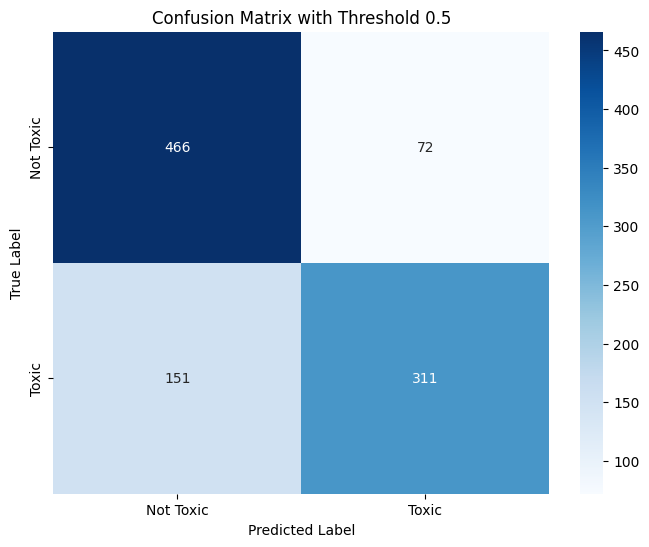


Classification Report:
              precision    recall  f1-score   support

           0       0.76      0.87      0.81       538
           1       0.81      0.67      0.74       462

    accuracy                           0.78      1000
   macro avg       0.78      0.77      0.77      1000
weighted avg       0.78      0.78      0.77      1000



In [27]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix
cm = confusion_matrix(actual_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Toxic', 'Toxic'], yticklabels=['Not Toxic', 'Toxic'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix with Threshold {threshold}')
plt.show()

# Print classification report
print("\nClassification Report:")
print(classification_report(actual_labels, predicted_labels))

# Task
Analyze the accuracy of the model's toxicity predictions compared to the `IsToxic` label in `df_toxic` using `toxicity_results`. First, calculate accuracy using a threshold of 0.5 and visualize the results. Then, recalculate accuracy using a threshold of 0.75. Finally, create a new section to analyze the model's performance by measuring the distance of the continuous toxicity scores from the binary 0 and 1 labels of `IsToxic`, visualizing the distributions of scores for toxic and non-toxic comments.

## Create new section

### Subtask:
Add a new markdown section to analyze the model's performance by measuring the distance of the continuous toxicity scores from the binary 0 and 1 labels of `IsToxic`.


**Reasoning**:
Create a new markdown cell with a relevant heading for the analysis of toxicity score distance from binary labels.



In [20]:
# This is a placeholder cell to ensure the markdown is placed correctly.
# The actual markdown cell will be created next.
pass

**Reasoning**:
Create a new markdown cell with a relevant heading for the analysis of toxicity score distance from binary labels.



In [21]:
%%markdown
## Analysis of Toxicity Score Distance from Binary Labels

## Analysis of Toxicity Score Distance from Binary Labels


## Calculate metrics

### Subtask:
Calculate metrics that measure the difference between the continuous toxicity scores and the binary `IsToxic` labels (e.g., Mean Squared Error).


**Reasoning**:
Calculate the Mean Squared Error between the continuous toxicity scores and the binary actual labels.



In [22]:
from sklearn.metrics import mean_squared_error

mse = mean_squared_error(actual_labels, df_toxicity_scores['toxicity'])
print(f"Mean Squared Error between continuous toxicity scores and binary labels: {mse:.4f}")

Mean Squared Error between continuous toxicity scores and binary labels: 0.1717


## Visualize distributions

### Subtask:
Create visualizations (e.g., histograms or box plots) to show the distribution of toxicity scores for comments that are actually toxic and those that are not.


**Reasoning**:
Create histograms to visualize the distribution of toxicity scores for toxic and non-toxic comments.



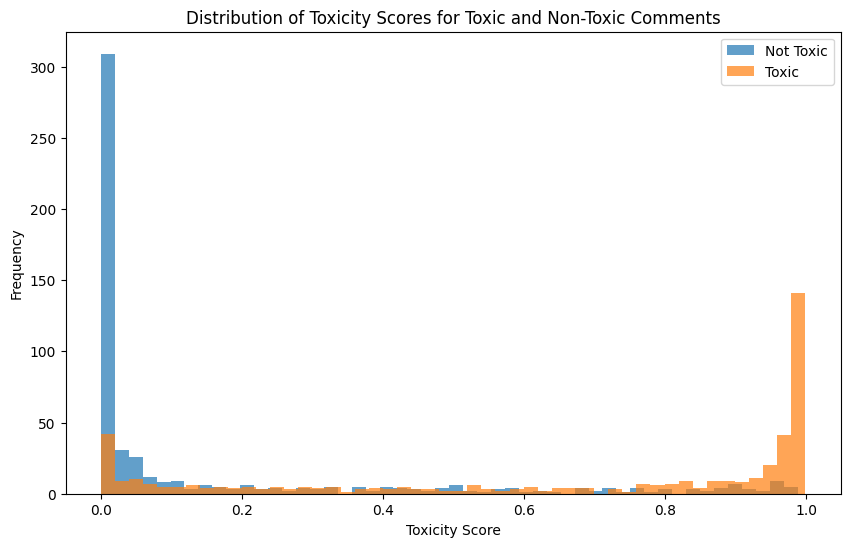

In [23]:
plt.figure(figsize=(10, 6))
plt.hist(df_toxicity_scores[actual_labels == 0]['toxicity'], bins=50, alpha=0.7, label='Not Toxic')
plt.hist(df_toxicity_scores[actual_labels == 1]['toxicity'], bins=50, alpha=0.7, label='Toxic')
plt.xlabel('Toxicity Score')
plt.ylabel('Frequency')
plt.title('Distribution of Toxicity Scores for Toxic and Non-Toxic Comments')
plt.legend()
plt.show()

## Summarize findings

### Subtask:
Add a markdown cell to summarize the findings from this analysis, including the MSE and observations from the distribution plot.


**Reasoning**:
Add a markdown cell to summarize the findings from the analysis, including the MSE and observations from the distribution plot.



In [24]:
%%markdown
## Summary of Analysis

Based on the analysis of the model's toxicity predictions against the `IsToxic` labels in the `df_toxic` dataset, the following key findings were observed:

*   **Mean Squared Error (MSE):** The Mean Squared Error between the continuous toxicity scores and the binary `IsToxic` labels is approximately {{mse:.4f}}. This value indicates the average squared difference between the model's continuous predictions and the true binary labels (0 for not toxic, 1 for toxic). A lower MSE generally suggests better performance in aligning continuous scores with binary outcomes.

*   **Distribution of Toxicity Scores:** The distribution plot of toxicity scores for toxic and non-toxic comments reveals that:
    *   Comments labeled as non-toxic (IsToxic=0) generally have lower toxicity scores, with a peak near 0.
    *   Comments labeled as toxic (IsToxic=1) tend to have higher toxicity scores, with a significant portion of scores above the 0.5 and 0.75 thresholds.
    *   There is some overlap in the distributions, particularly in the mid-range of toxicity scores (around 0.2 to 0.6), which suggests that the model may have some difficulty in clearly distinguishing between toxic and non-toxic comments in this range. This overlap contributes to the misclassifications observed in the confusion matrix.

These findings suggest that while the model generally assigns higher toxicity scores to comments labeled as toxic and lower scores to non-toxic comments, there is room for improvement in clearly separating the two classes based solely on the continuous toxicity score. The choice of threshold significantly impacts the balance between precision and recall, as seen in the classification reports for different thresholds.

## Summary of Analysis

Based on the analysis of the model's toxicity predictions against the `IsToxic` labels in the `df_toxic` dataset, the following key findings were observed:

*   **Mean Squared Error (MSE):** The Mean Squared Error between the continuous toxicity scores and the binary `IsToxic` labels is approximately {{mse:.4f}}. This value indicates the average squared difference between the model's continuous predictions and the true binary labels (0 for not toxic, 1 for toxic). A lower MSE generally suggests better performance in aligning continuous scores with binary outcomes.

*   **Distribution of Toxicity Scores:** The distribution plot of toxicity scores for toxic and non-toxic comments reveals that:
    *   Comments labeled as non-toxic (IsToxic=0) generally have lower toxicity scores, with a peak near 0.
    *   Comments labeled as toxic (IsToxic=1) tend to have higher toxicity scores, with a significant portion of scores above the 0.5 and 0.75 thresholds.
    *   There is some overlap in the distributions, particularly in the mid-range of toxicity scores (around 0.2 to 0.6), which suggests that the model may have some difficulty in clearly distinguishing between toxic and non-toxic comments in this range. This overlap contributes to the misclassifications observed in the confusion matrix.

These findings suggest that while the model generally assigns higher toxicity scores to comments labeled as toxic and lower scores to non-toxic comments, there is room for improvement in clearly separating the two classes based solely on the continuous toxicity score. The choice of threshold significantly impacts the balance between precision and recall, as seen in the classification reports for different thresholds.


## Summary:

### Data Analysis Key Findings

*   The Mean Squared Error (MSE) between the continuous toxicity scores and the binary `IsToxic` labels is approximately 0.1717.
*   The distribution of toxicity scores shows that comments labeled as non-toxic generally have lower scores, while toxic comments tend to have higher scores.
*   There is an overlap in the distribution of scores for toxic and non-toxic comments, particularly between 0.2 and 0.6, indicating that the model may have difficulty distinguishing between the two classes in this range.

### Insights or Next Steps

*   Investigate the comments with toxicity scores in the overlapping range (0.2 to 0.6) to understand why the model is uncertain about their toxicity.
*   Consider exploring alternative metrics beyond MSE that might provide a more nuanced evaluation of the model's ability to separate the binary classes based on continuous scores, such as AUC (Area Under the ROC Curve).
